In [3]:
import json
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import seaborn as sns
import plotly.graph_objs as go
%run DataBaseTraitement.ipynb
# from DataBaseTraitement import persisetDB as db

All existing tables: ()
l_recipe_ingredient user was found


In [4]:
def readJson(file):
    json_file = open(file, encoding='utf-8')
    data = json_file.read()
    recipes = json.loads(data)
    json_file.close()
    return recipes

In [5]:
def getListIngredient(recipesList):
    listIngre = []
    cpt_ingredient = {}
    frequence = 5
    for index, recipe in enumerate(recipesList):
        for i, ingredient in enumerate(recipe['ingredients']):
            if ingredient['nom_ingre'] not in listIngre:
                listIngre.append(ingredient['nom_ingre'])
                cpt_ingredient[ingredient['nom_ingre']] = 1
            else:
                  cpt_ingredient[ingredient['nom_ingre']] += 1

    d = sorted(cpt_ingredient.items(), key=lambda x: x[1], reverse=True)
#     print("counter:",d)
    for k,v in cpt_ingredient.items():
        if v < frequence or v >= 471:
            listIngre.remove(k)
    tmp = recipesList   
    for index, recipe in enumerate(recipesList):
        listIngreTmp = []
        for k, ingredient in enumerate(recipe['ingredients']):
            listIngreTmp.append(ingredient['nom_ingre'])
        if  any(x in listIngreTmp for x in listIngre) == False:
            del tmp[index]
            
    done = set() 
    newRecipes = []
    for key, value in enumerate(tmp):
        nom = value['nom'].lower()
        if nom not in done:
            done.add(nom)  # note it down for further iterations
            newRecipes.append(value)
    for key, value in enumerate(newRecipes):
        value['id_cluster'] = key

    print("Recettes après traitement:",len(newRecipes))
    return  listIngre,newRecipes

In [6]:
def createVector(listIngredient, ListRecette):
    dataset = []
    listProvisoire = []
    vectorSize = len(listIngredient)
    recetteSize = len(ListRecette)
    for i, recette in enumerate(ListRecette):
        vector = np.zeros(vectorSize)
        for index, ingredient in enumerate(recette['ingredients']):
            listProvisoire.append(ingredient['nom_ingre'])
            for k,listIngre in enumerate(listIngredient):
                if listIngre in listProvisoire:
                    vector[k]= 1
            listProvisoire = []
        dataset.append(vector)
#         print(dataset)
    return np.array(dataset)

In [7]:
#Inertia measures how well a dataset was clustered by K-Means
# It is calculated by measuring the distance between each data point and its centroid, 
#squaring this distance, and summing these squares across one cluster.
def chooseOptimalCluster(dataset):
    sse = []
    k_list = range(1, 15)
    for k in k_list:
        km = KMeans(n_clusters=k)
        km.fit(dataset)
        sse.append([k, km.inertia_])
    oca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
    plt.figure(figsize=(12,6))
    plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
    plt.title('Optimal Number of Clusters using Elbow Method (Scaled Data)')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')
    plt.show()

In [8]:
def kmeans(dataset, n_clusters):
    pca = PCA(70)# a changer
    #Transform the data
    dataset = pca.fit_transform(dataset)
    print("len dataset",len(dataset))
    kmeans = KMeans(n_clusters=n_clusters,init="random", random_state= 10)
    label = kmeans.fit_predict(dataset)
    centroids = kmeans.cluster_centers_
    u_labels = np.unique(label)
    plt.figure(figsize = (8,8))
    for i in u_labels:
        plt.scatter(dataset[label == i , 0] , dataset[label == i , 1] , label = i)
    plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color="black")
    plt.legend()
    plt.show()
    
    dataReturn = []
    for data in dataset:
        #generate an array with strings
        x_arrstr = np.char.mod('%f', data)
        #combine to a string
        x_str = ";".join(x_arrstr)
        dataReturn.append(x_str)
    return kmeans,dataReturn

In [9]:
# Using PCA to reduce the dataset into 3 principal 
def pca(dataset, n_clusters):
    kmeans_scale = KMeans(n_clusters=n_clusters, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(dataset)
    labels_scale = kmeans_scale.labels_
    pca2 = PCA(n_components=70).fit(dataset)
    pca2d = pca2.transform(dataset)
    plt.figure(figsize = (10,10))
    sns.scatterplot(pca2d[:,0], pca2d[:,1], 
                    hue=labels_scale, 
                    palette='Set1',
                    s=100, alpha=0.2).set_title('KMeans Clusters (4) Derived from Original Dataset', fontsize=15)
    plt.legend()
    plt.ylabel('PC2')
    plt.xlabel('PC1')
    plt.show()
    
    Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
    labels = labels_scale
    trace = go.Scatter3d(x=pca2d[:,0], y=pca2d[:,1], z=pca2d[:,2], 
            mode='markers',marker=dict(color = labels, colorscale='Viridis', 
            size = 10, line = dict(color = 'gray',width = 5)))
    layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
    data = [trace]
    fig = go.Figure(data = data, layout = layout)
    fig.show()


In [10]:
#Feature Reduction via PCA
def featureReduce(df_scale):
    n_components = len(dataset[0])
    pca = PCA(n_components=n_components)
    pca_scale = pca.fit(df_scale)
    print(pca_scale)
    variance = pca.explained_variance_ratio_
    var = np.cumsum(np.round(variance, 3)*100)
    plt.figure(figsize=(12,6))
    plt.ylabel('% Variance Explained')
    plt.xlabel('# of Features')
    plt.title('PCA Analysis')
    plt.ylim(0,100.5)
    plt.plot(var)
    
    
    #check the variance ratio
    pca = PCA(n_components=6)
    pca_scale = pca.fit_transform(df_scale)
    pca_df_scale = pd.DataFrame(pca_scale, columns=['pc1','pc2','pc3','pc4','pc5','pc6'])
    print("pourcentage of the first PCAs")
    print("we will use 70 features instead of 338")
    print(pca.explained_variance_ratio_)
    return pca_scale

In [11]:
# Applying KMeans to PCA Principal Components
def elbowPCA(pca_df_scale):
    sse = []
    k_list = range(1, 15)
    for k in k_list:
        km = KMeans(n_clusters=k)
        km.fit(pca_df_scale)
        sse.append([k, km.inertia_])

    pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
    plt.figure(figsize=(12,6))
    plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
    plt.title('Optimal Number of Clusters using Elbow Method (PCA_Scaled Data)')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')

In [12]:
# Silhouette analysis can be used to study the separation distance between the resulting clusters
def silhouette(pca_df_scale):
    kmeans_pca_scale = KMeans(n_clusters=4, 
    n_init=100, max_iter=400, init='k-means++', random_state=46).fit(pca_df_scale)
    print('KMeans PCA Scaled Silhouette Score: {}'.format(silhouette_score(pca_df_scale, 
    kmeans_pca_scale.labels_, metric='euclidean')))
    labels_pca_scale = kmeans_pca_scale.labels_

le nombre de recettes raw 2720
Recettes après traitement: 2576
PCA(n_components=512)
pourcentage of the first PCAs
we will use 70 features instead of 338
[0.03369927 0.02562648 0.02393627 0.0189118  0.01763962 0.01656111]
KMeans PCA Scaled Silhouette Score: 0.44289378994811196


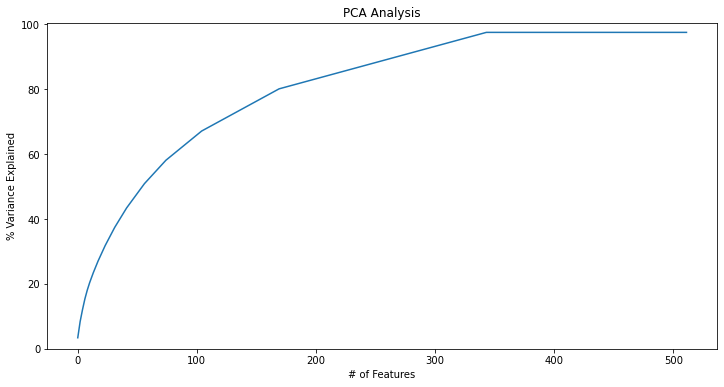

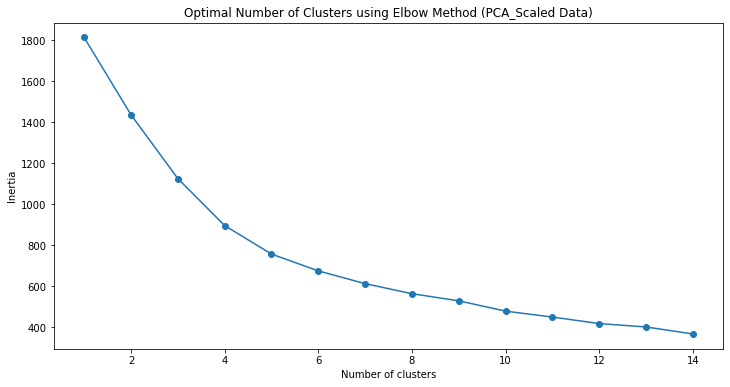

In [13]:
file = "test.json"
ListRecetteRaw = readJson(file)
print("le nombre de recettes raw",len(ListRecetteRaw))
listIngredient,listRecette = getListIngredient(ListRecetteRaw)
dataset = createVector(listIngredient, listRecette)
pca_scale = featureReduce(dataset)
elbowPCA(pca_scale)
silhouette(pca_scale)

In [14]:
def get_ingredients(recipes):
        dict = {}
        for r in recipes:
            for i in r.get('ingredients', []):
                id = i.get('id_ingre')
                if id in dict:
                    dict[id][1] += 1
                else:
                    dict[id] = [i.get('nom_ingre'), 1]
        return dict
def get_ingr_rank(recipes):
    dict = get_ingredients(recipes)
    return sorted(dict.items(), key=lambda i: i[1][1], reverse=True)
#         return {k: v for k, v in sorted(listIngre.items(), key=lambda item: item[1], reverse=True)}

In [15]:
def linkCluster(kmeans,dataset,recipes,n_clusters):
    print(dataset[0])
    recipes_db = []
    for label in range(n_clusters):
        label_index = [i for i, x in enumerate(kmeans.labels_) if x == label]
#         recipes_cluster = [recipes[index] for index in label_index]
        recipes_cluster = []
        for index in label_index:
            for recipe in recipes:
                 if(recipe['id'] == index):
                        recipes_cluster.append(recipe)
        ingredients_ranked = get_ingr_rank(recipes_cluster)
        print("\n\nCluster", label, ":")
        ranking_string = ""
        for index in range(len(ingredients_ranked)):
            ingredient = ingredients_ranked[index]
            if ingredient[1][1] != np.nan and ingredient[1][0] != np.nan:
                ranking_string += ingredient[1][0] + " (" + str(ingredient[1][1]) + "), "
        print(ranking_string + '\n')
        for index_recipe in label_index:
            for recipe in recipes:
                if(recipe['id_cluster'] == index_recipe):
                    recipe['cluster'] = label
                    recipe['coordonnees'] = dataset[index_recipe]
                    recipes_db.append(recipe)
#                     print("Id recette:",recipe['id'],'\n')
#                     print("Nom Recette:",recipe['nom'])
#                     print("List Ingredients:")
                    for ingrediet in recipe['ingredients']:
                        print(ingrediet['nom_ingre'])
    persisetDB(recipes_db)
    print("recipes_db",len(recipes_db))

len dataset 2576


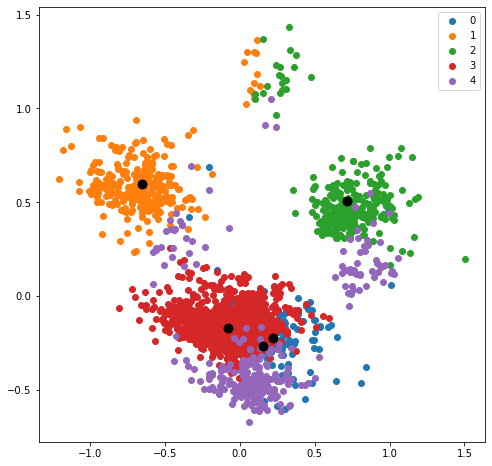

In [16]:
n_clusters = 5
k,d = kmeans(dataset,n_clusters)

In [17]:
linkCluster(k,d,listRecette,n_clusters)

-0.056926;-0.180642;-0.147323;-0.051926;-0.095910;0.048136;-0.092339;-0.126799;-0.055456;-0.112319;-0.058505;0.010903;-0.131292;-0.151503;-0.001013;-0.005560;-0.139083;-0.006329;0.138790;0.140088;-0.143234;-0.195954;-0.170199;-0.140134;-0.225105;0.017419;-0.110356;-0.350833;-0.099126;0.427031;-0.175811;0.105991;-0.057637;0.428617;0.021909;-0.062762;-0.034778;-0.182831;-0.011160;-0.130202;-0.005823;-0.013794;0.004487;-0.067787;0.075863;-0.055992;0.043137;0.011339;0.016138;-0.050514;-0.017640;-0.006776;-0.023329;-0.079711;0.022915;-0.080030;0.010037;-0.027958;-0.021659;0.082372;-0.099884;-0.027314;0.024687;0.024374;0.030607;0.012377;-0.003199;-0.025171;-0.017252;-0.044094


Cluster 0 :
pomme de terre (161), huile d'olive (160), eau (159), poivre (156), sel (147), thym (132), rôti de boeuf (114), bouillon de légumes (91), saumon frais (68), avocats (53), mangue (32), sauce teriyaki (23), vin rouge (14), persil (10), sel (3), poivre (2), chevreuil (1), marrons (1), marrons (1), 

poireaux


oignons
carottes
poireaux
pommes de terre
bouquet garni
reblochon
saucisses
lardons fumés
navets
chou
riz
oignons
huile
oeufs
crevettes
jambon
petits pois
pain de mie
oignons
persil
origan
poivre
sel
cumin
cannelle
citron
viande hachée
oeuf
ouzo
oignons
ail
champignon de Paris
tomate
bouillon de poule
poivre
sel
thym
gingembre
huile
palette
laurier
endives
pommes de terre
oignons
lardons
beurre
poivre
sel
vin blanc
courgette
oignons
huile d'olive
cubes de bouillon
sel
poivre
lentilles
oignons
crème fraîche
riz
champignons de Paris
beurre
échine de porc
viande
échalotes
jaune d'oeuf
bouillon de légumes
tomates
ail
oignons
vin blanc sec
thym
feuille de laurier
huile d'olive
poivre
sel
thon
champignon frais
endives
oignons
jambon
lard
raclette
tomates
oignons
gruyère râpé
ketchup
huile d'olive
herbes de Provence
sel
poivre
crème fraîche
jambon blanc
pâtes feuilletées
pommes de terre
tomates
lard fumé
oignons
persil
beurre
poivre
sel
poivrons
tomates
oignons
huile d'olive
sucre en poudre
c

lait
farine
gruyère râpé
champignon de Paris
sel
oeufs
dés de jambon
farine
sucre
lait
rhum
sucre vanillé
beurre
pomme
oeufs
lait
farine
courgettes
sel
poivre
oeufs
gruyère
bleu
farine
sucre
beurre
lait
sel
oeufs
farine
levure
lait
gruyère râpé
chorizo
oeufs
tomates séchées
poivrons rouges
lait
beurre
farine
champignon de Paris
sauce tomate
fromage râpé
penne
farine
sucre
pépites de chocolat
nappage chocolat
banane
lait
beurre
oeufs
moules
lait
beurre
sel
poivre
petits pois
fraises
banane
beurre de cacahuètes SKIPPY®
lait
farine
beurre de cacahuètes SKIPPY®
beurre
levure de boulanger fraîche
oeuf
lait
sucre en poudre
sel
huile
copeaux de chocolat
huile de tournesol
lait
courgette
pomme de terre
comté
sel
poivre
oeufs
jambon blanc
carotte
comté
lait
tabasco
huile d'olive
pâte feuilletée
poivron jaune
poivron vert
oeufs
carottes
lait
eau
ail
poivre
poivron vert
fromage de chèvre
gruyère
ciboulette
farine
levure chimique
huile d'olive
lait
graines de tournesol
basilic
oeufs
coppa
mozzarel

moutarde
tomates
sel
poivre
oeufs
crème fraîche épaisse
thon
ciboulette
lait
gélatine
crème liquide
sirop de menthe
lait
vanille
sucre
maïzena
rhum
chocolat noir
biscuits à la cuillère
jaunes d'oeuf
crème de marron
crème fraîche liquide
brisures de marrons glacés
farine
levure chimique
lait
chocolat
chocolat noir
lait
beurre
vanille
sucre semoule
farine
cacao amer
rhum
sel
oeufs
farine
sel
levure
eau
lait
beurre
chocolat
farine
lait
gruyère râpé
lardons
poivre
sel
oeufs
lait
gâteaux
crème dessert au chocolat
farine
beurre
sucre
levure de boulanger
sel
lait
oeufs
pâte brisée
oignons
courgettes
lait
poivre
sel
oeufs
crème fraîche liquide
farine
sucre
lait
beurre
levure
pâte à tartiner
oeufs
sucre
lait
farine
levure chimique
oeufs
yaourt nature
framboises
pâte brisée
lait
gruyère râpé
comté
sel
poivre
oeufs
crème liquide
roquefort
chèvre
farine
levure
lait
eau
beurre
sucre
sel
crème fraîche
cannelle
oeufs
endives
beurre
citron
sucre
maïzena
lait
muscade
parmesan râpé
sel
poivre
saumon fra

tomates
oignon
piment d'Espelette
basilic
poivre
sel
oeufs
bacon
oignon
moutarde
vin blanc
farine
comté
tomates cerise
courgette
pâte brisée
blancs de poulet
crème fraîche liquide
riz pour risotto
bouillon de volaille
asperge
oignon
parmesan râpé
huile d'olive
vin blanc sec
poivre
sel
mascarpone
oignon
beurre
fromage râpé
bouillon
croûtons
lardons
champignon de Paris
oignon
ail
persil
poulet
tomates pelées
oignon
gruyère râpé
beurre
porto
poivre
sel
jaunes d'oeuf
pain
champagne
oignon
eau
poivre
sel
beurre
maroilles
biscottes
tomate
pomme de terre
oignon
ail
huile d'olive
sucre en poudre
poivre
sel
thym
romarin
oignon
sucre en poudre
vin rouge
beurre
muscade
pâte brisée
épinards frais
crème épaisse
roquefort
oeufs
sel
poivre
épices
oignon
feuille de laurier
bourguignon
julienne
canard
oignon
persil
poivre
sel
lait
baguette
steaks
oeufs
champignon de Paris
oignon
vin blanc
maïzena
gruyère râpé
persil
poivre
sel
beurre
noix de saint-jacques
crevettes
crème fraîche liquide
chapelure
poivr

tomates
vin blanc sec
piments
oignon
ail
huile d'olive
origan
coriandre
feuilles de laurier
cube de bouillon
sel
poivre
emmental
viande
feta
pâte grecque
tomates pelées
échalotes
olives noires
Pili Pili
pommes de terre
carottes
oignon
céleri
poireaux
ail
chou
navets
haricot
poitrine fumée
courgettes
carottes
oignon
beurre
thym
poivre
sel
riz
courgettes
comté
lait
oignon
huile
oeuf
lardons
carottes
oignon
ail
vin blanc
farine
pommes de terre
jarret de porc
saucisses
lentilles
lardons
oignon
tomates
lait
ail
origan
épices
poivre
steaks
miel liquide
oignon
ail
citron
farine
persil
huile
poivre
sel
poulet
noisettes
oeufs
champignon de Paris
oignon
sauce soja
riz thaï
jambon
oeuf
crevettes
porc
boeuf
ciboulette
ail
oignon
cumin en poudre
curry
persil
poivre
sel
saumon
crevettes
briques
lardons
carottes
oignon
ail
bouquet garni
poivre
sel
huile
eau
moutarde
saucisses de Montbéliard
lentilles
lentilles corail
tomates
oignon
cumin
poivre
sel
persil
courgette
oignon
riz
bouillon de volaille
poi

cantal
estragon
crème liquide
pommes
oignon
lardons
pomme
vin blanc
poivre
sel
muscade
cannelle
sucre en poudre
moutarde
rôti de porc
oignon
huile d'olive
sel
poivre
pâte feuilletée
filet mignon
cidre
livarot
jaune d'oeuf
oignon
lardons
courgette
tomate
thym
poivron vert
poivron rouge
oeuf
crème fraîche liquide
mozzarella
farine
farine
farine
huile d'olive
sel
farine de riz
oeuf
farine
poivre
sel
oignon
viande hachée
oeuf
ail
carottes
oignon
pommes de terre
concentré de tomates
bouquet garni
bouillon de boeuf
farine
boeuf
madère
pinot noir
beurre salé
lardons
carottes
pommes de terre
céleri
oignon
ail
beurre
cube de bouillon
thym
poivre
sel
potiron
navets
laurier
vin rouge
oignon
ail
champignon de Paris
huile d'olive
boeuf
coulis de tomate
olives vertes
pâte brisée
courgettes
beurre
oignon
poivre
sel
feta
oeufs
crème épaisse
oignon
ail
comté
poivre
sel
muscade
beurre
canneloni
épinards
escalope de porc
oeuf
coulis de tomate
carotte
oignon
ail
citron
concentré de tomates
tomates
beurre


pâte feuilletée
saumon fumé
crème fraîche allégée
sucre
eau
sucre en poudre
sucre en poudre
beurre
farine
rhum
citron
levure
ananas
oeufs
levure
yaourt
yaourt
sucre vanillé
yaourt
beurre
oeufs
yaourt nature
jus de citron
aneth
poivre
pâte feuilletée
saumon fumé
noix de saint-jacques
boursin
crème fleurette
ciboulette
jaune d'oeuf
vinaigre balsamique
huile d'olive
ail
basilic
tomates
parmesan râpé
fonds d'artichaut
avocat
mozzarella
Parmesan
fleur de sel
poivre
piment d'Espelette
ail
huile d'olive
huile
fonds d'artichaut
ciboulette
crème
tomates séchées
moutarde
vinaigre
poivre
sel
échalotes
crème fraîche liquide
pomme
sucre
rhubarbe
banane
cassonade
rhubarbe
noisettes
courgettes
parmesan râpé
huile d'olive
ail
poivre
sel
blanc de poulet
oeuf
chapelure
herbes
pommes
farine
sucre
beurre
rhubarbe
fraises
écorces d'oranges confites
beurre
farine
sucre
rhubarbe
crème liquide
courgette
tomates
emmental
ail
sel
poivre
beurre
huile d'olive
mozzarella
chapelure
échalote
sucre en poudre
farine
b

légumes
crème végétale
eau
choucroute
sucre brun
carotte
noix de coco rapée
levure chimique
maïzena
sucre
beurre
oeufs
eau
maïzena
moutarde
vinaigre
huile
poivre
sel
poireaux
purée
curry
poivre
sel
yaourt
citron
tabasco
sucre en poudre
radis
betterave
thon
oeufs
ricotta
lait demi-écrémé
sucre vanillé
bicarbonate
sucre
sel
oeufs
farine de châtaigne
beurre demi-sel
fécule de maïs
huile d'olive
levure de boulanger
sel
farine de riz
eau
huile d'olive
vin blanc
poivre
thym
steaks
anchois
radis
radis
chocolat noir
beurre tendre
sucre
noix de coco rapée
farine de riz
oeufs
noisettes
maïzena
lait de soja
eau
cube de bouillon
poivre
muscade
margarine
noix de coco rapée
sucre en poudre
farine
oeuf
moutarde
miel
vinaigre balsamique
huile
ail
poivre
sel
huile
vinaigre
moutarde
poivre
sel
échalote
sauce maggi
ail
huile d'olive
sel
poivre
courge spaghetti
pulpe de tomate
coulis de tomate
crème liquide
poireaux
huile
vinaigre
oeuf
échalote
tomate
pomme de terre
huile d'olive
poivre
sel
persil
ail
cit

banane
farine
beurre
levure chimique
sel
sucre en poudre
vanille
chocolat
noix
oeuf
pain
lardons fumés
jaune d'oeuf
Bouillon KUB OR MAGGI
beurre
oeufs
crème liquide
fromage râpé
spaghetti
bacon
Sauce soja classique Kikkoman®
pecorino romano
jaunes d'oeuf
poivre
carotte
fécule de pomme de terre
gruyère râpé
poivre
sel
persil
petit suisse
oeufs
aubergine
tomates
carottes
courgettes
riz
bouillon de volaille
chipolata
poivron rouge
sauce soja
thym
ail
huile de tournesol
poivre
blancs de poulet
sauce soja
sucre
sauce soja
sauce soja
huile
gingembre
sucre
poivre
sel
escalopes de poulet
fécule
légumes
bananes
beurre
cassonade
farine
levure chimique
oeuf
vodka
limonade (soda, sprite, 7up)
sirop de grenadine
carotte
champignon de Paris
gruyère râpé
huile d'olive
oeufs
échalote
fond de volaille
ciboulette
sauce soja
beurre
huile d'olive
fleur de sel
saumon
paprika
poivre
sel
carré frais
brick
saumon fumé
jambon
ciboulette
crème liquide
rhum
citrons
crémant
jus d'orange
jus d'ananas
sirop de sucr

fromage blanc
citron
jus de citron
gélatine
thé
oeufs
thé
beurre
beurre
petit beurre
sel
poivre
basilic
huile d'olive
fromages de chèvre
betterave
sucre
levure
beurre
sucre vanillé
farine
sel
oeufs
aubergines
ail
Parmesan
origan
huile d'olive
brique
feta
beurre
cassonade
sirop d'érable
oeufs
poudre de noisette
farine de blé
levure chimique
sel
cacao
sucre
pâte sablée
ananas
oeufs
tomates
huile d'olive
mozzarella
basilic frais
Knacki Original HERTA®
Pâte Feuilletée TARTE EN OR® Sans Huile de Palme HERTA®
cheddar
jaune d'oeuf
moutarde
graines de sésame
farine
sel
huile
levure
eau
oeuf
moutarde
moutarde
citrons
ail
crevettes
Fines herbes
yaourt
farine
sucre
huile
levure
chocolat noir
chocolat au lait
chocolat blanc
oeufs
colorant
sucre en poudre
sucre glace
farine
chocolat pâtissier
noix de coco rapée
beurre
levure chimique
sel
oeufs
jus de citron
sucre
fromage frais
yaourt nature
gélatine en poudre
biscuit
biscuit
beurre
cannelle
beurre
sucre glace
chocolat amer
oeufs
beurre
sucre
maïzen

tomates
persil
thym
poivre
sel
huile d'olive
citron
saumon
lentilles
échalote
laurier
vinaigre de xérès
muesli
flocons d'avoine
beurre
chocolat noir
blé
oeuf
miel liquide
sel
paprika
céréale
asperges
tomate
huile d'olive
sel
poivre
aneth
saumon
fromage frais
sauce tomate
asperges
huile d'olive
sel
brick
saumon
graines de courge
flocons d'avoine
graines de tournesol
sirop d'érable
blancs d'oeuf
noix de pécan
farine
beurre
sucre en poudre
sel
oeufs
sucre en grain
chocolat au lait
chocolat noir
beurre
pralinoise
crème liquide
corn flakes
griotte
griotte
beurre tendre
sucre glace
farine
cacao
beurre demi-sel
poudre d'amandes
jaunes d'oeuf
beurre tendre
beurre tendre
sucre glace
farine
beurre demi-sel
jaunes d'oeuf
poudre d'amandes
beurre
champignon de Paris
vin blanc
thym
poivre
sel
coquilles saint-jacques
échalote
crème
estragon
chocolat noir
fruit confit
beurre
céréale
abricot
farine
cassonade
fromage blanc
oeufs
céréale
carotte
huile d'olive
vin blanc sec
herbes de Provence
fleur de sel

curry
tomates cerise
pain
fromage frais
basilic frais
menthe
melon
jambon cru
feta
pastèque
mini mozzarella
olives noires
vinaigre balsamique
poivre
sel
haricots verts
avocat
écrevisse
pignons
huile de truffe
cerfeuil
vin rouge
lardons
saucisson
chorizo
emmental
pâte à pizza
coulis de tomate
blanc de poulet
thon
concentré de tomates
tomates
pâte à pizza
thon
maïs
mozzarella
herbes
vinaigre
huile de colza
sauce soja
poivre
chou
oignon rouge
courgettes
moutarde
poivre
sel
escalopes de poulet
Vache qui rit®
poivrons
huile d'olive
ail
feuille de laurier
câpres
vinaigre
marjolaine
courgette
huile d'olive
poivre
sel
curry
muscade
escalopes de poulet
oignons blancs
menthe
brick
huile d'olive
paprika
piment d'Espelette
persil
citron
sel
poivre
chipiron
céleri
pommes
noix de cajou
persil
yaourt
poivre
sel
sauce soja
chou
ciboulette
mayonnaise
beurre
sucre glace
farine
farine
beurre
sucre
oeufs
sucre
lait demi-écrémé
vanille
maïzena
jaunes d'oeuf
sucre
sucre vanillé
farine
beurre
oeuf
chocolat n

chocolat noir
sucre en poudre
chocolat blanc
oeufs
framboises
crème fraîche liquide
farine
levure
beurre
sucre
rhum
chocolat blanc
oeufs
amandes
cranberries
crème végétale
graines de courge
sucre en poudre
sel
quatre-épices
huile
beurre tendre
sucre
cassonade
farine
flocons d'avoine
levure chimique
sel
noix de coco rapée
oeuf
noix de macadamia
betterave
citron
ail
persil
pois chiches
coriandre
tahin
crème fraîche épaisse
graines de courge
huile d'olive
poivre
sel
sucre
vanille
chocolat noir
chocolat
oeufs
crème
tomate
ail
huile d'olive
basilic
baguette
mozzarella
jambon de Parme
tapenade
chocolat
beurre
beurre
sucre en poudre
sucre vanillé
farine
levure chimique
oeufs
cerneau de noix
citrons
sucre en poudre
beurre
agar-agar
citrons
citrons
sucre en poudre
oeufs
mascarpone
spéculoos
spéculoos
framboises
beurre
sucre en poudre
farine
cacao
sucre glace
oeuf
poudre d'amandes
sucre en poudre
farine
sucre glace
sucre vanillé
oeufs
chocolat noir
sucre en poudre
cassonade
jaunes d'oeuf
crème f

gingembre
sel
poivre
escalopes de dinde
salade
beurre
homards
flétan
saumon
blancs d'oeuf
crème fraîche épaisse
baies roses
cresson
noix
huile d'olive
eau
sel
poivre
courgettes
lardons
comté
huile d'olive
farine
poivre
sel
oeufs
crème liquide
canneloni
tomates pelées
gruyère
carottes
courgettes
aubergine
ail
piments
concentré de tomates
curcuma
piment d'Espelette
curry
poivre
sel
steaks
navets
chou
poivron vert
poivron rouge
bouillon de légumes
sucre
coing
farine
levure chimique
sel
sucre
crème liquide
pâte brisée
poivre
sel
cresson
thon
oeufs
brique
tomate
fromage blanc
jus de citron
saumon fumé
ciboulette
beurre
sucre
oeuf
miettes de pain
farine
bicarbonate
sel
pépites de chocolat
courgettes
carottes
pommes de terre
bouquet garni
poivre
cresson
bouillon
purée
ail
persil
farine
oeuf
lasagnes
ail
parmesan râpé
huile d'olive
beurre
muscade
thym
poivre
sel
épinards
ricotta
tomates pelées
haricots rouges
tomates
vinaigre balsamique
huile
moutarde
poivre
maïs
thon
laitue
menthe
raifort
cit

spéculoos
fraises
crème fraîche
fromage blanc
sucre
fraises tagada®
mascarpone
oeufs
fraises
chocolat
beurre
sucre
crème fraîche
farine
levure
sucre vanillé
sel
oeufs
crème fleurette
sucre
eau
beurre
crème fraîche
vin blanc sec
ail
beurre
crème fraîche
piment de Cayenne
poivre
sel
queue d'écrevisse
fumet de crustacé
échalotes
bourbon
fromage blanc
sucre semoule
farine
crème fraîche
extrait de vanille
oeufs
biscuit
biscuit
beurre doux
muscade
lait
chocolat noir
crème fraîche
sucre
extrait de vanille
cannelle
chocolat au lait
crème fraîche
lait entier
crème chantilly
crème fraîche
bouillon de volaille
huile
poivre
sel
poulet
citrons verts
échalote
sucre
crème fraîche
oeufs
ananas
beurre
beurre tendre
sucre fin
sucre vanillé
citron
crème fraîche
gélatine
eau
miel liquide
sucre brun
fromage frais
framboises
sucre vanillé
kirsch
pomme
pomme
sucre vanillé
gélatine
crème fraîche
ananas
farine
farine
sucre
huile de tournesol
levure chimique
vanille
beurre
oeufs
ananas
ananas
confiture d'abrico

lardons
oignon
bouquet garni
crème fraîche
farine
beurre
poivre
sel
paupiettes de veau
bière blonde
crème fraîche
curry
safran
moules
jus de cuisson
oeufs
pâte feuilletée
carottes
oignon
ail
vin blanc sec
crème fraîche
beurre
poivre
sel
calamar
blanc de poireau
huile d'olive
crème fraîche
sel
lapin
moutarde à l'ancienne
vin blanc sec
oignon
crème fraîche
farine
persil
sel
poivre
moules
jaune d'oeuf
pâte brisée
crème fraîche
lardons
poivrons
sirop d'érable
poivre
sel
huile d'olive
oeufs
fromage de chèvre
pâtes
crème fraîche
paprika
poivre
sel
viande
crème fraîche
poivre
emmental
courge
jambon
fromage frais
crème fraîche
persil
ail
sel
poivre blanc
moutarde
poisson
échalote
gruyère râpé
crème fraîche
persil
thon
crabe
saumon
oeufs
sel et poivre
miel
paprika
crème fraîche
escalopes
pommes de terre
tomate
crème fraîche
pâte feuilletée
tomme
oeufs
lard
huile
ail
crème fraîche
poivre
sel
lardons fumés
pain
oeufs
ciboulette
crème fraîche
riz basmati
citron
sucre vanillé
sucre
eau
oeuf
ail
tom

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("os\ à\ moelle","1","https://assets\.afcdn\.com/recipe/20170621/69108_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("sauce\ teriyaki","2","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("sanglier","3","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("citrons\ confits","4","https://assets\.afcdn\.com/recipe/20170607/67484_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("cornette","5","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("ramen","144","https://assets\.afcdn\.com/recipe/20210119/117444_w96h96c1cx1466cy1466cxb2932cyb2932\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("steak","145","https://assets\.afcdn\.com/recipe/20170621/69170_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("pains\ pita","146","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("céleri\ branche","147","https://assets\.afcdn\.com/recipe/20210125/117605_w96h96c1cx295cy295cxb591cyb591\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("blanc\ de\ dinde","148","https://assets\.afcdn\.com/recipe/20170621/68965_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,i

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("beurre\ allégé","209","https://assets\.afcdn\.com/recipe/20170621/68917_w96h96c1cxb300cyb300\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("lotte","210","https://assets\.afcdn\.com/recipe/20170607/67413_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("bonbons","211","https://assets\.afcdn\.com/recipe/20170607/67624_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("poitrine\ de\ porc","212","https://assets\.afcdn\.com/recipe/20170621/69134_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("Condiments","213","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("côtes\ d'agneau","285","https://assets\.afcdn\.com/recipe/20171206/75866_w96h96c1cx2808cy1872cxb5616cyb3744\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("écorce\ d'orange","286","https://assets\.afcdn\.com/recipe/20170621/69028_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("épices\ à\ couscous","287","https://assets\.afcdn\.com/recipe/20210118/117379_w96h96c1cx866cy866cxb1732cyb1732\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("selle\ d'agneau","288","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("agneau","289","https://assets\.afcdn\.com/recipe/20170607/67664_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
 

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("tube\ de\ Lait\ Concentré\ Sucré\ à\ pâtisser\ NESTLE\ 170\ g","351","https://assets\.afcdn\.com/recipe/20181128/84371_w96h96c1cx1200cy1200cxb2400cyb2400\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("Chocolat\ NESTLÉ\ DESSERT\ Blanc","352","https://assets\.afcdn\.com/recipe/20190108/85695_w96h96c1cx1200cy1200cxb2400cyb2400\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("liqueur\ de\ litchi","353","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("kakis","354","https://assets\.afcdn\.com/recipe/20171229/76421_w96h96c1cx1800cy1750cxb3600cyb3500\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("grenades","355","https://assets\.afcdn\.com/recipe/20170621/69

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("germes\ de\ soja","554","https://assets\.afcdn\.com/recipe/20170607/67678_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("cuisse\ de\ poulet","555","https://assets\.afcdn\.com/recipe/20170607/67722_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("pain\ aux\ céréales","556","https://assets\.afcdn\.com/recipe/20180116/76798_w96h96c1cx2750cy2750cxb5500cyb5500\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("steak\ haché","557","https://assets\.afcdn\.com/recipe/20210629/120930_w96h96c1cx411cy411cxb822cyb822\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("Tomme\ de\ Savoie","558","https://assets\.afcdn\.com/recipe/20210412/119302_w96h96c1cx411cy411cxb822cyb822\.jpg");
INGREDIENT :  insert 

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("champignons","758","https://assets\.afcdn\.com/recipe/20170607/67739_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("bacon","759","https://assets\.afcdn\.com/recipe/20170607/67592_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("pain\ pour\ hamburger","760","https://assets\.afcdn\.com/recipe/20180116/76794_w96h96c1cx2350cy2350cxb4700cyb4700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("moutarde\ de\ Meaux","761","https://assets\.afcdn\.com/recipe/20180116/76811_w96h96c1cx2040cy1785cxb4081cyb3571\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("vin\ rouge","762","https://assets\.afcdn\.com/recipe/20170607/67416_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
          

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("roquette","957","https://assets\.afcdn\.com/recipe/20170607/67399_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("pain\ de\ seigle","958","https://assets\.afcdn\.com/recipe/20170621/69112_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("herbes\ de\ Provence","959","https://assets\.afcdn\.com/recipe/20170607/67728_w96h96c1cx2144cy1424\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("brocoli","960","https://assets\.afcdn\.com/recipe/20170607/67718_w96h96c1cx1250cy1250\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("pain\ complet","961","https://assets\.afcdn\.com/recipe/20170621/69111_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("moutarde\ de\ Dijon","1156","https://assets\.afcdn\.com/recipe/20170621/69095_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("merlan","1157","https://assets\.afcdn\.com/recipe/20170607/67638_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("lardons","1158","https://assets\.afcdn\.com/recipe/20170607/67383_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("chou\ chinois","1159","https://assets\.afcdn\.com/recipe/20170607/67409_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("tortellini","1160","https://assets\.afcdn\.com/recipe/20180202/77330_w96h96c1cx1728cy1152cxb3456cyb2304\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredien

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("92","Rognons sauce au vin","Plat principal;Viande;Abats;Rognons","https://assets.afcdn.com/recipe/20170108/19386_w1000h1000.jpg","0","NO VALUES","10 min","20 min","-","très facile","bon marché","1","0.187963;-0.247441;-0.158655;0.632797;-0.554378;0.014598;0.373381;0.355776;0.439137;-0.328581;0.016931;0.190642;-0.205831;0.046247;-0.237179;0.077755;-0.186284;-0.062860;0.320425;-0.052453;0.112783;0.191600;0.015029;-0.046777;-0.191166;0.013409;-0.011058;0.069734;0.095198;-0.121062;-0.178022;0.072931;0.083560;-0.186323;0.231177;0.136722;-0.002724;0.165617;-0.103327;-0.168284;-0.054071;-0.155779;-0.147418;-0.015108;-0.176145;0.004439;0.223385;-0.155263;0.195776;-0.088671;-0.137079;0.279750;-0.059151;-0.109452;0.325959;0.049841;0.332027;-0.022243;-0.134443;-0.21108

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("207","Petit déjeuner simple et équilibré (lait, flocons d'avoine et fruits)","Recettes","https://assets.afcdn.com/recipe/20150615/62427_w1000h1000.jpg","1","NO VALUES","10 min","7 min","-","facile","bon marché","1","-0.590715;0.498731;0.121654;0.042140;-0.249934;0.176323;0.018784;-0.010467;-0.114848;0.015667;-0.030290;-0.335512;-0.254527;0.134541;0.141768;0.035845;-0.011259;0.015103;0.017895;0.015408;0.011064;0.153407;0.064531;-0.217034;0.048979;0.142301;-0.060395;-0.082988;-0.004680;-0.218346;-0.138172;-0.219499;-0.344577;0.163476;0.228681;-0.106205;-0.129314;0.131828;0.344915;0.023733;0.195229;0.142711;-0.006098;-0.083030;0.154426;0.051776;-0.073967;-0.135814;0.007454;0.197145;0.018511;-0.070827;0.079154;0.093966;0.128046;-0.013203;0.037399;0.006115;0.0195

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("418","Gaufre à la semoule au chocolat et aux amandes","Dessert;Gaufre","https://assets.afcdn.com/recipe/20181008/82546_w1000h1000.jpg","1","NO VALUES","9 min","20 min","-","facile","bon marché","1","-0.706394;0.738550;0.071969;0.662614;0.417984;-0.069453;-0.146749;-0.061637;-0.288066;-0.241718;0.152303;-0.359414;-0.029021;-0.124457;-0.101927;-0.062625;-0.173311;-0.148762;0.054905;0.077706;-0.263947;0.133892;-0.228882;0.326872;0.302891;0.010232;-0.061168;-0.071187;0.094898;0.096664;-0.044734;-0.309433;0.044207;-0.271909;-0.027716;-0.481767;-0.010674;-0.003253;-0.029920;-0.212226;-0.138249;-0.238223;0.212276;-0.083341;-0.478936;-0.216029;0.207221;0.142429;-0.209843;0.153581;0.111925;-0.100143;0.277478;-0.035746;-0.000502;-0.110506;-0.036802;-0.029704;-0.012243

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("696","Terrine de foies de volaille facile","Plat principal;Viande;Abats;Foie","https://assets.afcdn.com/recipe/20140109/15585_w1000h1000.jpg","2","NO VALUES","15 min","55 min","-","très facile","bon marché","1","0.514897;0.501959;-0.193698;-0.341793;0.164440;-0.416098;-0.366327;-0.093215;0.624043;0.417457;-0.277645;-0.086028;-0.152696;0.093861;-0.136584;0.054206;-0.152532;0.049562;0.056285;0.038590;-0.074876;0.027899;-0.086063;-0.020241;-0.089260;-0.121877;-0.076789;-0.016795;-0.050310;-0.020012;-0.002115;0.003140;-0.104364;-0.095801;-0.034589;0.012738;0.034359;-0.041032;0.100733;0.105758;-0.091671;0.075293;0.024163;-0.002871;-0.048269;0.015184;-0.044397;0.024066;-0.057681;-0.053505;-0.004589;-0.025156;0.030639;0.081889;0.017121;0.042256;-0.039020;-0.009066;

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("735","Soupe lentilles corail merguez","Plat principal;Viande;Viande rôtie;Saucisses","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","2","NO VALUES","5 min","20 min","-","très facile","bon marché","1","0.625033;0.328962;-0.234253;-0.481309;0.415341;-0.173322;1.011662;-0.243829;-0.311935;0.447498;-0.042202;0.123949;-0.002590;0.013411;-0.136043;0.038712;-0.146029;-0.024237;0.185095;0.054495;-0.072257;-0.039764;0.134067;-0.063041;0.096789;-0.031425;-0.087218;-0.002154;-0.148644;-0.030161;-0.049262;0.127724;0.205051;0.011553;-0.076961;-0.199789;0.217932;0.023358;0.301335;-0.006397;-0.269154;0.076781;-0.197720;0.209314;-0.057105;0.153493;0.171405;-0.291630;-0.120386;0.000094;-0.095501;-0.296305;-0.101067;0.025188;-0.012378

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("832","Poutine typiquement québécoise","Plat principal;Plats au fromage;Poutine","https://assets.afcdn.com/recipe/20200622/112176_w1000h1000.jpg","3","NO VALUES","15 min","10 min","-","facile","bon marché","1","-0.011215;-0.183616;-0.141010;-0.070519;-0.082955;0.150042;-0.064428;0.056688;-0.010820;-0.038719;-0.103184;-0.087136;-0.043697;-0.250316;-0.060472;-0.212719;-0.006514;0.075093;-0.063795;-0.043668;-0.105424;-0.131114;-0.057750;0.039926;-0.094806;0.128596;-0.057886;0.009833;-0.101463;-0.201235;-0.020620;-0.085925;0.011604;-0.104279;-0.159378;-0.031815;-0.102535;-0.093332;0.203803;0.293259;-0.066117;-0.154377;0.069496;0.040877;0.283447;-0.377996;0.053518;0.127384;0.029773;-0.043569;-0.185335;-0.013722;-0.108043;-0.060051;0.002037;-0.017981;-0.043415;0.02

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("928","Mousse chocolat blanc et chocolat noir","Dessert;Mousse","https://assets.afcdn.com/recipe/20130108/17788_w1000h1000.jpg","3","NO VALUES","20 min","5 min","-","facile","bon marché","1","-0.372957;-0.196616;-0.285836;-0.386668;0.098429;-0.172989;-0.244581;0.425462;0.136170;-0.361766;0.019205;0.612474;0.655447;0.235899;0.031084;-0.520233;-0.262498;-0.228096;0.094665;0.062160;-0.079253;0.219098;0.013208;-0.089714;0.398272;0.175730;-0.161908;-0.105085;0.005016;-0.022256;-0.151380;0.001977;-0.019085;0.057020;-0.207516;-0.120376;-0.102661;0.031522;-0.247698;0.179921;0.158207;0.535153;-0.222736;0.111456;0.210459;0.018756;-0.000114;-0.133380;0.005627;0.041638;-0.055015;0.050418;0.073292;-0.114309;0.088598;-0.074622;0.068177;-0.036657;0.036487;-0.060952;0.007878

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1124","Vinaigrette allégée","Sauce salée;Vinaigrette","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","3","NO VALUES","15 min","10 min","-","très facile","bon marché","1","0.045467;-0.007674;-0.358339;0.622167;0.931888;0.065089;0.344678;-0.755792;-0.141501;-0.182916;0.100726;-0.032482;0.324576;0.058903;0.288409;-0.181554;0.046297;-0.035731;-0.139445;-0.235294;-0.248219;0.201409;0.106221;-0.378999;-0.272024;-0.171717;0.227187;0.071753;0.333334;-0.214217;-0.267490;0.160642;0.118334;-0.181442;0.149929;0.089400;0.015088;0.091312;0.003382;-0.071420;-0.120974;-0.072669;-0.181497;-0.182150;-0.052521;-0.088900;0.267830;0.154449;0.251177;-0.121282;-0.249252;0.224769;-0.045184;-0.053129;0.315854;-0.265608;0.394710;-0.080001;-0.

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1301","Soupe de potimarron","Entrée;Entrée chaude;Soupe","https://assets.afcdn.com/recipe/20130910/44367_w1000h1000.jpg","3","NO VALUES","10 min","30 min","-","très facile","bon marché","1","-0.070665;-0.181582;-0.271364;-0.186333;0.344448;0.308082;0.573637;-0.490651;0.160291;-0.080790;0.013941;0.021710;-0.019550;-0.009918;0.010784;-0.030506;-0.010729;-0.033801;0.046180;0.049691;0.012961;-0.113622;0.043058;-0.025890;-0.018407;0.034274;-0.019336;-0.053767;-0.047205;-0.081044;-0.013956;-0.031863;-0.010418;-0.044056;-0.008229;0.002842;0.000093;0.014982;0.005664;0.042528;0.026611;0.046100;0.035569;0.019661;-0.021854;0.005471;-0.011286;0.005440;0.014570;0.007385;-0.024167;-0.005236;0.009021;0.027840;0.035210;0.054781;-0.029084;0.030268;0.035280;-0.013113;0.010560

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1523","Chicken burger","Plat principal;Viande;Viande rôtie;Hamburger","https://assets.afcdn.com/recipe/20191224/105747_w1000h1000.jpg","3","NO VALUES","20 min","15 min","-","facile","bon marché","1","0.022656;-0.205750;-0.207654;-0.051176;-0.181975;-0.057826;-0.226964;-0.241658;0.035668;-0.002842;0.053307;-0.117244;-0.163319;-0.055264;0.013025;0.059712;-0.180448;-0.009659;-0.061615;0.177777;-0.099048;0.090871;0.340474;-0.009612;-0.063776;0.124502;0.346347;0.036133;0.101564;0.199456;0.093523;0.007637;0.125200;0.060742;-0.238192;0.156897;-0.321794;0.054923;0.148540;0.027673;-0.107381;0.032493;0.171788;-0.161943;-0.014829;0.014422;0.061218;-0.142771;-0.059838;0.101140;0.211829;0.204024;-0.209350;-0.301229;-0.007163;0.414607;0.142572;-0.059065;-0.185643;0.027759

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1730","rillettes de saumon au carré frais","Apéritif ou buffet;Apéritif dînatoire;Dip et tartinade;Rillettes","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","3","NO VALUES","10 min","-","-","facile","bon marché","1","0.082447;-0.281261;-0.142417;0.144775;-0.652069;-0.896066;0.618242;0.012212;-0.323436;-0.129036;-0.297951;0.269724;0.473527;0.116101;-0.470992;-0.195165;0.020252;0.006477;0.136730;-0.088334;-0.091313;0.205099;0.193955;-0.019410;0.267787;0.261280;-0.148222;-0.049962;-0.046146;-0.159021;-0.189517;-0.021891;-0.082258;-0.014977;-0.088241;0.008948;-0.107163;-0.024474;0.049379;-0.169148;0.101164;-0.083337;-0.108227;-0.055715;-0.017605;0.062248;0.113242;0.084578;-0.075284;-0.150053;-0.033053;-0.051178;0.115262;

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("2060","Gâteau au chocolat et aux noix","Dessert;Gâteau;Gâteau au chocolat","https://assets.afcdn.com/recipe/20141018/31257_w1000h1000.jpg","3","NO VALUES","30 min","40 min","-","moyenne","bon marché","1","-0.629502;-0.054209;-0.270876;-0.331757;0.408137;-0.372358;-0.105200;0.755403;0.277139;-0.124065;0.437266;0.477090;0.226312;-0.495863;0.277362;0.187775;0.095680;-0.000065;-0.154950;0.011442;0.346514;-0.385877;0.352698;-0.308278;-0.045863;0.082865;-0.010419;-0.017879;0.101094;0.026719;-0.182768;0.022013;0.050661;-0.101998;0.208703;-0.143942;-0.037491;0.021800;0.103402;-0.105128;-0.163634;-0.223940;0.188434;0.046134;-0.466788;-0.150819;0.129276;0.199022;-0.183999;0.149838;0.079588;-0.093743;0.219680;-0.073891;0.060899;-0.090676;-0.060767;-0.024344;0.041378;0.

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("2237","Papillotes de saumon à la moutarde","Plat principal;Poisson;Poisson en papillote","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w1000h1000.jpg","3","NO VALUES","5 min","20 min","-","très facile","bon marché","1","-0.067410;-0.249054;-0.130813;-0.089760;-0.162312;0.024848;-0.119888;-0.134513;-0.145206;-0.051130;-0.076573;-0.055358;-0.014243;-0.136987;0.065856;0.021751;0.000379;-0.005482;0.021385;-0.025115;-0.155732;-0.059765;-0.003705;-0.037775;0.000308;0.009662;0.080766;-0.053012;-0.082813;-0.029002;-0.104739;-0.089932;0.265878;-0.081815;0.197541;-0.047254;-0.175186;-0.363057;0.048327;0.097241;0.072303;0.000884;-0.001345;0.047097;-0.066649;0.146624;0.025488;-0.092877;-0.007600;0.142017;-0.196998;0.239044;0.264919;0.253340;0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



CLE PRIMAIRE RECIPE : 19
TITRE RECIPE ::::: Filet mignon de porc poêlé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  759
Title Ingredient =  bacon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("19","759","4tranches");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons\ confits";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de veau aux citrons confits et au safran";
CLE PRIMAIRE RECIPE : 20
TITRE RECIPE ::::: Tajine de veau aux citrons confits et au safran
++++++++++++++++++++++++
CLE PRIMAIRE ING =  4
Title Ingredient =  citrons\ confits
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("20","4","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cumin";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de veau aux citrons confits et au safran

CLE PRIMAIRE RECIPE : 24
TITRE RECIPE ::::: Filet mignon de porc fondant en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("24","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc fondant en cocotte";
CLE PRIMAIRE RECIPE : 24
TITRE RECIPE ::::: Filet mignon de porc fondant en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("24","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc fondant en cocotte";
CLE PRIMAIRE RECIPE : 24
TITRE RECIPE

CLE PRIMAIRE RECIPE : 29
TITRE RECIPE ::::: Ailerons de dinde au curry à l'indienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("29","1115","2");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Ailerons de dinde au curry à l'indienne";
CLE PRIMAIRE RECIPE : 29
TITRE RECIPE ::::: Ailerons de dinde au curry à l'indienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("29","1276","1gousse");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Ailerons de dinde au curry à l'indienne";
CLE PRIMAIRE RECIPE 

CLE PRIMAIRE ING =  848
Title Ingredient =  basilic\ frais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("33","848","");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coulis\ de\ tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes (facile)";
CLE PRIMAIRE RECIPE : 33
TITRE RECIPE ::::: Lasagnes végétariennes (facile)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1172
Title Ingredient =  coulis\ de\ tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("33","1172","200g");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "béchamel";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes (facile)";
CLE PRIMAIRE RECIPE : 33
TITRE RECIPE ::::: Lasagnes végétariennes (facile)
++++++++++++++++++++++++
CLE PRIMAIRE ING =

CLE PRIMAIRE RECIPE : 37
TITRE RECIPE ::::: Soupe de courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("37","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de courge";
CLE PRIMAIRE RECIPE : 37
TITRE RECIPE ::::: Soupe de courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("37","1249","");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courge";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de courge";
CLE PRIMAIRE RECIPE : 37
TITRE RECIPE ::::: Soupe de courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1054


CLE PRIMAIRE RECIPE : 41
TITRE RECIPE ::::: Velouté d'asperges blanche
++++++++++++++++++++++++
CLE PRIMAIRE ING =  996
Title Ingredient =  asperge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("41","996","1kg");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté d'asperges blanche";
CLE PRIMAIRE RECIPE : 41
TITRE RECIPE ::::: Velouté d'asperges blanche
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1254
Title Ingredient =  pommes\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("41","1254","6");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté d'asperges blanche";
CLE PRIMAIRE RECIPE : 41
TITRE RECIPE ::::: Velouté d'

CLE PRIMAIRE ING =  1194
Title Ingredient =  lasagnes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("46","1194","1paquet");
1noix
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aubergines agneau et chèvre";
CLE PRIMAIRE RECIPE : 46
TITRE RECIPE ::::: Lasagnes aubergines agneau et chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("46","1269","1noix");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aubergines agneau et chèvre";
CLE PRIMAIRE RECIPE : 46
TITRE RECIPE ::::: Lasagnes aubergines agneau et chèvre
++++++++++++++++++++++++
CLE PRIMAIRE I

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rôti\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de porc à la moutarde et au miel";
CLE PRIMAIRE RECIPE : 52
TITRE RECIPE ::::: Rôti de porc à la moutarde et au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  456
Title Ingredient =  rôti\ de\ porc
CLE PRIMAIRE ING =  725
Title Ingredient =  rôti\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("52","725","1");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Pommes de terres et carottes aux lardons et vin blanc";
CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1065","500g");
200g
SQL GET ID INGRE :::::

CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("58","1162","4tranches");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Médaillons d'aubergine au jambon cru";
CLE PRIMAIRE RECIPE : 59
TITRE RECIPE ::::: Médaillons d'aubergine au jambon cru
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("59","1276","2gousses");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Médaillons d'aubergine au jambon cru";
CLE PRIMAIRE RECIPE : 59
TITRE RECIPE ::::: Médaillons d'aubergine au jambon cru
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1

CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("63","1115","12");
45g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe à l'oignon gratinée";
CLE PRIMAIRE RECIPE : 63
TITRE RECIPE ::::: Soupe à l'oignon gratinée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("63","1269","45g");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe à l'oignon gratinée";
CLE PRIMAIRE RECIPE : 63
TITRE RECIPE ::::: Soupe à l'oignon gratinée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  i

CLE PRIMAIRE RECIPE : 68
TITRE RECIPE ::::: Gambas et son jus
++++++++++++++++++++++++
CLE PRIMAIRE ING =  949
Title Ingredient =  curcuma
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("68","949","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Gambas et son jus";
CLE PRIMAIRE RECIPE : 68
TITRE RECIPE ::::: Gambas et son jus
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("68","956","");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Gambas et son jus";
CLE PRIMAIRE RECIPE : 68
TITRE RECIPE ::::: Gambas et son jus
++++++++++++++++++++++++
CLE PRIMAIRE ING =  

CLE PRIMAIRE RECIPE : 72
TITRE RECIPE ::::: Morue à la portugaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("72","1256","1");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "morue";
GET ID RECIPE : select id_recipe from recipe where name= "Morue à la portugaise";
CLE PRIMAIRE RECIPE : 72
TITRE RECIPE ::::: Morue à la portugaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  119
Title Ingredient =  morue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("72","119","1kg");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Morue à la portugaise";
CLE PRIMAIRE RECIPE : 72
TITRE RECIPE ::::: Morue à la portugaise
++++++++++++++++++++++++
CLE PRIM


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paprika";
GET ID RECIPE : select id_recipe from recipe where name= "Croûtes aux champignons";
CLE PRIMAIRE RECIPE : 76
TITRE RECIPE ::::: Croûtes aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1143
Title Ingredient =  paprika
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("76","1143","");
1.5dl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Croûtes aux champignons";
CLE PRIMAIRE RECIPE : 76
TITRE RECIPE ::::: Croûtes aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1007
Title Ingredient =  crème
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("76","1007","1.5dl");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                w

CLE PRIMAIRE RECIPE : 81
TITRE RECIPE ::::: Porc à l'ananas et aux poivrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("81","1272","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rôti\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Porc à l'ananas et aux poivrons";
CLE PRIMAIRE RECIPE : 81
TITRE RECIPE ::::: Porc à l'ananas et aux poivrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  456
Title Ingredient =  rôti\ de\ porc
CLE PRIMAIRE ING =  725
Title Ingredient =  rôti\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("81","725","1");
2boîtes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Porc à l'anana

CLE PRIMAIRE ING =  1070
Title Ingredient =  feuille\ de\ laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("87","1070","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe veloutée de potimarron et pommes de terre";
CLE PRIMAIRE RECIPE : 87
TITRE RECIPE ::::: Soupe veloutée de potimarron et pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("87","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe veloutée de potimarron et pommes de terre";
CLE PRIMAIRE RECIPE : 87
TITRE RECIPE ::::: Soupe veloutée de potimarron et pommes de terre
++++++++++++++

CLE PRIMAIRE RECIPE : 93
TITRE RECIPE ::::: Tajine de poulet aux abricots et amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("93","1115","2");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet aux abricots et amandes";
CLE PRIMAIRE RECIPE : 93
TITRE RECIPE ::::: Tajine de poulet aux abricots et amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("93","1269","30g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'arachide";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet aux abricots et amandes";
CLE PR

CLE PRIMAIRE RECIPE : 97
TITRE RECIPE ::::: Wok au bœuf façon thaï
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("97","1061","2");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "Wok au bœuf façon thaï";
CLE PRIMAIRE RECIPE : 97
TITRE RECIPE ::::: Wok au bœuf façon thaï
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1002
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("97","1002","⁄");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron";
GET ID RECIPE : select id_recipe from recipe where name= "Wok au bœuf façon thaï";
CLE PRIMAIRE RECIPE : 97
TITRE RECIPE ::::: Wok au bœuf façon thaï
++++++++++++++++++

CLE PRIMAIRE RECIPE : 100
TITRE RECIPE ::::: Osso bucco de veau au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1053
Title Ingredient =  sel\ et\ poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("100","1053","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de légumes";
CLE PRIMAIRE RECIPE : 101
TITRE RECIPE ::::: Blanquette de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("101","1061","4");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de légumes";
CLE PRIMAIRE RECIPE : 101
TITRE RECIPE ::::: Blanquette de légum

CLE PRIMAIRE RECIPE : 105
TITRE RECIPE ::::: Sauté d'agneau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("105","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté d'agneau";
CLE PRIMAIRE RECIPE : 105
TITRE RECIPE ::::: Sauté d'agneau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("105","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté d'agneau";
CLE PRIMAIRE RECIPE : 105
TITRE RECIPE ::::: Sauté d'agneau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingre

CLE PRIMAIRE RECIPE : 110
TITRE RECIPE ::::: Poulet sauté
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("110","1115","2");
2cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet sauté";
CLE PRIMAIRE RECIPE : 110
TITRE RECIPE ::::: Poulet sauté
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("110","1256","2cuillères");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet sauté";
CLE PRIMAIRE RECIPE : 110
TITRE RECIPE ::::: Poulet sauté
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276


2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Légumes au four";
CLE PRIMAIRE RECIPE : 114
TITRE RECIPE ::::: Légumes au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("114","1115","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Légumes au four";
CLE PRIMAIRE RECIPE : 114
TITRE RECIPE ::::: Légumes au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("114","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : s

CLE PRIMAIRE RECIPE : 118
TITRE RECIPE ::::: Ragoût de légumes au four (Briam, Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("118","1256","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aneth";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût de légumes au four (Briam, Grèce)";
CLE PRIMAIRE RECIPE : 118
TITRE RECIPE ::::: Ragoût de légumes au four (Briam, Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1211
Title Ingredient =  aneth
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("118","1211","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "origan";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût de légumes au four (Briam, Grèce)";
CLE PRIMAIRE RECIPE : 11


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Palette demi-sel aux champignons et tomates";
CLE PRIMAIRE RECIPE : 122
TITRE RECIPE ::::: Palette demi-sel aux champignons et tomates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("122","1214","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Palette demi-sel aux champignons et tomates";
CLE PRIMAIRE RECIPE : 122
TITRE RECIPE ::::: Palette demi-sel aux champignons et tomates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("122","956","");

SQL GET I

CLE PRIMAIRE ING =  891
Title Ingredient =  champignons\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("125","891","3");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "oignons farcis (reste de pot au feu)";
CLE PRIMAIRE RECIPE : 125
TITRE RECIPE ::::: oignons farcis (reste de pot au feu)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("125","1269","30g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échine\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "oignons farcis (reste de pot au feu)";
CLE PRIMAIRE RECIPE : 125
TITRE RECIPE ::::: oignons farcis (reste de pot au feu)
++++++++++++++++++++++++
CLE

CLE PRIMAIRE ING =  1216
Title Ingredient =  jambon\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("128","1216","2tranches");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes\ feuilletées";
GET ID RECIPE : select id_recipe from recipe where name= "Minis pizzas";
CLE PRIMAIRE RECIPE : 128
TITRE RECIPE ::::: Minis pizzas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1177
Title Ingredient =  pâtes\ feuilletées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("128","1177","2");
8
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de pommes de terre paysannes";
CLE PRIMAIRE RECIPE : 129
TITRE RECIPE ::::: Poêlée de pommes de terre paysannes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1254
Title Ing

CLE PRIMAIRE RECIPE : 131
TITRE RECIPE ::::: Crumble tomate thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1138
Title Ingredient =  gruyère
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("131","1138","100g");
800g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de pommes de terre au vin rouge";
CLE PRIMAIRE RECIPE : 132
TITRE RECIPE ::::: Poêlée de pommes de terre au vin rouge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("132","1065","800g");
20
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de pommes de terre au vin rouge";
CLE PRIMAIRE 

CLE PRIMAIRE ING =  975
Title Ingredient =  concentré\ de\ tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("133","975","70g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Frita de lapin à l'andalouse";
CLE PRIMAIRE RECIPE : 133
TITRE RECIPE ::::: Frita de lapin à l'andalouse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("133","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Frita de lapin à l'andalouse";
CLE PRIMAIRE RECIPE : 133
TITRE RECIPE ::::: Frita de lapin à l'andalouse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON

CLE PRIMAIRE ING =  1212
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("136","1212","4");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de légumes";
CLE PRIMAIRE RECIPE : 136
TITRE RECIPE ::::: Soupe de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("136","1115","2");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de légumes";
CLE PRIMAIRE RECIPE : 136
TITRE RECIPE ::::: Soupe de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ing


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Papillottes de poulet à l'italienne";
CLE PRIMAIRE RECIPE : 139
TITRE RECIPE ::::: Papillottes de poulet à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("139","1276","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Papillottes de poulet à l'italienne";
CLE PRIMAIRE RECIPE : 139
TITRE RECIPE ::::: Papillottes de poulet à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("139","1115","2");

SQL GET ID INGRE ::::::::: select id_ingred

1filet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux courgettes et moutarde super rapide";
CLE PRIMAIRE RECIPE : 142
TITRE RECIPE ::::: Tarte aux courgettes et moutarde super rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("142","1249","1filet");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux courgettes et moutarde super rapide";
CLE PRIMAIRE RECIPE : 142
TITRE RECIPE ::::: Tarte aux courgettes et moutarde super rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_i

CLE PRIMAIRE RECIPE : 146
TITRE RECIPE ::::: Boeuf Bourguignon rapide au Companion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("146","1158","100g");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf Bourguignon rapide au Companion";
CLE PRIMAIRE RECIPE : 146
TITRE RECIPE ::::: Boeuf Bourguignon rapide au Companion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("146","1276","1gousse");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf Bourguignon rapide au Companion";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE RECIPE : 147
TITRE RECIPE ::::: Boeuf au saté rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  768
Title Ingredient =  sauce\ soja
CLE PRIMAIRE ING =  1042
Title Ingredient =  sauce\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("147","1042","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf au saté rapide";
CLE PRIMAIRE RECIPE : 147
TITRE RECIPE ::::: Boeuf au saté rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("147","1272","");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf au saté rapide";
CLE PRIMAIRE RECIPE : 147
TITRE RECIPE

CLE PRIMAIRE RECIPE : 149
TITRE RECIPE ::::: Curry végétarien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("149","1276","3gousses");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Curry végétarien";
CLE PRIMAIRE RECIPE : 149
TITRE RECIPE ::::: Curry végétarien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("149","1115","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Curry végétarien";
CLE PRIMAIRE RECIPE : 149
TITRE RECIPE ::::: Curry végétarien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  12

CLE PRIMAIRE ING =  310
Title Ingredient =  lait\ de\ coco
CLE PRIMAIRE ING =  1275
Title Ingredient =  lait\ de\ coco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("151","1275","40cl");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ coco\ rapée";
GET ID RECIPE : select id_recipe from recipe where name= "Crevettes à la noix de coco et combava";
CLE PRIMAIRE RECIPE : 151
TITRE RECIPE ::::: Crevettes à la noix de coco et combava
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1090
Title Ingredient =  noix\ de\ coco\ rapée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("151","1090","40g");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Crevettes à la noix de coco et combava";
CLE PRIMAIRE RECIPE : 151
TIT

CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("154","1263","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagne à la bolognaise";
CLE PRIMAIRE RECIPE : 154
TITRE RECIPE ::::: Lasagne à la bolognaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("154","1264","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagne à la bolognaise";
CLE PRIMAIRE RECIPE : 154
TITRE RECIPE ::::: Lasagne à la bolognaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into cont

CLE PRIMAIRE RECIPE : 157
TITRE RECIPE ::::: Filet mignon de porc au chorizo et tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  912
Title Ingredient =  chorizo
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("157","912","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc au chorizo et tomate";
CLE PRIMAIRE RECIPE : 157
TITRE RECIPE ::::: Filet mignon de porc au chorizo et tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1115
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("157","1115","3");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc au chorizo et tomate";
CLE PRIMAIRE 

CLE PRIMAIRE ING =  975
Title Ingredient =  concentré\ de\ tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("161","975","1petite boîte");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût 'à l'Africaine' ";
CLE PRIMAIRE RECIPE : 161
TITRE RECIPE ::::: Ragoût 'à l'Africaine' 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("161","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût 'à l'Africaine' ";
CLE PRIMAIRE RECIPE : 161
TITRE RECIPE ::::: Ragoût 'à l'Africaine' 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIEN

CLE PRIMAIRE ING =  310
Title Ingredient =  lait\ de\ coco
CLE PRIMAIRE ING =  1275
Title Ingredient =  lait\ de\ coco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1275","20cl");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Purée de pomme de terre, au lait de coco et au café";
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1281","1pincée");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Purée de pomme de terre, au lait de coco et au café";
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,qua

3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche marinière";
CLE PRIMAIRE RECIPE : 172
TITRE RECIPE ::::: Quiche marinière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("172","1245","3");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Bouchées à la reine facile";
CLE PRIMAIRE RECIPE : 173
TITRE RECIPE ::::: Bouchées à la reine facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("173","1269","40g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where nam

CLE PRIMAIRE RECIPE : 180
TITRE RECIPE ::::: Gratin brocolis blettes et pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1254
Title Ingredient =  pommes\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("180","1254","4");
30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin brocolis blettes et pommes de terre";
CLE PRIMAIRE RECIPE : 180
TITRE RECIPE ::::: Gratin brocolis blettes et pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("180","1262","30cl");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from reci

CLE PRIMAIRE RECIPE : 185
TITRE RECIPE ::::: Petits gratins de chou-fleur à la béchamel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1199
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("185","1199","");
⁄l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de macaroni";
CLE PRIMAIRE RECIPE : 186
TITRE RECIPE ::::: Pain de macaroni
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("186","1262","⁄l");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de macaroni";
CLE PRIMAIRE RECIPE : 186
TITRE RECIP

CLE PRIMAIRE RECIPE : 191
TITRE RECIPE ::::: Tarte au fromage blanc chocolat citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1080
Title Ingredient =  pâte\ sablée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("191","1080","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc chocolat citron";
CLE PRIMAIRE RECIPE : 191
TITRE RECIPE ::::: Tarte au fromage blanc chocolat citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("191","1245","3");
15g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poudre\ à\ flan";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc chocolat citron";
CLE PRIMAIR

CLE PRIMAIRE RECIPE : 194
TITRE RECIPE ::::: Gaufres à la glace de fromage blanc et au chocolat 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1166
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("194","1166","60g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Gaufres à la glace de fromage blanc et au chocolat ";
CLE PRIMAIRE RECIPE : 194
TITRE RECIPE ::::: Gaufres à la glace de fromage blanc et au chocolat 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  279
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1092
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("194","1092","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coulis\ f

CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("200","1262","2");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie qui épatera vos amis";
CLE PRIMAIRE RECIPE : 200
TITRE RECIPE ::::: Brownie qui épatera vos amis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1203
Title Ingredient =  noix
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("200","1203","4");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie qui épatera vos amis";
CLE PRIMAIRE RECIPE : 200
TITRE RECIPE ::::: Brownie qui épatera vos amis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "flocons\ d'avoine";
GET ID RECIPE : select id_recipe from recipe where name= "Petit déjeuner simple et équilibré (lait, flocons d'avoine et fruits)";
CLE PRIMAIRE ING =  669
Title Ingredient =  flocons\ d'avoine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","669","2");
7cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Petit déjeuner simple et équilibré (lait, flocons d'avoine et fruits)";
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1262","7cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE :

CLE PRIMAIRE RECIPE : 211
TITRE RECIPE ::::: Bûche de Noël au chocolat et praliné
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("211","1269","20g");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël au chocolat et praliné";
CLE PRIMAIRE RECIPE : 211
TITRE RECIPE ::::: Bûche de Noël au chocolat et praliné
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("211","1264","20g");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Pralinoise\ Poulain";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël au chocolat et praliné";
CLE PRIMAIRE 

250g125g1pincée1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche aux poireaux et à la feta";
CLE PRIMAIRE RECIPE : 213
TITRE RECIPE ::::: Quiche aux poireaux et à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("213","1264","250g125g1pincée1");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche aux poireaux et à la feta";
CLE PRIMAIRE RECIPE : 213
TITRE RECIPE ::::: Quiche aux poireaux et à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("213","1264","250g");
125g
SQL GET I

CLE PRIMAIRE RECIPE : 218
TITRE RECIPE ::::: Pain d'épices alsacien rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1218
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("218","1218","⁄");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices alsacien rapide";
CLE PRIMAIRE RECIPE : 218
TITRE RECIPE ::::: Pain d'épices alsacien rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("218","956","⁄");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices alsacien rapide";
CLE PRIMAIRE RECIPE : 218
TITRE RECIPE ::::: Pain d'épi

CLE PRIMAIRE ING =  1069
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("223","1069","25cl");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices et son glaçage";
CLE PRIMAIRE RECIPE : 223
TITRE RECIPE ::::: Pain d'épices et son glaçage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("223","1164","30g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices et son glaçage";
CLE PRIMAIRE RECIPE : 223
TITRE RECIPE ::::: Pain d'épices et son glaçage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title

CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("228","1164","6");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël crème pâtissière et chocolat";
CLE PRIMAIRE RECIPE : 228
TITRE RECIPE ::::: Bûche de Noël crème pâtissière et chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("228","1141","1sachet");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël crème pâtissière et chocolat";
CLE PRIMAIRE RECIPE : 228
TITRE RECIPE ::::: Bûche de Noël crème pâtissière et cho

CLE PRIMAIRE RECIPE : 233
TITRE RECIPE ::::: Spaghetti au thon vraiment facile!
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("233","1281","");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "spaghetti";
GET ID RECIPE : select id_recipe from recipe where name= "Spaghetti au thon vraiment facile!";
CLE PRIMAIRE RECIPE : 233
TITRE RECIPE ::::: Spaghetti au thon vraiment facile!
++++++++++++++++++++++++
CLE PRIMAIRE ING =  797
Title Ingredient =  spaghetti
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("233","797","400g");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Spaghetti au thon vraiment facile!";
CLE PRIMAIRE RECIPE : 233
TITRE R

CLE PRIMAIRE RECIPE : 239
TITRE RECIPE ::::: Mousse au chou romanesco au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1123
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("239","1123","25cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel\ et\ poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse au chou romanesco au Cooking Chef";
CLE PRIMAIRE RECIPE : 239
TITRE RECIPE ::::: Mousse au chou romanesco au Cooking Chef
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1053
Title Ingredient =  sel\ et\ poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("239","1053","");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Semoule au lait toute simple";
CLE 

CLE PRIMAIRE ING =  1166
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("246","1166","100g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Glace à la fleur de lait";
CLE PRIMAIRE RECIPE : 246
TITRE RECIPE ::::: Glace à la fleur de lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("246","1141","1sachet");
1petite pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Glace à la fleur de lait";
CLE PRIMAIRE RECIPE : 246
TITRE RECIPE ::::: Glace à la fleur de lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingr

CLE PRIMAIRE RECIPE : 252
TITRE RECIPE ::::: Tarte moelleuse aux pommes (sans pâte)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("252","1264","150g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte moelleuse aux pommes (sans pâte)";
CLE PRIMAIRE RECIPE : 252
TITRE RECIPE ::::: Tarte moelleuse aux pommes (sans pâte)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("252","1263","150g");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte moelleuse aux pommes (sans pâte)";
CLE PRIMAIRE RECIP

CLE PRIMAIRE RECIPE : 258
TITRE RECIPE ::::: Soupe de cosses de petits pois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("258","1269","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de cosses de petits pois";
CLE PRIMAIRE RECIPE : 258
TITRE RECIPE ::::: Soupe de cosses de petits pois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("258","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de cosses de petits pois";
CLE PRIMAIRE RECIPE : 258
TITRE RECIPE ::::: Soupe de cosses de pet

CLE PRIMAIRE RECIPE : 264
TITRE RECIPE ::::: Cake d'été
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("264","937","1sachet");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Cake d'été";
CLE PRIMAIRE RECIPE : 264
TITRE RECIPE ::::: Cake d'été
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("264","1249","10cl");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Cake d'été";
CLE PRIMAIRE RECIPE : 264
TITRE RECIPE ::::: Cake d'été
++++++++++++++++++++++++
CLE PRIMAIRE ING =  

CLE PRIMAIRE RECIPE : 269
TITRE RECIPE ::::: Quiche aux pommes et aux boudins blancs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1144
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("269","1144","4");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche aux pommes et aux boudins blancs";
CLE PRIMAIRE RECIPE : 269
TITRE RECIPE ::::: Quiche aux pommes et aux boudins blancs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1152
Title Ingredient =  fromage\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("269","1152","200g");
5cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche aux pommes et aux boudins blancs";


CLE PRIMAIRE RECIPE : 275
TITRE RECIPE ::::: Milk-shake aux fruits spécial goûter
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1086
Title Ingredient =  banane
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("275","1086","1");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Milk-shake aux fruits spécial goûter";
CLE PRIMAIRE RECIPE : 275
TITRE RECIPE ::::: Milk-shake aux fruits spécial goûter
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("275","1262","20cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Milk-shake aux f

CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("281","1262","50cl");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël pistachée";
CLE PRIMAIRE RECIPE : 281
TITRE RECIPE ::::: Bûche de Noël pistachée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("281","943","1gousse");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël pistachée";
CLE PRIMAIRE RECIPE : 281
TITRE RECIPE ::::: Bûche de Noël pistachée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  126

CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("284","1264","150g");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "tarte aux pommes à la crème pâtissière";
CLE PRIMAIRE RECIPE : 284
TITRE RECIPE ::::: tarte aux pommes à la crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("284","1269","75g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "tarte aux pommes à la crème pâtissière";
CLE PRIMAIRE RECIPE : 284
TITRE RECIPE ::::: tarte aux pommes à la crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  12

165g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blanc\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Délice de noël au chocolat";
CLE PRIMAIRE RECIPE : 289
TITRE RECIPE ::::: Délice de noël au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  678
Title Ingredient =  blanc\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("289","678","165g");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noisettes";
GET ID RECIPE : select id_recipe from recipe where name= "Délice de noël au chocolat";
CLE PRIMAIRE RECIPE : 289
TITRE RECIPE ::::: Délice de noël au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  913
Title Ingredient =  noisettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("289","913","75g");
65g
SQL GET ID INGRE ::::::::: select id_ingredi

25g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine fraise et crème pâtissière";
CLE PRIMAIRE RECIPE : 295
TITRE RECIPE ::::: Verrine fraise et crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("295","1164","25g");
1cuillère
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine fraise et crème pâtissière";
CLE PRIMAIRE RECIPE : 295
TITRE RECIPE ::::: Verrine fraise et crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("295","1264","1cuillère");


CLE PRIMAIRE RECIPE : 302
TITRE RECIPE ::::: Flan pâtissier au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("302","1245","4");
10morceaux
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule caramélisé";
CLE PRIMAIRE RECIPE : 303
TITRE RECIPE ::::: Gâteau de semoule caramélisé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("303","1263","10morceaux");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule caramélisé";
CLE PRIMAIRE RECIPE : 303
TITRE RECIPE ::::: Gâteau de semo

CLE PRIMAIRE RECIPE : 308
TITRE RECIPE ::::: Best chocolate cake (ever)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("308","1262","⁄verre");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "nappage\ chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Best chocolate cake (ever)";
CLE PRIMAIRE RECIPE : 308
TITRE RECIPE ::::: Best chocolate cake (ever)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  60
Title Ingredient =  nappage\ chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("308","60","125g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourts\ natures";
GET ID RECIPE : select id_recipe from recipe where name= "Best chocolate cak

CLE PRIMAIRE RECIPE : 314
TITRE RECIPE ::::: mini cake au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("314","1269","150g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "mini cake au chocolat";
CLE PRIMAIRE RECIPE : 314
TITRE RECIPE ::::: mini cake au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("314","1263","250g");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "mini cake au chocolat";
CLE PRIMAIRE RECIPE : 314
TITRE RECIPE ::::: mini cake au chocolat
++++++++++++++++++++++

CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("319","1264","200g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "cheese cake italien au chocolat";
CLE PRIMAIRE RECIPE : 319
TITRE RECIPE ::::: cheese cake italien au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("319","1269","150g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "cheese cake italien au chocolat";
CLE PRIMAIRE RECIPE : 319
TITRE RECIPE ::::: cheese cake italien au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait

CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("323","1249","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons\ blancs";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux aubergines et mozzarella";
CLE PRIMAIRE RECIPE : 323
TITRE RECIPE ::::: Lasagnes aux aubergines et mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  591
Title Ingredient =  oignons\ blancs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("323","591","2");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boeuf\ haché";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux aubergines et mozzarella";
CLE PRIMAIRE RECIPE : 323
TITRE RECIPE ::::: Lasagnes aux aubergines et mozzarella
++++++++++++++++++++++++

CLE PRIMAIRE RECIPE : 328
TITRE RECIPE ::::: Clafoutis aux pommes rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("328","1262","25cl");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Clafoutis aux pommes rapide";
CLE PRIMAIRE RECIPE : 328
TITRE RECIPE ::::: Clafoutis aux pommes rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("328","1141","1sachet");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Clafoutis aux pom

CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("334","1276","1gousse");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Saint Jacques gratinées";
CLE PRIMAIRE RECIPE : 334
TITRE RECIPE ::::: Saint Jacques gratinées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("334","1256","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Saint Jacques gratinées";
CLE PRIMAIRE RECIPE : 334
TITRE RECIPE ::::: Saint Jacques gratinées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into 

200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelés jambon-emmental";
CLE PRIMAIRE RECIPE : 339
TITRE RECIPE ::::: Cannelés jambon-emmental
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("339","1264","200g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelés jambon-emmental";
CLE PRIMAIRE RECIPE : 339
TITRE RECIPE ::::: Cannelés jambon-emmental
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("339","937","1sachet");
10cl
SQL GET ID INGRE ::::::::: select id_ingr

CLE PRIMAIRE RECIPE : 346
TITRE RECIPE ::::: Blinis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1265
Title Ingredient =  levure\ de\ boulanger
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("346","1265","10g");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Blinis";
CLE PRIMAIRE RECIPE : 346
TITRE RECIPE ::::: Blinis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("346","1262","20cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Blinis";
CLE PRIMAIRE RECIPE : 346
TITRE RECIPE ::::: Blinis
++++++++++++++++++++++++
CLE PRIMAIRE I

CLE PRIMAIRE RECIPE : 350
TITRE RECIPE ::::: Galettes de flocons de céréales
++++++++++++++++++++++++
CLE PRIMAIRE ING =  63
Title Ingredient =  millet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("350","63","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Galettes de flocons de céréales";
CLE PRIMAIRE RECIPE : 350
TITRE RECIPE ::::: Galettes de flocons de céréales
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1126
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("350","1126","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Galettes de flocons de céréales";
CLE PRIMAIRE RECIPE : 350
TITRE RECIPE ::::: Galettes de

CLE PRIMAIRE RECIPE : 356
TITRE RECIPE ::::: Polenta de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  992
Title Ingredient =  polenta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("356","992","");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Polenta de légumes";
CLE PRIMAIRE RECIPE : 356
TITRE RECIPE ::::: Polenta de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("356","1262","25cl");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Polenta de légumes";
CLE PRIMAIRE RECIPE : 356
TITRE RECIPE ::::: Polenta de lé

CLE PRIMAIRE RECIPE : 361
TITRE RECIPE ::::: Purée de carottes cuites au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("361","1281","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Purée de carottes cuites au lait";
CLE PRIMAIRE RECIPE : 361
TITRE RECIPE ::::: Purée de carottes cuites au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  822
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("361","822","3");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à crêpe rapide";
CLE PRIMAIRE RECIPE : 362
TITRE 

CLE PRIMAIRE RECIPE : 368
TITRE RECIPE ::::: Cake olives paprika
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("368","937","1sachet");
⁄verre
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Cake olives paprika";
CLE PRIMAIRE RECIPE : 368
TITRE RECIPE ::::: Cake olives paprika
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("368","1249","⁄verre");
⁄verre
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Cake olives paprika";
CLE PRIMAIRE RECIPE : 368
TITRE RECIPE ::::: Cake olives pa

CLE PRIMAIRE RECIPE : 373
TITRE RECIPE ::::: Croquettes de poisson, sauce poisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("373","1262","2gousses11pincée1petit bouquet400g280g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes de poisson, sauce poisson";
CLE PRIMAIRE RECIPE : 373
TITRE RECIPE ::::: Croquettes de poisson, sauce poisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("373","1262","");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GE

CLE PRIMAIRE RECIPE : 378
TITRE RECIPE ::::: Feuilleté aux champignons et tomates séchées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  533
Title Ingredient =  tomates\ séchées
CLE PRIMAIRE ING =  895
Title Ingredient =  tomates\ séchées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("378","895","6");
1rouleau
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilleté aux champignons et tomates séchées";
CLE PRIMAIRE RECIPE : 378
TITRE RECIPE ::::: Feuilleté aux champignons et tomates séchées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("378","1167","1rouleau");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET

CLE PRIMAIRE RECIPE : 383
TITRE RECIPE ::::: Quiche sans pâte brocolis et bleu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("383","1232","60g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte brocolis et bleu";
CLE PRIMAIRE RECIPE : 383
TITRE RECIPE ::::: Quiche sans pâte brocolis et bleu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("383","1245","3");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bleu";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte brocolis et bleu";
CLE PRIMAIRE RECIPE : 383
TITRE RECIPE

CLE PRIMAIRE RECIPE : 390
TITRE RECIPE ::::: Cake olives vertes, aneth et piment d'Espelette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  866
Title Ingredient =  piment\ d'Espelette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("390","866","⁄");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Cake olives vertes, aneth et piment d'Espelette";
CLE PRIMAIRE RECIPE : 390
TITRE RECIPE ::::: Cake olives vertes, aneth et piment d'Espelette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("390","1281","⁄");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aneth";
GET ID RECIPE : select id_recipe from recipe where name= "Cake olives vertes, aneth et piment 

CLE PRIMAIRE RECIPE : 397
TITRE RECIPE ::::: Crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("397","1262","1l");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Crème pâtissière";
CLE PRIMAIRE RECIPE : 397
TITRE RECIPE ::::: Crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("397","1264","100g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Crème pâtissière";
CLE PRIMAIRE RECIPE : 397
TITRE RECIPE ::::: Crème pâtissiè

300g300g30g31boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire chocolat poires";
CLE PRIMAIRE RECIPE : 402
TITRE RECIPE ::::: Gâteau d'anniversaire chocolat poires
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1076
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("402","1076","300g300g30g31boîte");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire chocolat poires";
CLE PRIMAIRE RECIPE : 402
TITRE RECIPE ::::: Gâteau d'anniversaire chocolat poires
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1076
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id

CLE PRIMAIRE RECIPE : 405
TITRE RECIPE ::::: Lasagnes aux épinards, chèvre et miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("405","1264","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux épinards, chèvre et miel";
CLE PRIMAIRE RECIPE : 405
TITRE RECIPE ::::: Lasagnes aux épinards, chèvre et miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("405","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux épinards, chèvre et miel";
CLE PRIMAIRE RECIPE : 405
TITRE RECI

15g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gaufres flamandes";
CLE PRIMAIRE RECIPE : 410
TITRE RECIPE ::::: Gaufres flamandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("410","1164","15g");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gaufres flamandes";
CLE PRIMAIRE RECIPE : 410
TITRE RECIPE ::::: Gaufres flamandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("410","1281","1pincée");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
        

CLE PRIMAIRE RECIPE : 416
TITRE RECIPE ::::: Mon gateau au yaourt façon gateau d'anniversaire
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("416","1141","1sachet");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "Mon gateau au yaourt façon gateau d'anniversaire";
CLE PRIMAIRE RECIPE : 416
TITRE RECIPE ::::: Mon gateau au yaourt façon gateau d'anniversaire
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1078
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("416","1078","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Mon gateau au yaourt façon ga

3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "omelette sucrée";
CLE PRIMAIRE RECIPE : 420
TITRE RECIPE ::::: omelette sucrée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("420","1263","3");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "omelette sucrée";
CLE PRIMAIRE RECIPE : 420
TITRE RECIPE ::::: omelette sucrée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("420","1245","3");
9
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : s

3g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à gros bords (nord de la France)";
CLE PRIMAIRE RECIPE : 427
TITRE RECIPE ::::: Tarte à gros bords (nord de la France)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("427","1058","3g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à gros bords (nord de la France)";
CLE PRIMAIRE RECIPE : 427
TITRE RECIPE ::::: Tarte à gros bords (nord de la France)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("427","1281","⁄");
⁄
SQL GET ID INGRE ::::::::: s

⁄sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Cookie tout chocolat noix de macadamia";
CLE PRIMAIRE RECIPE : 432
TITRE RECIPE ::::: Cookie tout chocolat noix de macadamia
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("432","1058","⁄sachet");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bicarbonate";
GET ID RECIPE : select id_recipe from recipe where name= "Cookie tout chocolat noix de macadamia";
CLE PRIMAIRE RECIPE : 432
TITRE RECIPE ::::: Cookie tout chocolat noix de macadamia
++++++++++++++++++++++++
CLE PRIMAIRE ING =  831
Title Ingredient =  bicarbonate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("432","831","⁄");
35g
SQ

CLE PRIMAIRE RECIPE : 437
TITRE RECIPE ::::: Crêpes au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("437","1262","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes au maïs";
CLE PRIMAIRE RECIPE : 437
TITRE RECIPE ::::: Crêpes au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("437","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes au maïs";
CLE PRIMAIRE RECIPE : 437
TITRE RECIPE ::::: Crêpes au maïs
+++++++++++++++++++++++

CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("443","1262","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Pain à la courge";
CLE PRIMAIRE RECIPE : 443
TITRE RECIPE ::::: Pain à la courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("443","1263","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Pain à la courge";
CLE PRIMAIRE RECIPE : 443
TITRE RECIPE ::::: Pain à la courge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  

CLE PRIMAIRE RECIPE : 449
TITRE RECIPE ::::: Gnocchis à la romaine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("449","1140","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gnocchis à la romaine";
CLE PRIMAIRE RECIPE : 449
TITRE RECIPE ::::: Gnocchis à la romaine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("449","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gnocchis à la romaine";
CLE PRIMAIRE RECIPE : 449
TITRE RECIPE ::::: Gnocchis à la romaine
++++++++++++++++++++++++
C

50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelés au chocolat";
CLE PRIMAIRE RECIPE : 455
TITRE RECIPE ::::: Cannelés au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("455","1262","50cl");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelés au chocolat";
CLE PRIMAIRE RECIPE : 455
TITRE RECIPE ::::: Cannelés au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("455","1269","80g");
1gousse
SQL GET ID INGRE ::::::::: select id

CLE PRIMAIRE RECIPE : 461
TITRE RECIPE ::::: Brioche au Nutella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("461","1263","70g");
180g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche au Nutella";
CLE PRIMAIRE RECIPE : 461
TITRE RECIPE ::::: Brioche au Nutella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("461","1262","180g");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche au Nutella";
CLE PRIMAIRE RECIPE : 461
TITRE RECIPE ::::: Brioche 


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Béchamel express inratable";
CLE PRIMAIRE RECIPE : 466
TITRE RECIPE ::::: Béchamel express inratable
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("466","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Béchamel express inratable";
CLE PRIMAIRE RECIPE : 466
TITRE RECIPE ::::: Béchamel express inratable
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("466","1140","");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
      

500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou-fleur";
CLE PRIMAIRE RECIPE : 471
TITRE RECIPE ::::: Gratin de chou-fleur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("471","1158","500g");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou-fleur";
CLE PRIMAIRE RECIPE : 471
TITRE RECIPE ::::: Gratin de chou-fleur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("471","1269","40g");
2cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
          

CLE PRIMAIRE RECIPE : 476
TITRE RECIPE ::::: Papillotes de saumon aux noix de St Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("476","1276","1gousse");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Papillotes de saumon aux noix de St Jacques";
CLE PRIMAIRE RECIPE : 476
TITRE RECIPE ::::: Papillotes de saumon aux noix de St Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("476","1248","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Papillotes de saumon aux noix de St Jacque

CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("481","1058","1sachet");
1pot
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt\ aux\ fruits";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au yaourt sans oeufs (au lait)";
CLE PRIMAIRE RECIPE : 481
TITRE RECIPE ::::: Gâteau au yaourt sans oeufs (au lait)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  82
Title Ingredient =  yaourt\ aux\ fruits
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("481","82","1pot");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine\ de\ blé";
GET ID RECIPE : select id_recipe from recipe where name= "Simplissime crème au chocolat";
CLE PRIMAIRE RECIPE : 482
TITRE RECIPE ::::: Simplissime crème au chocolat
++++++++++++++++++++++++
C

CLE PRIMAIRE RECIPE : 489
TITRE RECIPE ::::: Muffin à la pâte de haricot rouge (anko)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  83
Title Ingredient =  pâte\ de\ haricots\ azuki
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("489","83","130g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Muffin à la pâte de haricot rouge (anko)";
CLE PRIMAIRE RECIPE : 489
TITRE RECIPE ::::: Muffin à la pâte de haricot rouge (anko)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("489","1260","1");
⁄l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Méli-mélo de chocolat et d'amour...";
CLE PRIMAI

CLE PRIMAIRE RECIPE : 494
TITRE RECIPE ::::: Risotto aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("494","1253","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto aux champignons";
CLE PRIMAIRE RECIPE : 494
TITRE RECIPE ::::: Risotto aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("494","1276","1gousse");
2brins
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto aux champignons";
CLE PRIMAIRE RECIPE : 494
TITRE RECIPE ::::: Risotto aux champignons
++++++


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza bolognaise express";
CLE PRIMAIRE RECIPE : 500
TITRE RECIPE ::::: Pizza bolognaise express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("500","1232","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ à\ pizza";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza bolognaise express";
CLE PRIMAIRE RECIPE : 500
TITRE RECIPE ::::: Pizza bolognaise express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1196
Title Ingredient =  pâte\ à\ pizza
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("500","1196","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient f

CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("505","1253","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto au safran et à l'huile de truffe";
CLE PRIMAIRE RECIPE : 505
TITRE RECIPE ::::: Risotto au safran et à l'huile de truffe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("505","1148","1");
1dose
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "safran";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto au safran et à l'huile de truffe";
CLE PRIMAIRE RECIPE : 505
TITRE RECIPE ::::: Risotto au safran et à l'huile de truffe
++++++++++++++++++++++++
CLE PR

CLE PRIMAIRE RECIPE : 510
TITRE RECIPE ::::: Gratin de brocolis et haricots verts
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("510","1253","100g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de brocolis et haricots verts";
CLE PRIMAIRE RECIPE : 510
TITRE RECIPE ::::: Gratin de brocolis et haricots verts
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("510","1232","100g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de brocolis et haricots verts";
CLE PRIMAIRE

CLE PRIMAIRE RECIPE : 515
TITRE RECIPE ::::: Cuisse de dinde facile à la cocotte minute
++++++++++++++++++++++++
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("515","1153","75cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cuisse\ de\ dinde";
GET ID RECIPE : select id_recipe from recipe where name= "Cuisse de dinde facile à la cocotte minute";
CLE PRIMAIRE RECIPE : 515
TITRE RECIPE ::::: Cuisse de dinde facile à la cocotte minute
++++++++++++++++++++++++
CLE PRIMAIRE ING =  93
Title Ingredient =  cuisse\ de\ dinde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("515","93","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe 

CLE PRIMAIRE ING =  1184
Title Ingredient =  fromage\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("520","1184","150g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergine";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de macaronis à la provençale";
CLE PRIMAIRE RECIPE : 520
TITRE RECIPE ::::: Gratin de macaronis à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  824
Title Ingredient =  aubergine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("520","824","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de macaronis à la provençale";
CLE PRIMAIRE RECIPE : 520
TITRE RECIPE ::::: Gratin de macaronis à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253

CLE PRIMAIRE ING =  95
Title Ingredient =  pecorino
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("524","95","200g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Boulettes de viande à la Sicilienne";
CLE PRIMAIRE RECIPE : 524
TITRE RECIPE ::::: Boulettes de viande à la Sicilienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("524","1206","100g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "menthe";
GET ID RECIPE : select id_recipe from recipe where name= "Boulettes de viande à la Sicilienne";
CLE PRIMAIRE RECIPE : 524
TITRE RECIPE ::::: Boulettes de viande à la Sicilienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  982
Ti

CLE PRIMAIRE RECIPE : 529
TITRE RECIPE ::::: Mon gratin de courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  798
Title Ingredient =  épices
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("529","798","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Mon gratin de courgettes";
CLE PRIMAIRE RECIPE : 529
TITRE RECIPE ::::: Mon gratin de courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("529","1249","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "escalopes\ de\ dinde";
GET ID RECIPE : select id_recipe from recipe where name= "Mon gratin de courgettes";
CLE PRIMAIRE RECIPE : 529
TITRE RECIPE ::::: Mon gratin d

CLE PRIMAIRE RECIPE : 534
TITRE RECIPE ::::: Courgettes farcies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1172
Title Ingredient =  coulis\ de\ tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("534","1172","20cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Samossas à la courgette";
CLE PRIMAIRE RECIPE : 535
TITRE RECIPE ::::: Samossas à la courgette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("535","1253","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Samossas à la courgette";
CLE PRIMAIRE RECIPE : 535
TITRE RECIPE ::::: Samossas à la courgette
+++

CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("539","1276","1gousse");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâtes lardons et champignons ";
CLE PRIMAIRE RECIPE : 539
TITRE RECIPE ::::: Gratin de pâtes lardons et champignons 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("539","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâtes lardons et champignons ";
CLE PRIMAIRE RECIPE : 539
TITRE RECIPE ::::: Gratin de pâtes lardons et champignons 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281


CLE PRIMAIRE RECIPE : 544
TITRE RECIPE ::::: Cataplana aux fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  poivron\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("544","1190","1");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "queues";
GET ID RECIPE : select id_recipe from recipe where name= "Cataplana aux fruits de mer";
CLE PRIMAIRE RECIPE : 544
TITRE RECIPE ::::: Cataplana aux fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  98
Title Ingredient =  queues
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("544","98","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "palourde";
GET ID RECIPE : select id_recipe from recipe where name= "Cataplana aux fruits de mer";
CLE PRIMAIRE RECIPE : 544
TITRE RECIPE ::::: Cataplana aux fruits

CLE PRIMAIRE RECIPE : 550
TITRE RECIPE ::::: Boeuf bourguignon au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  966
Title Ingredient =  boeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("550","966","800g");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon au Cookeo";
CLE PRIMAIRE RECIPE : 550
TITRE RECIPE ::::: Boeuf bourguignon au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  90
Title Ingredient =  vin\ rouge
CLE PRIMAIRE ING =  762
Title Ingredient =  vin\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("550","762","25cl");
15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fond\ de\ veau";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon au Co

CLE PRIMAIRE RECIPE : 555
TITRE RECIPE ::::: Lasagnes aux aubergines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1109
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("555","1109","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "romarin";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux aubergines";
CLE PRIMAIRE RECIPE : 555
TITRE RECIPE ::::: Lasagnes aux aubergines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1021
Title Ingredient =  romarin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("555","1021","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux aubergines";
CLE PRIMAIRE RECIPE : 555
TITRE RECIPE ::::: Lasagnes aux aubergines
++++++++++++++++++

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à la mangue rapide";
CLE PRIMAIRE RECIPE : 560
TITRE RECIPE ::::: Poulet à la mangue rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  767
Title Ingredient =  blancs\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("560","767","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mangue";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à la mangue rapide";
CLE PRIMAIRE RECIPE : 560
TITRE RECIPE ::::: Poulet à la mangue rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  920
Title Ingredient =  mangue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("560","920","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingr

CLE PRIMAIRE RECIPE : 566
TITRE RECIPE ::::: Cosses de fèves à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  577
Title Ingredient =  tomates\ concassées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("566","577","400g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Cosses de fèves à la provençale";
CLE PRIMAIRE RECIPE : 566
TITRE RECIPE ::::: Cosses de fèves à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1109
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("566","1109","");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fèves";
GET ID RECIPE : select id_recipe from recipe where name= "Cosses de fèves à la provençale";
CLE PRIMAIRE RECIPE : 566
TITRE RECIPE 

GET ID RECIPE : select id_recipe from recipe where name= "risotto rosso aux courgettes et carottes";
CLE PRIMAIRE RECIPE : 572
TITRE RECIPE ::::: risotto rosso aux courgettes et carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  724
Title Ingredient =  boeuf\ haché
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("572","724","300g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon\ de\ légumes";
GET ID RECIPE : select id_recipe from recipe where name= "risotto rosso aux courgettes et carottes";
CLE PRIMAIRE RECIPE : 572
TITRE RECIPE ::::: risotto rosso aux courgettes et carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1014
Title Ingredient =  bouillon\ de\ légumes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("572","1014","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where

CLE PRIMAIRE RECIPE : 578
TITRE RECIPE ::::: Poêlée de légumes forestière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1230
Title Ingredient =  champignon\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("578","1230","400g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de légumes forestière";
CLE PRIMAIRE RECIPE : 578
TITRE RECIPE ::::: Poêlée de légumes forestière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("578","1253","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de légumes forestière";
CLE PRIMAIRE RECIPE : 578
TITRE RECIPE ::

CLE PRIMAIRE RECIPE : 582
TITRE RECIPE ::::: Méli-mélo de légumes à l'asiatique
++++++++++++++++++++++++
CLE PRIMAIRE ING =  539
Title Ingredient =  poivrons\ verts
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("582","539","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Méli-Mélo rougeoyant carottes et poivron";
CLE PRIMAIRE RECIPE : 583
TITRE RECIPE ::::: Méli-Mélo rougeoyant carottes et poivron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("583","1253","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Méli-Mélo rougeoyant carottes et poivron";
CLE PRIMAIRE RE

CLE PRIMAIRE RECIPE : 587
TITRE RECIPE ::::: Chili con carne Vénézuelien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  838
Title Ingredient =  sucre\ de\ canne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("587","838","⁄");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Chili con carne Vénézuelien";
CLE PRIMAIRE RECIPE : 587
TITRE RECIPE ::::: Chili con carne Vénézuelien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("587","1277","⁄");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "quatre\-épices";
GET ID RECIPE : select id_recipe from recipe where name= "Chili con carne Vénézuelien";
CLE PRIMAIRE RECIPE : 587
TITRE RECIPE ::::: Chili con ca

CLE PRIMAIRE RECIPE : 590
TITRE RECIPE ::::: Guacamole très facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  107
Title Ingredient =  sauce\ piquante
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("590","107","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "avocats";
GET ID RECIPE : select id_recipe from recipe where name= "Guacamole très facile";
CLE PRIMAIRE RECIPE : 590
TITRE RECIPE ::::: Guacamole très facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1181
Title Ingredient =  avocats
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("590","1181","2");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Pintade chaponne aux pommes et aux châtaignes";
CLE PRIMAIRE RECIPE : 591
TITRE RECIPE ::::: Pintade chaponne 

CLE PRIMAIRE ING =  886
Title Ingredient =  pois\ chiches
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("596","886","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potimarron, poireaux, pois chiches";
CLE PRIMAIRE RECIPE : 596
TITRE RECIPE ::::: Velouté de potimarron, poireaux, pois chiches
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("596","1253","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potimarron, poireaux, pois chiches";
CLE PRIMAIRE RECIPE : 596
TITRE RECIPE ::::: Velouté de potimarron, poireaux, pois chiches
++++++++++++

CLE PRIMAIRE RECIPE : 601
TITRE RECIPE ::::: Poulet exotique
++++++++++++++++++++++++
CLE PRIMAIRE ING =  310
Title Ingredient =  lait\ de\ coco
CLE PRIMAIRE ING =  1275
Title Ingredient =  lait\ de\ coco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("601","1275","1boîte");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet exotique";
CLE PRIMAIRE RECIPE : 601
TITRE RECIPE ::::: Poulet exotique
++++++++++++++++++++++++
CLE PRIMAIRE ING =  768
Title Ingredient =  sauce\ soja
CLE PRIMAIRE ING =  1042
Title Ingredient =  sauce\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("601","1042","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name=

CLE PRIMAIRE ING =  766
Title Ingredient =  vinaigre
CLE PRIMAIRE ING =  1111
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("606","1111","75ml");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Ketchup au Cookeo";
CLE PRIMAIRE RECIPE : 606
TITRE RECIPE ::::: Ketchup au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("606","1208","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "clou\ de\ girofle";
GET ID RECIPE : select id_recipe from recipe where name= "Ketchup au Cookeo";
CLE PRIMAIRE RECIPE : 606
TITRE RECIPE ::::: Ketchup au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1003
Title Ingredient =

50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bière\ blonde";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de porc à la bière";
CLE PRIMAIRE RECIPE : 611
TITRE RECIPE ::::: Sauté de porc à la bière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1024
Title Ingredient =  bière\ blonde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("611","1024","50cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergine";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes d'aubergine légères";
CLE PRIMAIRE RECIPE : 612
TITRE RECIPE ::::: Lasagnes d'aubergine légères
++++++++++++++++++++++++
CLE PRIMAIRE ING =  824
Title Ingredient =  aubergine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("612","824","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient 

CLE PRIMAIRE RECIPE : 616
TITRE RECIPE ::::: soupe à l'oignon caramélisé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  croûtons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("616","864","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "poulet à la tomate (reste de poulet)";
CLE PRIMAIRE RECIPE : 617
TITRE RECIPE ::::: poulet à la tomate (reste de poulet)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("617","1158","");
1petite boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ de\ Paris";
GET ID RECIPE : select id_recipe from recipe where name= "poulet à la tomate (reste de poulet)";
CLE PRIMAIRE RECI

CLE PRIMAIRE RECIPE : 622
TITRE RECIPE ::::: Boeuf en sauce (facile et rapide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1070
Title Ingredient =  feuille\ de\ laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("622","1070","");
700g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bourguignon";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf en sauce (facile et rapide)";
CLE PRIMAIRE RECIPE : 622
TITRE RECIPE ::::: Boeuf en sauce (facile et rapide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  112
Title Ingredient =  bourguignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("622","112","700g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "julienne";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf en sauce (facile et rapide)";
CLE PRIMAIR

CLE PRIMAIRE RECIPE : 626
TITRE RECIPE ::::: Salade de pommes de terre au jambon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("626","1253","1");
2tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pommes de terre au jambon";
CLE PRIMAIRE RECIPE : 626
TITRE RECIPE ::::: Salade de pommes de terre au jambon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("626","1162","2tranches");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "avocat";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pommes de terre au jambon";
CLE PRIMAIRE RECIPE : 

CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("630","1253","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin d'Hiver";
CLE PRIMAIRE RECIPE : 630
TITRE RECIPE ::::: Gratin d'Hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("630","1158","200g");
70g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "emmental";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin d'Hiver";
CLE PRIMAIRE RECIPE : 630
TITRE RECIPE ::::: Gratin d'Hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1055
Title Ingredient =  emmental
LIAISON INGREDIENT :  insert into contain_recipe_ingredi

300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "viande\ hachée";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de viande au micro-ondes";
CLE PRIMAIRE RECIPE : 635
TITRE RECIPE ::::: Pain de viande au micro-ondes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  837
Title Ingredient =  viande\ hachée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("635","837","300g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "biscotte";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de viande au micro-ondes";
CLE PRIMAIRE RECIPE : 635
TITRE RECIPE ::::: Pain de viande au micro-ondes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  410
Title Ingredient =  biscotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("635","410","1");
1
SQL GET ID INGRE ::::::::: select id_i

CLE PRIMAIRE RECIPE : 641
TITRE RECIPE ::::: sauté de porc à la portugaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("641","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "sauté de porc à la portugaise";
CLE PRIMAIRE RECIPE : 641
TITRE RECIPE ::::: sauté de porc à la portugaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("641","1281","");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauté\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "sauté de porc à la portugaise";
CLE PRIMAIRE RECIPE : 641
TITRE RECIPE ::::: sauté de porc à

CLE PRIMAIRE RECIPE : 646
TITRE RECIPE ::::: Nouilles chinoises aux légumes et aux épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1230
Title Ingredient =  champignon\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("646","1230","250g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Nouilles chinoises aux légumes et aux épices";
CLE PRIMAIRE RECIPE : 646
TITRE RECIPE ::::: Nouilles chinoises aux légumes et aux épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("646","1208","3");
3cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Nouilles chinoises 

CLE PRIMAIRE RECIPE : 650
TITRE RECIPE ::::: Velouté de potiron au Thermomix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("650","1281","");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "potiron";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potiron au Thermomix";
CLE PRIMAIRE RECIPE : 650
TITRE RECIPE ::::: Velouté de potiron au Thermomix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1056
Title Ingredient =  potiron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("650","1056","⁄");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potiron au Thermomix";
CLE PRIMAIRE RECIPE : 650
TITRE RECIPE ::::: 

CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("655","1256","1bouquet");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potiron aux marrons";
CLE PRIMAIRE RECIPE : 655
TITRE RECIPE ::::: Velouté de potiron aux marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("655","1140","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "marrons";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potiron aux marrons";
CLE PRIMAIRE RECIPE : 655
TITRE RECIPE ::::: Velouté de potiron aux marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  538
Title Ingredi

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Fricassée de crevettes";
CLE PRIMAIRE RECIPE : 661
TITRE RECIPE ::::: Fricassée de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("661","1272","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Fricassée de crevettes";
CLE PRIMAIRE RECIPE : 661
TITRE RECIPE ::::: Fricassée de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("661","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name

CLE PRIMAIRE ING =  1184
Title Ingredient =  fromage\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1184","");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon\ fumé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux poireaux et saumon fumé version provençale";
CLE PRIMAIRE ING =  1244
Title Ingredient =  saumon\ fumé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1244","200g");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux poireaux et saumon fumé version provençale";
CLE PRIMAIRE ING =  1123
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1123","20cl");
2


CLE PRIMAIRE RECIPE : 671
TITRE RECIPE ::::: Galette de carottes et colin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("671","1253","");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Galette de carottes et colin";
CLE PRIMAIRE RECIPE : 671
TITRE RECIPE ::::: Galette de carottes et colin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("671","1276","2gousses");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Galette de carottes et colin";
CLE PRIMAIRE RECIPE : 671
TITRE RECIPE ::::: Galette de c


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Mijotée de thon";
CLE PRIMAIRE RECIPE : 676
TITRE RECIPE ::::: Mijotée de thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("676","1276","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes\ de\ Provence";
GET ID RECIPE : select id_recipe from recipe where name= "Mijotée de thon";
CLE PRIMAIRE RECIPE : 676
TITRE RECIPE ::::: Mijotée de thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  959
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("676","959","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
G

400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boudin\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au boudin";
CLE PRIMAIRE RECIPE : 681
TITRE RECIPE ::::: Tourte au boudin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  910
Title Ingredient =  boudin\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("681","910","400g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes\ feuilletées";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au boudin";
CLE PRIMAIRE RECIPE : 681
TITRE RECIPE ::::: Tourte au boudin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1177
Title Ingredient =  pâtes\ feuilletées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("681","1177","2");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
    

CLE PRIMAIRE RECIPE : 685
TITRE RECIPE ::::: Sauté de bœuf au poivre noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("685","1153","10cl");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ tournesol";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de bœuf au poivre noir";
CLE PRIMAIRE RECIPE : 685
TITRE RECIPE ::::: Sauté de bœuf au poivre noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1017
Title Ingredient =  huile\ de\ tournesol
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("685","1017","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de bœuf au

CLE PRIMAIRE RECIPE : 688
TITRE RECIPE ::::: Dinde farcie aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1144
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("688","1144","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Dinde farcie aux pommes";
CLE PRIMAIRE RECIPE : 688
TITRE RECIPE ::::: Dinde farcie aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("688","1269","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Dinde farcie aux pommes";
CLE PRIMAIRE RECIPE : 688
TITRE RECIPE ::::: Dinde farcie aux pommes
+++++++++++++++++++++

6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cuisses\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de volaille";
CLE PRIMAIRE RECIPE : 693
TITRE RECIPE ::::: Blanquette de volaille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  936
Title Ingredient =  cuisses\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("693","936","6");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de volaille";
CLE PRIMAIRE RECIPE : 693
TITRE RECIPE ::::: Blanquette de volaille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1229
Title Ingredient =  jaune\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("693","1229","1");

SQL GET ID INGRE ::::::::: select id_ingredient fro

CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("698","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Flan aux légumes";
CLE PRIMAIRE RECIPE : 698
TITRE RECIPE ::::: Flan aux légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("698","1281","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Flan aux légumes";
CLE PRIMAIRE RECIPE : 698
TITRE RECIPE ::::: Flan aux légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id

20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de crevettes";
CLE PRIMAIRE RECIPE : 704
TITRE RECIPE ::::: Blanquette de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("704","1273","20cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïzena";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de crevettes";
CLE PRIMAIRE RECIPE : 704
TITRE RECIPE ::::: Blanquette de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1193
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("704","1193","1");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingre

CLE PRIMAIRE RECIPE : 709
TITRE RECIPE ::::: Poivrons farcis au riz complet et champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1207
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("709","1207","300g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis au riz complet et champignons";
CLE PRIMAIRE RECIPE : 709
TITRE RECIPE ::::: Poivrons farcis au riz complet et champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("709","1253","300g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis au riz co

Title Ingredient =  poitrine\ fumée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("712","650","3tranches");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût de légumes provençal";
CLE PRIMAIRE RECIPE : 713
TITRE RECIPE ::::: Ragoût de légumes provençal
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1212
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("713","1212","3");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût de légumes provençal";
CLE PRIMAIRE RECIPE : 713
TITRE RECIPE ::::: Ragoût de légumes provençal
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAISON INGREDI

CLE PRIMAIRE RECIPE : 717
TITRE RECIPE ::::: croquette de poulet
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("717","1245","2");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ de\ Paris";
GET ID RECIPE : select id_recipe from recipe where name= "Riz cantonais façon Jean-Paul (22ème rencontre Marmiton Lorraine)";
CLE PRIMAIRE ING =  1230
Title Ingredient =  champignon\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1230","250g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Riz cantonais façon Jean-Paul (22ème rencontre Marmiton Lorraine)";
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDI

CLE PRIMAIRE RECIPE : 722
TITRE RECIPE ::::: Riz aux courgettes et reste de poulet rôti
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("722","1170","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Riz aux courgettes et reste de poulet rôti";
CLE PRIMAIRE RECIPE : 722
TITRE RECIPE ::::: Riz aux courgettes et reste de poulet rôti
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("722","1249","");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Riz aux courgettes et reste de poulet 

CLE PRIMAIRE ING =  1082
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("727","1082","40g");
222feuilles32biscuits à la cuillère bien bombée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pains\ pour\ hamburger";
GET ID RECIPE : select id_recipe from recipe where name= "Burger tartiflette";
CLE PRIMAIRE RECIPE : 727
TITRE RECIPE ::::: Burger tartiflette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  755
Title Ingredient =  pains\ pour\ hamburger
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("727","755","222feuilles32biscuits à la cuillère bien bombée");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pains\ pour\ hamburger";
GET ID RECIPE : select id_recipe from recipe where name= "Burger tartiflette";
CLE PRIMAIRE RECIPE : 727
TITRE RECIPE ::::: Bu

CLE PRIMAIRE RECIPE : 732
TITRE RECIPE ::::: Croque-tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  vinaigre\ balsamique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("732","1043","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Croque-tomate";
CLE PRIMAIRE RECIPE : 732
TITRE RECIPE ::::: Croque-tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("732","1249","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Croque-tomate";
CLE PRIMAIRE RECIPE : 732
TITRE RECIPE ::::: Croque-tomate
++++++++++++++++++++++++
CLE PRIMAIR

CLE PRIMAIRE RECIPE : 736
TITRE RECIPE ::::: Mini pizzas sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("736","1281","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Mini pizzas sans gluten";
CLE PRIMAIRE RECIPE : 736
TITRE RECIPE ::::: Mini pizzas sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("736","1280","");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Mini pizzas sans gluten";
CLE PRIMAIRE RECIPE : 736
TITRE RECIPE ::::: Mini pizzas sans gluten
+++++++++++

CLE PRIMAIRE RECIPE : 740
TITRE RECIPE ::::: Choux apéritifs aux oignons et cancoillotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  949
Title Ingredient =  curcuma
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("740","949","2");
40cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Choux apéritifs aux oignons et cancoillotte";
CLE PRIMAIRE RECIPE : 740
TITRE RECIPE ::::: Choux apéritifs aux oignons et cancoillotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("740","1153","40cl");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "emmental";
GET ID RECIPE : select id_recipe from recipe where name= "

CLE PRIMAIRE RECIPE : 744
TITRE RECIPE ::::: Sauté de veau facile aux légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1008
Title Ingredient =  veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("744","1008","4");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivrons";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de dinde aux trois poivrons pour Actifry";
CLE PRIMAIRE RECIPE : 745
TITRE RECIPE ::::: Filet de dinde aux trois poivrons pour Actifry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1029
Title Ingredient =  poivrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("745","1029","6");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de dinde aux trois poivrons pour Actifry";
CLE PR

CLE PRIMAIRE RECIPE : 749
TITRE RECIPE ::::: Oeufs durs façon grand mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("749","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs durs façon grand mère";
CLE PRIMAIRE RECIPE : 749
TITRE RECIPE ::::: Oeufs durs façon grand mère
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("749","1140","");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs durs façon grand mère";
CLE PRIMAIRE RECIPE : 749
TITRE RECIPE ::::: Oeufs durs façon grand mère

CLE PRIMAIRE ING =  899
Title Ingredient =  céleri
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("754","899","1branche");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Jambon des îles";
CLE PRIMAIRE RECIPE : 754
TITRE RECIPE ::::: Jambon des îles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("754","1272","1");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ de\ canne";
GET ID RECIPE : select id_recipe from recipe where name= "Jambon des îles";
CLE PRIMAIRE RECIPE : 754
TITRE RECIPE ::::: Jambon des îles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  838
Title Ingredient =  sucre\ de\ canne
LIAISON INGREDIENT :  insert into contain_

CLE PRIMAIRE RECIPE : 759
TITRE RECIPE ::::: Rillettes de maquereaux parfumées à l'oignon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  809
Title Ingredient =  clous\ de\ girofle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("759","809","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de maquereaux parfumées à l'oignon";
CLE PRIMAIRE RECIPE : 759
TITRE RECIPE ::::: Rillettes de maquereaux parfumées à l'oignon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1104
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("759","1104","1");
⁄l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc\ sec";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de maquereaux par


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au thon et tomate facile";
CLE PRIMAIRE RECIPE : 763
TITRE RECIPE ::::: Tarte au thon et tomate facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1231
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("763","1231","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au thon et tomate facile";
CLE PRIMAIRE RECIPE : 763
TITRE RECIPE ::::: Tarte au thon et tomate facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("763","1167","1");

SQL GET ID INGRE ::::::::: select i

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Potée au choux et saucisse de Morteau";
CLE PRIMAIRE RECIPE : 767
TITRE RECIPE ::::: Potée au choux et saucisse de Morteau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("767","1253","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouquets\ garnis";
GET ID RECIPE : select id_recipe from recipe where name= "Potée au choux et saucisse de Morteau";
CLE PRIMAIRE RECIPE : 767
TITRE RECIPE ::::: Potée au choux et saucisse de Morteau
++++++++++++++++++++++++
CLE PRIMAIRE ING =  152
Title Ingredient =  bouquets\ garnis
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("767","152","2");
2
SQL GET ID

CLE PRIMAIRE RECIPE : 772
TITRE RECIPE ::::: Samoussa rapide au boeuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("772","1277","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Samoussa rapide au boeuf";
CLE PRIMAIRE RECIPE : 772
TITRE RECIPE ::::: Samoussa rapide au boeuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("772","956","1");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Samoussa rapide au boeuf";
CLE PRIMAIRE RECIPE : 772
TITRE RECIPE ::::: Samoussa rapide au boeuf
++++

CLE PRIMAIRE ING =  966
Title Ingredient =  boeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("776","966","250g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Steak tartare";
CLE PRIMAIRE RECIPE : 776
TITRE RECIPE ::::: Steak tartare
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1229
Title Ingredient =  jaune\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("776","1229","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc sauce piquante";
CLE PRIMAIRE RECIPE : 777
TITRE RECIPE ::::: Côtes de porc sauce piquante
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert i

CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("781","1249","");
1lamelle
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet sauté aux noix de cajou (Chinois)";
CLE PRIMAIRE RECIPE : 781
TITRE RECIPE ::::: Poulet sauté aux noix de cajou (Chinois)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("781","956","1lamelle");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet sauté aux noix de cajou (Chinois)";
CLE PRIMAIRE RECIPE : 781
TITRE RECIPE ::::: Poulet sauté aux noix de cajou (Chinois)
++++++

CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("784","1272","1");
6cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Couscous végétarien";
CLE PRIMAIRE RECIPE : 784
TITRE RECIPE ::::: Couscous végétarien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("784","1249","6cl");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cumin";
GET ID RECIPE : select id_recipe from recipe where name= "Couscous végétarien";
CLE PRIMAIRE RECIPE : 784
TITRE RECIPE ::::: Couscous végétarien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1047
Title Ingredient =  cumin
LIAISON INGREDIENT :  insert int

CLE PRIMAIRE RECIPE : 789
TITRE RECIPE ::::: Agneau en couronne et ses légumes de printemps
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("789","1269","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Agneau en couronne et ses légumes de printemps";
CLE PRIMAIRE RECIPE : 789
TITRE RECIPE ::::: Agneau en couronne et ses légumes de printemps
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("789","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Agneau en couronne et ses légumes de printemps";
C

CLE PRIMAIRE ING =  903
Title Ingredient =  maïs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("793","903","100g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "salade";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas mexicaines végétariennes";
CLE PRIMAIRE RECIPE : 793
TITRE RECIPE ::::: Fajitas mexicaines végétariennes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1191
Title Ingredient =  salade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("793","1191","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas mexicaines végétariennes";
CLE PRIMAIRE RECIPE : 793
TITRE RECIPE ::::: Fajitas mexicaines végétariennes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  

CLE PRIMAIRE RECIPE : 798
TITRE RECIPE ::::: Sauce bolognaise au tofu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("798","1249","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce bolognaise au tofu";
CLE PRIMAIRE RECIPE : 798
TITRE RECIPE ::::: Sauce bolognaise au tofu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("798","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce bolognaise au tofu";
CLE PRIMAIRE RECIPE : 798
TITRE RECIPE ::::: Sauce bolognaise au tofu
+++++++++++

CLE PRIMAIRE RECIPE : 803
TITRE RECIPE ::::: Canard façon shawarma
++++++++++++++++++++++++
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("803","1153","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tahiné";
GET ID RECIPE : select id_recipe from recipe where name= "Canard façon shawarma";
CLE PRIMAIRE RECIPE : 803
TITRE RECIPE ::::: Canard façon shawarma
++++++++++++++++++++++++
CLE PRIMAIRE ING =  476
Title Ingredient =  tahiné
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("803","476","4");
11111111gousse41
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Canard façon shawarma";
CLE PRIMAIRE RECIPE : 803
TITRE REC

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte (sans gluten) aux légumes, lardons et mozzarella";
CLE PRIMAIRE ING =  1002
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1002","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte (sans gluten) aux légumes, lardons et mozzarella";
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1170","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte (sans gluten) aux légumes, lardons et mozzar

CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("811","1249","");
30
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût aux boulettes de boeuf";
CLE PRIMAIRE RECIPE : 811
TITRE RECIPE ::::: Ragoût aux boulettes de boeuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  966
Title Ingredient =  boeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("811","966","30");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coulis\ de\ tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Ragoût aux boulettes de boeuf";
CLE PRIMAIRE RECIPE : 811
TITRE RECIPE ::::: Ragoût aux boulettes de boeuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1172
Title Ingredient 

CLE PRIMAIRE RECIPE : 815
TITRE RECIPE ::::: Cannelloni de viande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  837
Title Ingredient =  viande\ hachée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("815","837","350g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chair\ à\ saucisse";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelloni de viande";
CLE PRIMAIRE RECIPE : 815
TITRE RECIPE ::::: Cannelloni de viande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1259
Title Ingredient =  chair\ à\ saucisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("815","1259","150g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mozzarella";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelloni de viande";
CLE PRIMAIRE RECIPE : 815
TITRE RECIPE ::::: Cannell

CLE PRIMAIRE RECIPE : 819
TITRE RECIPE ::::: Steaks végétariens aux haricots rouges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("819","1264","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Steaks végétariens aux haricots rouges";
CLE PRIMAIRE RECIPE : 819
TITRE RECIPE ::::: Steaks végétariens aux haricots rouges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("819","1260","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Cannellonis à la viande et au chèvre";
CLE PRIMAIRE RECIPE : 820
TITRE R

CLE PRIMAIRE RECIPE : 824
TITRE RECIPE ::::: Aubergine farcie aux  épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  939
Title Ingredient =  pain\ de\ mie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("824","939","2tranches");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergine farcie aux  épices";
CLE PRIMAIRE RECIPE : 824
TITRE RECIPE ::::: Aubergine farcie aux  épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("824","1253","");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergine farcie aux  épices";
CLE PRIMAIRE RECIPE : 824
TITRE RECIPE ::::: Aubergin

CLE PRIMAIRE RECIPE : 830
TITRE RECIPE ::::: Moules marinières
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1185
Title Ingredient =  vin\ blanc\ sec
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("830","1185","15cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Moules marinières";
CLE PRIMAIRE RECIPE : 830
TITRE RECIPE ::::: Moules marinières
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("830","1264","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Moules marinières";
CLE PRIMAIRE RECIPE : 830
TITRE RECIPE ::::: Moules marinières
++++++++++++++++++++++++
CLE PRIMAIR

CLE PRIMAIRE RECIPE : 839
TITRE RECIPE ::::: Galette de pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("839","1281","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Galette de pomme de terre";
CLE PRIMAIRE RECIPE : 839
TITRE RECIPE ::::: Galette de pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("839","1245","2");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concentré\ de\ tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Croustade marinière";
CLE PRIMAIRE RECIPE : 840
TITRE RECIPE ::::: Croustade marinière
++++


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte brisée originale au lin";
CLE PRIMAIRE RECIPE : 845
TITRE RECIPE ::::: Pâte brisée originale au lin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("845","1281","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "graines\ de\ lin";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte brisée originale au lin";
CLE PRIMAIRE RECIPE : 845
TITRE RECIPE ::::: Pâte brisée originale au lin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  181
Title Ingredient =  graines\ de\ lin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("845","181","2");

SQL GET ID INGRE ::::::::: select id_ingredient from in

CLE PRIMAIRE RECIPE : 852
TITRE RECIPE ::::: Petits soufflés de thon aux courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("852","1264","20g");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Petits soufflés de thon aux courgettes";
CLE PRIMAIRE RECIPE : 852
TITRE RECIPE ::::: Petits soufflés de thon aux courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("852","1153","20cl");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Petits s

CLE PRIMAIRE RECIPE : 860
TITRE RECIPE ::::: marinade de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1247
Title Ingredient =  poivron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("860","1247","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "marinade de crevettes";
CLE PRIMAIRE RECIPE : 860
TITRE RECIPE ::::: marinade de crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("860","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "marinade de crevettes";
CLE PRIMAIRE RECIPE : 860
TITRE RECIPE ::::: marinade de crevettes
++++++++++++++++++++++++
C

CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("867","1201","2");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de saumon et purée de brocolis";
CLE PRIMAIRE RECIPE : 867
TITRE RECIPE ::::: Filet de saumon et purée de brocolis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("867","1248","⁄");
90g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de saumon et purée de brocolis";
CLE PRIMAIRE RECIPE : 867
TITRE RECIPE ::::: Filet de saumon et purée de brocolis
++++++++++++++++++++++++
CLE PRIMAIRE ING = 

CLE PRIMAIRE ING =  1196
Title Ingredient =  pâte\ à\ pizza
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("873","1196","1");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au thon";
CLE PRIMAIRE RECIPE : 873
TITRE RECIPE ::::: Pizza au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1116
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("873","1116","1boîte");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ grana\ padano";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au thon";
CLE PRIMAIRE RECIPE : 873
TITRE RECIPE ::::: Pizza au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  185
Title Ingredient =  fromage\ grana\ padano
LIAISON INGREDIENT :  insert i

8
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saucisses\ de\ Toulouse";
GET ID RECIPE : select id_recipe from recipe where name= "Cassoulet à ma façon";
CLE PRIMAIRE RECIPE : 878
TITRE RECIPE ::::: Cassoulet à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  188
Title Ingredient =  saucisses\ de\ Toulouse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("878","188","8");
4tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poitrine\ de\ porc";
GET ID RECIPE : select id_recipe from recipe where name= "Cassoulet à ma façon";
CLE PRIMAIRE RECIPE : 878
TITRE RECIPE ::::: Cassoulet à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  212
Title Ingredient =  poitrine\ de\ porc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("878","212","4tranches");
4tranches
SQL GET ID INGRE :

CLE PRIMAIRE ING =  1186
Title Ingredient =  filet\ mignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("883","1186","1");
1petite grappe
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisin\ muscat";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de biche";
CLE PRIMAIRE RECIPE : 883
TITRE RECIPE ::::: Filet mignon de biche
++++++++++++++++++++++++
CLE PRIMAIRE ING =  190
Title Ingredient =  raisin\ muscat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("883","190","1petite grappe");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "spätzle";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de biche";
CLE PRIMAIRE RECIPE : 883
TITRE RECIPE ::::: Filet mignon de biche
++++++++++++++++++++++++
CLE PRIMAIRE ING =  191
Title Ingredient = 

CLE PRIMAIRE ING =  949
Title Ingredient =  curcuma
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","949","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cumin\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Salade spaghetti de courgette, crevettes roses et maïs";
CLE PRIMAIRE ING =  804
Title Ingredient =  cumin\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","804","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sésame";
GET ID RECIPE : select id_recipe from recipe where name= "Salade spaghetti de courgette, crevettes roses et maïs";
CLE PRIMAIRE ING =  1128
Title Ingredient =  sésame
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1128","1");

SQL GET ID INGRE :::::::

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gros\ sel";
GET ID RECIPE : select id_recipe from recipe where name= "Citrons confits";
CLE PRIMAIRE RECIPE : 896
TITRE RECIPE ::::: Citrons confits
++++++++++++++++++++++++
CLE PRIMAIRE ING =  905
Title Ingredient =  gros\ sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("896","905","100g");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Citrons confits";
CLE PRIMAIRE RECIPE : 896
TITRE RECIPE ::::: Citrons confits
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("896","1249","50cl");
25g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                w

CLE PRIMAIRE RECIPE : 902
TITRE RECIPE ::::: Gratin de brocolis, macaronis et lard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  960
Title Ingredient =  brocoli
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("902","960","800g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pignons";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de brocolis, macaronis et lard";
CLE PRIMAIRE RECIPE : 902
TITRE RECIPE ::::: Gratin de brocolis, macaronis et lard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  811
Title Ingredient =  pignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("902","811","3");
10tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poitrine\ fumée";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de brocolis, macaronis et lard";
CLE PRIMAI

CLE PRIMAIRE RECIPE : 909
TITRE RECIPE ::::: Macaronis à la tunisienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1247
Title Ingredient =  poivron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("909","1247","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Macaronis à la tunisienne";
CLE PRIMAIRE RECIPE : 909
TITRE RECIPE ::::: Macaronis à la tunisienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("909","1276","1gousse");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pois\ chiches";
GET ID RECIPE : select id_recipe from recipe where name= "Macaronis à la tunisienne";
CLE PRIMAIRE RECIPE : 909
TITRE RECIPE ::::: Macaronis à la t

CLE PRIMAIRE RECIPE : 914
TITRE RECIPE ::::: Gâteau moelleux à la crème de marron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("914","1245","3");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau moelleux à la crème de marron";
CLE PRIMAIRE RECIPE : 914
TITRE RECIPE ::::: Gâteau moelleux à la crème de marron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("914","1245","3");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc et chèvre";
CLE PRIMAIRE RECIPE : 915
TITR

1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc et crème épaisse";
CLE PRIMAIRE RECIPE : 922
TITRE RECIPE ::::: Tarte au fromage blanc et crème épaisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("922","1141","1paquet");
12cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc et crème épaisse";
CLE PRIMAIRE RECIPE : 922
TITRE RECIPE ::::: Tarte au fromage blanc et crème épaisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  744
Title Ingredient =  crème\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  va

1tasse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates à la provençale";
CLE PRIMAIRE RECIPE : 929
TITRE RECIPE ::::: Tomates à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("929","1256","1tasse");
4gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates à la provençale";
CLE PRIMAIRE RECIPE : 929
TITRE RECIPE ::::: Tomates à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("929","1276","4gousses");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
 

CLE PRIMAIRE RECIPE : 934
TITRE RECIPE ::::: Käse kuche (tarte au fromage blanc)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("934","1263","200g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Käse kuche (tarte au fromage blanc)";
CLE PRIMAIRE RECIPE : 934
TITRE RECIPE ::::: Käse kuche (tarte au fromage blanc)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("934","1263","1sachet");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Käse kuche (tarte au fromage blanc)";
CLE PRIMAIRE RECIPE : 934
T

CLE PRIMAIRE RECIPE : 940
TITRE RECIPE ::::: Tomates provençales de mon amie du sud.
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("940","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates provençales de mon amie du sud.";
CLE PRIMAIRE RECIPE : 940
TITRE RECIPE ::::: Tomates provençales de mon amie du sud.
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("940","1249","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Tomates provençales de mon amie du sud.";
CLE PRIMA

CLE PRIMAIRE RECIPE : 945
TITRE RECIPE ::::: Lotte en médaillons avec gambas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  519
Title Ingredient =  gambas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("945","519","600g");
600g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lotte";
GET ID RECIPE : select id_recipe from recipe where name= "Lotte en médaillons avec gambas";
CLE PRIMAIRE RECIPE : 945
TITRE RECIPE ::::: Lotte en médaillons avec gambas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  210
Title Ingredient =  lotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("945","210","600g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron\ vert";
GET ID RECIPE : select id_recipe from recipe where name= "Lotte en médaillons avec gambas";
CLE PRIMAIRE RECIPE : 945
TITRE RECIPE ::::: 

CLE PRIMAIRE RECIPE : 952
TITRE RECIPE ::::: Cake aux prunes ou aux mirabelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("952","1141","1sachet");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux prunes ou aux mirabelles";
CLE PRIMAIRE RECIPE : 952
TITRE RECIPE ::::: Cake aux prunes ou aux mirabelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("952","1264","100g");
⁄sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux prunes ou aux mirabelles";
CLE PRIMAIRE RECIPE 

CLE PRIMAIRE RECIPE : 960
TITRE RECIPE ::::: Ailerons de poulet marinés et pannés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("960","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Ailerons de poulet marinés et pannés";
CLE PRIMAIRE RECIPE : 960
TITRE RECIPE ::::: Ailerons de poulet marinés et pannés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("960","1281","");
20
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poulets";
GET ID RECIPE : select id_recipe from recipe where name= "Ailerons de poulet marinés et pannés";
CLE PRIMAIRE RECIPE : 960
TITRE RECIPE ::

CLE PRIMAIRE RECIPE : 968
TITRE RECIPE ::::: Le Brownie de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  503
Title Ingredient =  dattes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("968","503","14");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ coco";
GET ID RECIPE : select id_recipe from recipe where name= "Le Brownie de patate douce";
CLE PRIMAIRE RECIPE : 968
TITRE RECIPE ::::: Le Brownie de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  218
Title Ingredient =  huile\ de\ coco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("968","218","60g");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Le Brownie de patate douce";
CLE PRIMAIRE RECIPE : 968
TITRE RECIPE ::::: Le Brow

CLE PRIMAIRE RECIPE : 975
TITRE RECIPE ::::: Amandine aux pommes de Fanfoi
++++++++++++++++++++++++
CLE PRIMAIRE ING =  973
Title Ingredient =  farine\ de\ blé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("975","973","2");
1petite cuillère
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "calvados";
GET ID RECIPE : select id_recipe from recipe where name= "Amandine aux pommes de Fanfoi";
CLE PRIMAIRE RECIPE : 975
TITRE RECIPE ::::: Amandine aux pommes de Fanfoi
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1131
Title Ingredient =  calvados
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("975","1131","1petite cuillère");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Amandine aux pommes de Fanfoi";
CLE PRIMAIRE RECIP

TITRE RECIPE ::::: soupe de courgette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  796
Title Ingredient =  kiri
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("981","796","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Brochettes de poulet au curry et citron";
CLE PRIMAIRE RECIPE : 982
TITRE RECIPE ::::: Brochettes de poulet au curry et citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("982","1277","3");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe where name= "Brochettes de poulet au curry et citron";
CLE PRIMAIRE RECIPE : 982
TITRE RECIPE ::::: Brochettes de poulet au curry

CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("989","1245","4");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivrons";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis express";
CLE PRIMAIRE RECIPE : 990
TITRE RECIPE ::::: Poivrons farcis express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1029
Title Ingredient =  poivrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("990","1029","6");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis express";
CLE PRIMAIRE RECIPE : 990
TITRE RECIPE ::::: Poivrons farcis express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1046
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into cont

CLE PRIMAIRE ING =  224
Title Ingredient =  acide\ lactique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("997","224","2cl");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture rhubarbe et banane";
CLE PRIMAIRE RECIPE : 998
TITRE RECIPE ::::: Confiture rhubarbe et banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("998","1263","1kg");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "banane";
GET ID RECIPE : select id_recipe from recipe where name= "Confiture rhubarbe et banane";
CLE PRIMAIRE RECIPE : 998
TITRE RECIPE ::::: Confiture rhubarbe et banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1086
Title Ingredient =  banane


CLE PRIMAIRE ING =  1121
Title Ingredient =  parmesan\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1004","1121","60g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fonds\ d'artichaut";
GET ID RECIPE : select id_recipe from recipe where name= "Salade d'artichauts à l'italienne";
CLE PRIMAIRE RECIPE : 1004
TITRE RECIPE ::::: Salade d'artichauts à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  418
Title Ingredient =  fonds\ d'artichaut
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1004","418","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "avocat";
GET ID RECIPE : select id_recipe from recipe where name= "Salade d'artichauts à l'italienne";
CLE PRIMAIRE RECIPE : 1004
TITRE RECIPE ::::: Salade d'artichauts à l'italienne
++++++++++++++++++++++++
CLE PRIMAI

CLE PRIMAIRE RECIPE : 1012
TITRE RECIPE ::::: Courgettes farcies aux tomates et à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1012","1182","2");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "emmental";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes farcies aux tomates et à la mozzarella";
CLE PRIMAIRE RECIPE : 1012
TITRE RECIPE ::::: Courgettes farcies aux tomates et à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1055
Title Ingredient =  emmental
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1012","1055","50g");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes farcie

30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la rhubarbe et aux noisettes";
CLE PRIMAIRE RECIPE : 1018
TITRE RECIPE ::::: Gâteau à la rhubarbe et aux noisettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1018","1164","30g");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noisettes";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la rhubarbe et aux noisettes";
CLE PRIMAIRE RECIPE : 1018
TITRE RECIPE ::::: Gâteau à la rhubarbe et aux noisettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  913
Title Ingredient =  noisettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1018","913",

CLE PRIMAIRE RECIPE : 1023
TITRE RECIPE ::::: Gâteau d'anniversaire mousse chocolat-framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1023","1263","75g");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire mousse chocolat-framboise";
CLE PRIMAIRE RECIPE : 1023
TITRE RECIPE ::::: Gâteau d'anniversaire mousse chocolat-framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1076
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1023","1076","75g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name

CLE PRIMAIRE ING =  238
Title Ingredient =  grand\-marnier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1028","238","1cl");
6cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ d'orange";
GET ID RECIPE : select id_recipe from recipe where name= "Mimosa cocktail";
CLE PRIMAIRE RECIPE : 1028
TITRE RECIPE ::::: Mimosa cocktail
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  jus\ d'orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1028","919","6cl");
3gouttes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Milk shake à la vanille";
CLE PRIMAIRE RECIPE : 1029
TITRE RECIPE ::::: Milk shake à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGRED

CLE PRIMAIRE RECIPE : 1037
TITRE RECIPE ::::: Punch délicieux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1278
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1037","1278","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Punch délicieux";
CLE PRIMAIRE RECIPE : 1037
TITRE RECIPE ::::: Punch délicieux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1037","943","1gousse");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Punch délicieux";
CLE PRIMAIRE RECIPE : 1037
TITRE RECIPE ::::: Punch délicieux
++++++++++++++++++++++++
CLE P

CLE PRIMAIRE RECIPE : 1044
TITRE RECIPE ::::: Punch variés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  808
Title Ingredient =  oranges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1044","808","4");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Punch variés";
CLE PRIMAIRE RECIPE : 1044
TITRE RECIPE ::::: Punch variés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1044","943","1gousse");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Punch variés";
CLE PRIMAIRE RECIPE : 1044
TITRE RECIPE ::::: Punch variés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  933
Title I

120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux fruits confits maison";
CLE PRIMAIRE RECIPE : 1050
TITRE RECIPE ::::: Cake aux fruits confits maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1050","1269","120g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux fruits confits maison";
CLE PRIMAIRE RECIPE : 1050
TITRE RECIPE ::::: Cake aux fruits confits maison
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1050","1141","1sachet");
1sachet
SQL GET ID I

CLE PRIMAIRE ING =  1183
Title Ingredient =  citron\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1060","1183","1tranche");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tonic";
GET ID RECIPE : select id_recipe from recipe where name= "Gin tonic myrtille";
CLE PRIMAIRE RECIPE : 1060
TITRE RECIPE ::::: Gin tonic myrtille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  240
Title Ingredient =  tonic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1060","240","20cl");
1belle tranche
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Bébé des neiges, cocktail Martini blanc";
CLE PRIMAIRE RECIPE : 1061
TITRE RECIPE ::::: Bébé des neiges, cocktail Martini blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title I

CLE PRIMAIRE RECIPE : 1067
TITRE RECIPE ::::: Cocktail apéritif 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  986
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1067","986","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oranges";
GET ID RECIPE : select id_recipe from recipe where name= "Cocktail apéritif ";
CLE PRIMAIRE RECIPE : 1067
TITRE RECIPE ::::: Cocktail apéritif 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  808
Title Ingredient =  oranges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1067","808","2");
2grands verres
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "Cocktail apéritif ";
CLE PRIMAIRE RECIPE : 1067
TITRE RECIPE ::::: Cocktail apéritif 
++++++++++++++++++++++++
CL

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bananes";
GET ID RECIPE : select id_recipe from recipe where name= "Smoothie exotique du paradis ";
CLE PRIMAIRE RECIPE : 1076
TITRE RECIPE ::::: Smoothie exotique du paradis 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  908
Title Ingredient =  bananes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1076","908","2");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oranges";
GET ID RECIPE : select id_recipe from recipe where name= "Smoothie exotique du paradis ";
CLE PRIMAIRE RECIPE : 1076
TITRE RECIPE ::::: Smoothie exotique du paradis 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  808
Title Ingredient =  oranges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1076","808","3");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ing

CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1084","1208","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de choux blanc, ananas, pomme";
CLE PRIMAIRE RECIPE : 1084
TITRE RECIPE ::::: Salade de choux blanc, ananas, pomme
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1231
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1084","1231","");
1demi
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chou";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de choux blanc, ananas, pomme";
CLE PRIMAIRE RECIPE : 1084
TITRE RECIPE ::::: Salade de choux blanc, ananas, pomme
++++++++++++++++++++++++
CLE PRIMAIRE ING =  828
Titl

CLE PRIMAIRE RECIPE : 1088
TITRE RECIPE ::::: Pain d'épices à l'ancienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  831
Title Ingredient =  bicarbonate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1088","831","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices à l'ancienne";
CLE PRIMAIRE RECIPE : 1088
TITRE RECIPE ::::: Pain d'épices à l'ancienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1218
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1088","1218","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cardamome";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices à l'ancienne";
CLE PRIMAIRE RECIPE : 1088
TITRE RECIPE ::::: Pain d'épices 

CLE PRIMAIRE RECIPE : 1094
TITRE RECIPE ::::: Carpaccio de radis noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1094","1248","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "radis";
GET ID RECIPE : select id_recipe from recipe where name= "Carpaccio de radis noir";
CLE PRIMAIRE RECIPE : 1094
TITRE RECIPE ::::: Carpaccio de radis noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  836
Title Ingredient =  radis
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1094","836","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "tarte aux poireaux et maroilles";
CLE PRIMAIRE RECIPE : 1095
TITRE RECIPE ::::: tarte aux poireaux et maro

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Pintade aux raisins secs";
CLE PRIMAIRE RECIPE : 1099
TITRE RECIPE ::::: Pintade aux raisins secs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1099","1201","2");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisins\ secs";
GET ID RECIPE : select id_recipe from recipe where name= "Pintade aux raisins secs";
CLE PRIMAIRE RECIPE : 1099
TITRE RECIPE ::::: Pintade aux raisins secs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  791
Title Ingredient =  raisins\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1099","791","125g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from

CLE PRIMAIRE RECIPE : 1104
TITRE RECIPE ::::: Gâteau aux carottes et amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1133
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1104","1133","250g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de Saint Jacques";
CLE PRIMAIRE RECIPE : 1105
TITRE RECIPE ::::: Noix de Saint Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1105","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de Saint Jacques";
CLE PRIMAIRE RECIPE : 1105
TITRE RECIPE ::::: Noix de Saint Jacques
+++++++++++++++

CLE PRIMAIRE RECIPE : 1111
TITRE RECIPE ::::: Gâteau à la carotte et aux amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1133
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1111","1133","200g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la carotte et aux amandes";
CLE PRIMAIRE RECIPE : 1111
TITRE RECIPE ::::: Gâteau à la carotte et aux amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1133
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1111","1133","50g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la carotte et aux amandes";
CLE PRIMAIRE RECIPE : 1111
TI

CLE PRIMAIRE RECIPE : 1119
TITRE RECIPE ::::: Gâteau à la carotte (THE recette américaine !)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1119","1245","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon fumé sur lit de radis noir";
CLE PRIMAIRE RECIPE : 1120
TITRE RECIPE ::::: Saumon fumé sur lit de radis noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1231
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1120","1231","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon fumé sur lit de radis noir";
CLE PRIMAIRE RECIPE : 1120
T

CLE PRIMAIRE ING =  714
Title Ingredient =  fécule\ de\ maïs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1128","714","150g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à pizza sans gluten";
CLE PRIMAIRE RECIPE : 1128
TITRE RECIPE ::::: Pâte à pizza sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1128","1249","2");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ de\ boulanger";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à pizza sans gluten";
CLE PRIMAIRE RECIPE : 1128
TITRE RECIPE ::::: Pâte à pizza sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1265
Title

CLE PRIMAIRE RECIPE : 1135
TITRE RECIPE ::::: Soupe de courge spaghetti et tomates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1135","1276","1gousse");
1filet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de courge spaghetti et tomates";
CLE PRIMAIRE RECIPE : 1135
TITRE RECIPE ::::: Soupe de courge spaghetti et tomates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1135","1249","1filet");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de courge spaghetti et tomates";
CLE P


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mozzarella\ di\ buffala";
GET ID RECIPE : select id_recipe from recipe where name= "Betterave à la mozzarella";
CLE PRIMAIRE RECIPE : 1141
TITRE RECIPE ::::: Betterave à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  683
Title Ingredient =  mozzarella\ di\ buffala
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1141","683","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ à\ l'ancienne";
GET ID RECIPE : select id_recipe from recipe where name= "Betterave à la mozzarella";
CLE PRIMAIRE RECIPE : 1141
TITRE RECIPE ::::: Betterave à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1210
Title Ingredient =  moutarde\ à\ l'ancienne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1141","1210","");
150g
SQL GET

CLE PRIMAIRE ING =  90
Title Ingredient =  vin\ rouge
CLE PRIMAIRE ING =  762
Title Ingredient =  vin\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1149","762","40cl");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cardamome";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon aux épices";
CLE PRIMAIRE RECIPE : 1149
TITRE RECIPE ::::: Boeuf bourguignon aux épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  676
Title Ingredient =  cardamome
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1149","676","4");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "clous\ de\ girofle";
GET ID RECIPE : select id_recipe from recipe where name= "Boeuf bourguignon aux épices";
CLE PRIMAIRE RECIPE : 1149
TITRE RECIPE ::::: Boeuf bourguignon aux épices
++++++++++++

CLE PRIMAIRE ING =  1090
Title Ingredient =  noix\ de\ coco\ rapée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1154","1090","300g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Sablés au parmesan";
CLE PRIMAIRE RECIPE : 1155
TITRE RECIPE ::::: Sablés au parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1155","1269","100g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Sablés au parmesan";
CLE PRIMAIRE RECIPE : 1155
TITRE RECIPE ::::: Sablés au parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  i

CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1163","1170","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Purée d'aubergines";
CLE PRIMAIRE RECIPE : 1163
TITRE RECIPE ::::: Purée d'aubergines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1163","1276","1gousse");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Purée d'aubergines";
CLE PRIMAIRE RECIPE : 1163
TITRE RECIPE ::::: Purée d'aubergines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert

500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fusilli";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâtes au thon et à la sauce tomate";
CLE PRIMAIRE RECIPE : 1170
TITRE RECIPE ::::: Gratin de pâtes au thon et à la sauce tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  274
Title Ingredient =  fusilli
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1170","274","500g");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâtes au thon et à la sauce tomate";
CLE PRIMAIRE RECIPE : 1170
TITRE RECIPE ::::: Gratin de pâtes au thon et à la sauce tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1116
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1170","1116"

CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1176","1281","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergines panées";
CLE PRIMAIRE RECIPE : 1176
TITRE RECIPE ::::: Aubergines panées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1176","1260","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergines panées";
CLE PRIMAIRE RECIPE : 1176
TITRE RECIPE ::::: Aubergines panées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingre

CLE PRIMAIRE ING =  1069
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1185","1069","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks de chèvre et pommes";
CLE PRIMAIRE RECIPE : 1185
TITRE RECIPE ::::: Bricks de chèvre et pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1185","1269","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bûche\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks de chèvre et pommes";
CLE PRIMAIRE RECIPE : 1185
TITRE RECIPE ::::: Bricks de chèvre et pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  983
Title Ingredient =  bûche\ de\ chèvre
LI

CLE PRIMAIRE RECIPE : 1192
TITRE RECIPE ::::: Tarte à la cassonade belge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1192","1245","2");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la cassonade belge";
CLE PRIMAIRE RECIPE : 1192
TITRE RECIPE ::::: Tarte à la cassonade belge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  799
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1192","799","20cl");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté au thon et pommes de terre";
CLE PRIMAIRE RECI

CLE PRIMAIRE RECIPE : 1199
TITRE RECIPE ::::: börek turcs (à base de brick et chèvre)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  953
Title Ingredient =  brick
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1199","953","1paquet");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "börek turcs (à base de brick et chèvre)";
CLE PRIMAIRE RECIPE : 1199
TITRE RECIPE ::::: börek turcs (à base de brick et chèvre)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1236
Title Ingredient =  fromage\ de\ chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1199","1236","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "börek turcs (à base de brick et c

200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie au beurre de cacahuète par Laurent Mariotte";
CLE PRIMAIRE ING =  279
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1092
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1092","200g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie au beurre de cacahuète par Laurent Mariotte";
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1269","150g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ de\ canne";
GET ID RECIPE : s

CLE PRIMAIRE RECIPE : 1215
TITRE RECIPE ::::: Lasagnes de légumes sans pâte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1215","1232","50g");
1filet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes de légumes sans pâte";
CLE PRIMAIRE RECIPE : 1215
TITRE RECIPE ::::: Lasagnes de légumes sans pâte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1215","1249","1filet");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes de légumes sans pâte";
CLE PRIMAIRE RECIPE :

CLE PRIMAIRE RECIPE : 1220
TITRE RECIPE ::::: Salade de figues au chèvre chaud
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1225
Title Ingredient =  figues
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1220","1225","2");
10tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de figues au chèvre chaud";
CLE PRIMAIRE RECIPE : 1220
TITRE RECIPE ::::: Salade de figues au chèvre chaud
++++++++++++++++++++++++
CLE PRIMAIRE ING =  716
Title Ingredient =  chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1220","716","10tranches");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de figues au chèvre chaud";
CLE PRIMAIRE RECIPE : 1

CLE PRIMAIRE RECIPE : 1226
TITRE RECIPE ::::: Cookies américains au beurre de cacahuète
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1226","1058","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies américains au beurre de cacahuète";
CLE PRIMAIRE RECIPE : 1226
TITRE RECIPE ::::: Cookies américains au beurre de cacahuète
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1226","1260","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "écorce\ d'orange";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies américains au beurre de cacahuète";
CLE P

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes d'agneau marinées rapide";
CLE PRIMAIRE RECIPE : 1233
TITRE RECIPE ::::: Côtes d'agneau marinées rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1278
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1233","1278","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes d'agneau marinées rapide";
CLE PRIMAIRE RECIPE : 1233
TITRE RECIPE ::::: Côtes d'agneau marinées rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1233","1276","1");
2
SQL GET ID INGRE ::::::::: select id_ing

CLE PRIMAIRE RECIPE : 1240
TITRE RECIPE ::::: Cupcakes oréos faciles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1240","1245","4");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "cake aux pépites de chocolat et aux écorces d'orange";
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1264","250g");
165g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "cake aux pépites de chocolat et aux écorces d'orange";
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id

CLE PRIMAIRE ING =  1187
Title Ingredient =  bouillon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1247","1187","50cl");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivrons\ verts";
GET ID RECIPE : select id_recipe from recipe where name= "Selle d'agneau marinée à l'ail et au romarin";
CLE PRIMAIRE RECIPE : 1247
TITRE RECIPE ::::: Selle d'agneau marinée à l'ail et au romarin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  539
Title Ingredient =  poivrons\ verts
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1247","539","3");
41gousse1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Selle d'agneau marinée à l'ail et au romarin";
CLE PRIMAIRE RECIPE : 1247
TITRE RECIPE ::::: Selle d'agneau marinée à l'ail 

300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "framboises";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine fruitée légère : framboises, fraises, pommes, pêches et mûres";
CLE PRIMAIRE ING =  1094
Title Ingredient =  framboises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1094","300g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pêches";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine fruitée légère : framboises, fraises, pommes, pêches et mûres";
CLE PRIMAIRE ING =  921
Title Ingredient =  pêches
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","921","3");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mûres";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine f

Title Ingredient =  poireaux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1256","987","4");
1branche
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "poireaux courgettes carottes et poivrons";
CLE PRIMAIRE RECIPE : 1256
TITRE RECIPE ::::: poireaux courgettes carottes et poivrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1256","1214","1branche");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feuille\ de\ laurier";
GET ID RECIPE : select id_recipe from recipe where name= "poireaux courgettes carottes et poivrons";
CLE PRIMAIRE RECIPE : 1256
TITRE RECIPE ::::: poireaux courgettes carottes et poivrons
++++++++++++++++++++++++
CLE PRIMAIRE I

CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1269","90g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Coulant au chocolat coeur beurre de cacahuètes SKIPPY ";
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1245","3");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "panais";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de légumes anciens";
CLE PRIMAIRE RECIPE : 1260
TITRE RECIPE ::::: Poêlée de légumes anciens
++++++++++++++++++++++++
CLE PRIMAIRE ING =  757
Title Ingredient =  panais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  v


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de courgettes et carottes";
CLE PRIMAIRE RECIPE : 1262
TITRE RECIPE ::::: Wok de courgettes et carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1262","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Wok de courgettes et carottes";
CLE PRIMAIRE RECIPE : 1262
TITRE RECIPE ::::: Wok de courgettes et carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1262","1281","");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 

CLE PRIMAIRE RECIPE : 1267
TITRE RECIPE ::::: Quiche carotte, oignon, brocoli
++++++++++++++++++++++++
CLE PRIMAIRE ING =  960
Title Ingredient =  brocoli
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1267","960","1tête");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche carotte, oignon, brocoli";
CLE PRIMAIRE RECIPE : 1267
TITRE RECIPE ::::: Quiche carotte, oignon, brocoli
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1104
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1267","1104","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche carotte, oignon, brocoli";
CLE PRIMAIRE RECIPE : 1267
TITRE RECIP

CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1271","1280","");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Flan de carottes";
CLE PRIMAIRE RECIPE : 1272
TITRE RECIPE ::::: Flan de carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1104
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1272","1104","300g");
25g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fécule\ de\ pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Flan de carottes";
CLE PRIMAIRE RECIPE : 1272
TITRE RECIPE ::::: Flan de carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  677
Title Ingredient =  fécule\ de\ pomme\ de\ terre
LIAISO

CLE PRIMAIRE RECIPE : 1278
TITRE RECIPE ::::: Flan de Carottes à la Ciboulette 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1278","1249","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Flan de Carottes à la Ciboulette ";
CLE PRIMAIRE RECIPE : 1278
TITRE RECIPE ::::: Flan de Carottes à la Ciboulette 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1278","1245","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Flan de Carottes à la Ciboulette ";
CLE PRIMAIRE RECIPE : 1278
TITRE RE

CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1284","1269","1noisette");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boudins\ blancs";
GET ID RECIPE : select id_recipe from recipe where name= "Boudin blanc pommes-châtaignes";
CLE PRIMAIRE RECIPE : 1284
TITRE RECIPE ::::: Boudin blanc pommes-châtaignes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1001
Title Ingredient =  boudins\ blancs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1284","1001","4");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "châtaignes";
GET ID RECIPE : select id_recipe from recipe where name= "Boudin blanc pommes-châtaignes";
CLE PRIMAIRE RECIPE : 1284
TITRE RECIPE ::::: Boudin blanc pommes-châtaignes
++++++++++++++++++++++++
CLE PRIMAIRE ING = 

CLE PRIMAIRE RECIPE : 1292
TITRE RECIPE ::::: Limonade à base de tilleul
++++++++++++++++++++++++
CLE PRIMAIRE ING =  986
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1292","986","2");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Limonade à base de tilleul";
CLE PRIMAIRE RECIPE : 1292
TITRE RECIPE ::::: Limonade à base de tilleul
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1292","1263","1kg");
5cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Limonade à base de tilleul";
CLE PRIMAIRE RECIPE : 1292
TITRE RECIPE ::::: Limonade à base de 

CLE PRIMAIRE ING =  769
Title Ingredient =  vinaigre\ de\ cidre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","769","5cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel\ gris";
GET ID RECIPE : select id_recipe from recipe where name= "Tatin de pommes au boudin noir par Laurent Mariotte";
CLE PRIMAIRE ING =  314
Title Ingredient =  sel\ gris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","314","");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "parmesan\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de potimarron";
CLE PRIMAIRE RECIPE : 1300
TITRE RECIPE ::::: Gratin de potimarron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1121
Title Ingredient =  parmesan\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_i

CLE PRIMAIRE ING =  319
Title Ingredient =  jus\ d'ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1305","319","1.5l");
75cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sirop\ de\ sucre\ de\ canne";
GET ID RECIPE : select id_recipe from recipe where name= "Punch aux fruits sans alcool";
CLE PRIMAIRE RECIPE : 1305
TITRE RECIPE ::::: Punch aux fruits sans alcool
++++++++++++++++++++++++
CLE PRIMAIRE ING =  474
Title Ingredient =  sirop\ de\ sucre\ de\ canne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1305","474","75cl");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons\ verts";
GET ID RECIPE : select id_recipe from recipe where name= "Punch aux fruits sans alcool";
CLE PRIMAIRE RECIPE : 1305
TITRE RECIPE ::::: Punch aux fruits sans alcool
++++++++++++++++++++++++


CLE PRIMAIRE ING =  969
Title Ingredient =  potimarron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1311","969","1");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons\ fumés";
GET ID RECIPE : select id_recipe from recipe where name= "Potimarron à la cocotte";
CLE PRIMAIRE RECIPE : 1311
TITRE RECIPE ::::: Potimarron à la cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1082
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1311","1082","75g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "girolle";
GET ID RECIPE : select id_recipe from recipe where name= "Potimarron à la cocotte";
CLE PRIMAIRE RECIPE : 1311
TITRE RECIPE ::::: Potimarron à la cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1057
Title Ingredient =  girolle
LIA

200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Foie\ gras";
GET ID RECIPE : select id_recipe from recipe where name= "Foie gras aux figues";
CLE PRIMAIRE RECIPE : 1317
TITRE RECIPE ::::: Foie gras aux figues
++++++++++++++++++++++++
CLE PRIMAIRE ING =  692
Title Ingredient =  Foie\ gras
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1317","692","200g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "figues";
GET ID RECIPE : select id_recipe from recipe where name= "Foie gras aux figues";
CLE PRIMAIRE RECIPE : 1317
TITRE RECIPE ::::: Foie gras aux figues
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1225
Title Ingredient =  figues
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1317","1225","4");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
            

CLE PRIMAIRE ING =  1123
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1324","1123","400ml1gousse85g");
400ml
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël au Nutella®";
CLE PRIMAIRE RECIPE : 1324
TITRE RECIPE ::::: Bûche de Noël au Nutella®
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1123
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1324","1123","400ml");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël au Nutella®";
CLE PRIMAIRE RECIPE : 1324
TITRE RECIPE ::::: Bûche de Noël au Nutella®
++++++++++++++++++++++++
CLE PRIMAIRE ING =  9

CLE PRIMAIRE RECIPE : 1329
TITRE RECIPE ::::: terrine de foie gras à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  692
Title Ingredient =  Foie\ gras
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1329","692","1");
8
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cointreau";
GET ID RECIPE : select id_recipe from recipe where name= "terrine de foie gras à l'orange";
CLE PRIMAIRE RECIPE : 1329
TITRE RECIPE ::::: terrine de foie gras à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  514
Title Ingredient =  cointreau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1329","514","8");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ friture";
GET ID RECIPE : select id_recipe from recipe where name= "Alokos ( bananes plantain frites )";
CLE PRIMAIRE RECIPE : 1330
TIT

CLE PRIMAIRE RECIPE : 1335
TITRE RECIPE ::::: Feuilleté express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1229
Title Ingredient =  jaune\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1335","1229","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Flan aux pommes caramélisées";
CLE PRIMAIRE RECIPE : 1336
TITRE RECIPE ::::: Flan aux pommes caramélisées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1336","1264","2");
80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Flan aux pommes caramélisées";
CLE PRIMAIRE RECIPE : 1336
TITRE RECIPE ::::: Flan aux pommes car

20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ salé";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes aux pommes caramélisées";
CLE PRIMAIRE RECIPE : 1340
TITRE RECIPE ::::: Tartelettes aux pommes caramélisées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1097
Title Ingredient =  beurre\ salé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1340","1097","20g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Crêpes au Nutella® et aux fruits";
CLE PRIMAIRE RECIPE : 1341
TITRE RECIPE ::::: Crêpes au Nutella® et aux fruits
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1341","1245","3");
250g
SQL GET ID INGRE ::::

CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1347","1269","50g");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux pommes caramélisées";
CLE PRIMAIRE RECIPE : 1347
TITRE RECIPE ::::: Tarte aux pommes caramélisées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1347","943","1gousse");
3tasses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux pommes caramélisées";
CLE PRIMAIRE RECIPE : 1347
TITRE RECIPE ::::: Tarte aux pommes caramélisées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Ti

1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux bananes et pépites de chocolat";
CLE PRIMAIRE RECIPE : 1356
TITRE RECIPE ::::: Gâteau aux bananes et pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  644
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  1091
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1356","1091","1paquet");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux bananes et pépites de chocolat";
CLE PRIMAIRE RECIPE : 1356
TITRE RECIPE ::::: Gâteau aux bananes et pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_re

CLE PRIMAIRE ING =  1080
Title Ingredient =  pâte\ sablée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1364","1080","1");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poudre\ d'amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes amandine";
CLE PRIMAIRE RECIPE : 1364
TITRE RECIPE ::::: Tartelettes amandine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1132
Title Ingredient =  poudre\ d'amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1364","1132","125g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes amandine";
CLE PRIMAIRE RECIPE : 1364
TITRE RECIPE ::::: Tartelettes amandine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON IN

CLE PRIMAIRE RECIPE : 1370
TITRE RECIPE ::::: Amandes caramélisées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1133
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1370","1133","250g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bananes";
GET ID RECIPE : select id_recipe from recipe where name= "Délice de bananes";
CLE PRIMAIRE RECIPE : 1371
TITRE RECIPE ::::: Délice de bananes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  908
Title Ingredient =  bananes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1371","908","2");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Délice de bananes";
CLE PRIMAIRE RECIPE : 1371
TITRE RECIPE ::::: Délice de bananes
++++++++++++++++++++++++

CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","937","⁄paquet");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Berlinerbrot (petits gâteaux de Noël chocolat amandes cannelle)";
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1263","500g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ tendre";
GET ID RECIPE : select id_recipe from recipe where name= "Berlinerbrot (petits gâteaux de Noël chocolat amandes cannelle)";
CLE PRIMAIRE ING =  1163
Title Ingredient =  beurre\ tendre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1

CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1164","110g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Fraisier garnie d'une crème légèrement parfumée au basilic";
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1141","1sachet");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Fraisier garnie d'une crème légèrement parfumée au basilic";
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1264

CLE PRIMAIRE RECIPE : 1390
TITRE RECIPE ::::: Tarte délice aux fraises et au chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1151
Title Ingredient =  fraises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1390","1151","500g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte délice aux fraises et au chocolat blanc";
CLE PRIMAIRE RECIPE : 1390
TITRE RECIPE ::::: Tarte délice aux fraises et au chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  687
Title Ingredient =  chocolat\ blanc
CLE PRIMAIRE ING =  1089
Title Ingredient =  chocolat\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1390","1089","250g");
2feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gélatine";
GE

CLE PRIMAIRE RECIPE : 1397
TITRE RECIPE ::::: cookies à la noisette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1397","1264","300g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "cookies à la noisette";
CLE PRIMAIRE RECIPE : 1397
TITRE RECIPE ::::: cookies à la noisette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1397","1269","200g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "cookies à la noisette";
CLE PRIMAIRE RECIPE : 1397
TITRE RECIPE ::::: cookies à la noisette
+++++++++++

CLE PRIMAIRE RECIPE : 1403
TITRE RECIPE ::::: Génoise aux framboises et à la crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1403","1263","300g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Génoise aux framboises et à la crème pâtissière";
CLE PRIMAIRE RECIPE : 1403
TITRE RECIPE ::::: Génoise aux framboises et à la crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1403","1141","1sachet");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gén

CLE PRIMAIRE RECIPE : 1409
TITRE RECIPE ::::: Cookies caramel et m&ms
++++++++++++++++++++++++
CLE PRIMAIRE ING =  844
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1409","844","40g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies caramel et m&ms";
CLE PRIMAIRE RECIPE : 1409
TITRE RECIPE ::::: Cookies caramel et m&ms
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1409","1260","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "caramel";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies caramel et m&ms";
CLE PRIMAIRE RECIPE : 1409
TITRE RECIPE ::::: Cookies caramel et m&ms
++++++++++++

⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bicarbonate";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule libanais à la rose au Cookeo";
CLE PRIMAIRE RECIPE : 1416
TITRE RECIPE ::::: Gâteau de semoule libanais à la rose au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  831
Title Ingredient =  bicarbonate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1416","831","⁄");
⁄sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule libanais à la rose au Cookeo";
CLE PRIMAIRE RECIPE : 1416
TITRE RECIPE ::::: Gâteau de semoule libanais à la rose au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingred

CLE PRIMAIRE RECIPE : 1423
TITRE RECIPE ::::: Beignets de courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1002
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1423","1002","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de courgettes";
CLE PRIMAIRE RECIPE : 1423
TITRE RECIPE ::::: Beignets de courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1423","1248","1");
1petit bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de courgettes";
CLE PRIMAIRE RECIPE : 1423
TITRE RECIPE ::::: Beignets de courgettes
+

CLE PRIMAIRE ING =  824
Title Ingredient =  aubergine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1430","824","1");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets d'aubergine à l'indienne";
CLE PRIMAIRE RECIPE : 1430
TITRE RECIPE ::::: Beignets d'aubergine à l'indienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1430","1264","120g");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets d'aubergine à l'indienne";
CLE PRIMAIRE RECIPE : 1430
TITRE RECIPE ::::: Beignets d'aubergine à l'indienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title I


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné à s'en lécher les doigts";
CLE PRIMAIRE RECIPE : 1437
TITRE RECIPE ::::: Poulet mariné à s'en lécher les doigts
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1437","1280","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné à s'en lécher les doigts";
CLE PRIMAIRE RECIPE : 1437
TITRE RECIPE ::::: Poulet mariné à s'en lécher les doigts
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1069
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1437","1069","2");
4
SQL GET ID INGRE :::::::::

CLE PRIMAIRE RECIPE : 1444
TITRE RECIPE ::::: Génoise De Mamie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1444","1281","1pincée");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Génoise De Mamie";
CLE PRIMAIRE RECIPE : 1444
TITRE RECIPE ::::: Génoise De Mamie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1444","1245","4");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergines";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin d'aubergine ultra léger à la feta";
CLE PRIMAIRE RECIPE : 1445
TITRE RECIPE ::::: Gratin d'aubergine ultra léger à la

CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1450","1153","13cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de crevettes marinées";
CLE PRIMAIRE RECIPE : 1450
TITRE RECIPE ::::: Beignets de crevettes marinées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1450","1260","1");
121250g2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de crevettes marinées";
CLE PRIMAIRE RECIPE : 1450
TITRE RECIPE ::::: Beignets de crevettes marinées
++++++++++++++++++++++++
C

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïzena";
GET ID RECIPE : select id_recipe from recipe where name= "Marbré léger et moelleux";
CLE PRIMAIRE RECIPE : 1455
TITRE RECIPE ::::: Marbré léger et moelleux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1193
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1455","1193","100g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Marbré léger et moelleux";
CLE PRIMAIRE RECIPE : 1455
TITRE RECIPE ::::: Marbré léger et moelleux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1455","1264","100g");
⁄sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ing

CLE PRIMAIRE RECIPE : 1461
TITRE RECIPE ::::: Poulet à la moutarde par Laurent Mariotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1461","1269","1noix");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ à\ l'ancienne";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à la moutarde par Laurent Mariotte";
CLE PRIMAIRE RECIPE : 1461
TITRE RECIPE ::::: Poulet à la moutarde par Laurent Mariotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1210
Title Ingredient =  moutarde\ à\ l'ancienne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1461","1210","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à la mo

CLE PRIMAIRE ING =  1083
Title Ingredient =  biscuit
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1466","1083","200g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake aux fruits de la passion";
CLE PRIMAIRE RECIPE : 1466
TITRE RECIPE ::::: Cheesecake aux fruits de la passion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1466","1269","50g");
1bonne cuillère à soupe
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ de\ canne";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake aux fruits de la passion";
CLE PRIMAIRE RECIPE : 1466
TITRE RECIPE ::::: Cheesecake aux fruits de la passion
+++++++++++++++++++

CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1473","1170","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poulet moutarde";
CLE PRIMAIRE RECIPE : 1473
TITRE RECIPE ::::: Tarte poulet moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1184
Title Ingredient =  fromage\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1473","1184","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poulet moutarde";
CLE PRIMAIRE RECIPE : 1473
TITRE RECIPE ::::: Tarte poulet moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into

400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake oréo sans cuisson";
CLE PRIMAIRE RECIPE : 1478
TITRE RECIPE ::::: Cheesecake oréo sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1152
Title Ingredient =  fromage\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1478","1152","400g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake oréo sans cuisson";
CLE PRIMAIRE RECIPE : 1478
TITRE RECIPE ::::: Cheesecake oréo sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1478","1248","1");
3feuilles
SQL GET ID INGRE ::::::::: sel

CLE PRIMAIRE ING =  520
Title Ingredient =  grenadine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1483","520","");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "L'Edelweiss framboise du hobbit (gâteau crème et framboises)";
CLE PRIMAIRE ING =  279
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1092
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1092","50g");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "framboises";
GET ID RECIPE : select id_recipe from recipe where name= "L'Edelweiss framboise du hobbit (gâteau crème et framboises)";
CLE PRIMAIRE ING =  1094
Title Ingredient =  framboises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient

CLE PRIMAIRE RECIPE : 1489
TITRE RECIPE ::::: Coq à la bière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1489","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Coq à la bière";
CLE PRIMAIRE RECIPE : 1489
TITRE RECIPE ::::: Coq à la bière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1489","1281","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Coq à la bière";
CLE PRIMAIRE RECIPE : 1489
TITRE RECIPE ::::: Coq à la bière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "biscotte";
GET ID RECIPE : select id_recipe from recipe where name= "Canapés au saumon et thé fumé";
CLE PRIMAIRE RECIPE : 1496
TITRE RECIPE ::::: Canapés au saumon et thé fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  410
Title Ingredient =  biscotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1496","410","");
15cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Canapés au saumon et thé fumé";
CLE PRIMAIRE RECIPE : 1496
TITRE RECIPE ::::: Canapés au saumon et thé fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  799
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1496","799","15cl");
1
SQL GET ID INGRE :

125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "asperge";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto aux asperges et topinambours";
CLE PRIMAIRE RECIPE : 1506
TITRE RECIPE ::::: Risotto aux asperges et topinambours
++++++++++++++++++++++++
CLE PRIMAIRE ING =  996
Title Ingredient =  asperge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1506","996","125g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto aux asperges et topinambours";
CLE PRIMAIRE RECIPE : 1506
TITRE RECIPE ::::: Risotto aux asperges et topinambours
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1506","1249","");

SQL GET I

CLE PRIMAIRE RECIPE : 1513
TITRE RECIPE ::::: Ananas au sirop (ou autres fruits)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  933
Title Ingredient =  ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1513","933","1");
1botte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "asperge";
GET ID RECIPE : select id_recipe from recipe where name= "Salade tiède d'asperges vertes à la pancetta";
CLE PRIMAIRE RECIPE : 1514
TITRE RECIPE ::::: Salade tiède d'asperges vertes à la pancetta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  996
Title Ingredient =  asperge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1514","996","1botte");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Salade tiède d'asperges vertes à la pancett

CLE PRIMAIRE ING =  1031
Title Ingredient =  pâtes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1520","1031","400g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes au camembert";
CLE PRIMAIRE RECIPE : 1520
TITRE RECIPE ::::: Pâtes au camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1520","1250","100g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes au camembert";
CLE PRIMAIRE RECIPE : 1520
TITRE RECIPE ::::: Pâtes au camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  i

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fonds\ d'artichaut";
GET ID RECIPE : select id_recipe from recipe where name= "Salade tiède de fèves, artichaut et feta";
CLE PRIMAIRE RECIPE : 1524
TITRE RECIPE ::::: Salade tiède de fèves, artichaut et feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  418
Title Ingredient =  fonds\ d'artichaut
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1524","418","2");
6cubes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feta";
GET ID RECIPE : select id_recipe from recipe where name= "Salade tiède de fèves, artichaut et feta";
CLE PRIMAIRE RECIPE : 1524
TITRE RECIPE ::::: Salade tiède de fèves, artichaut et feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  985
Title Ingredient =  feta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1524","985"

CLE PRIMAIRE RECIPE : 1530
TITRE RECIPE ::::: Saumon fumé surprise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  822
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1530","822","40cl");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ciboulette";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon fumé surprise";
CLE PRIMAIRE RECIPE : 1530
TITRE RECIPE ::::: Saumon fumé surprise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1199
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1530","1199","3");
6belles tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon\ fumé";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon fumé surprise";
CLE PRIMAIRE RECIPE : 1530
TITRE RECIPE ::::: S


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles Saint-Jacques aux pommes";
CLE PRIMAIRE RECIPE : 1535
TITRE RECIPE ::::: Coquilles Saint-Jacques aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1535","1269","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles Saint-Jacques aux pommes";
CLE PRIMAIRE RECIPE : 1535
TITRE RECIPE ::::: Coquilles Saint-Jacques aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1535","1280","");

SQL GET ID INGRE ::::::::: select id_ingr

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles St Jacques aux petits légumes";
CLE PRIMAIRE RECIPE : 1540
TITRE RECIPE ::::: Coquilles St Jacques aux petits légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1104
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1540","1104","100g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "céleri";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles St Jacques aux petits légumes";
CLE PRIMAIRE RECIPE : 1540
TITRE RECIPE ::::: Coquilles St Jacques aux petits légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  899
Title Ingredient =  céleri
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1540","899","50g");
50cl
SQL

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de St Jacques";
CLE PRIMAIRE RECIPE : 1543
TITRE RECIPE ::::: Gratin de St Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1126
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1543","1126","1");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de St Jacques";
CLE PRIMAIRE RECIPE : 1543
TITRE RECIPE ::::: Gratin de St Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1543","1206","4");
700g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
              

CLE PRIMAIRE RECIPE : 1546
TITRE RECIPE ::::: Croque monsieur à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  852
Title Ingredient =  jambon\ fumé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1546","852","4tranches");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oranges";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux fruits d'hiver";
CLE PRIMAIRE RECIPE : 1547
TITRE RECIPE ::::: Crumble aux fruits d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  808
Title Ingredient =  oranges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1547","808","2");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux fruits d'hiver";
CLE PRIMAIRE RECIPE : 1547
TITRE RECIPE ::::: Crumble

CLE PRIMAIRE RECIPE : 1549
TITRE RECIPE ::::: Oeuf au maroilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1549","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Oeuf au maroilles";
CLE PRIMAIRE RECIPE : 1549
TITRE RECIPE ::::: Oeuf au maroilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1549","1280","");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Oeuf au maroilles";
CLE PRIMAIRE RECIPE : 1549
TITRE RECIPE ::::: Oeuf au maroilles
++++++++++++++++++++++++
CLE PRIMAIRE

CLE PRIMAIRE RECIPE : 1553
TITRE RECIPE ::::: Poulet au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1553","1249","4");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment\ de\ Cayenne";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au maïs";
CLE PRIMAIRE RECIPE : 1553
TITRE RECIPE ::::: Poulet au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  989
Title Ingredient =  piment\ de\ Cayenne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1553","989","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au maïs";
CLE PRIMAIRE RECIPE : 1553
TITRE RECIPE ::::: Poulet au maïs
++++++++++++++

CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1558","1249","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "safran";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilletés de noix de st jacques";
CLE PRIMAIRE RECIPE : 1558
TITRE RECIPE ::::: Feuilletés de noix de st jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1205
Title Ingredient =  safran
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1558","1205","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilletés de noix de st jacques";
CLE PRIMAIRE RECIPE : 1558
TITRE RECIPE ::::: Feuilletés de noix de st jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ saint\-jacques";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de Saint-Jacques à la provençale";
CLE PRIMAIRE RECIPE : 1560
TITRE RECIPE ::::: Noix de Saint-Jacques à la provençale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1197
Title Ingredient =  noix\ de\ saint\-jacques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1560","1197","20");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maroilles";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes au maroilles";
CLE PRIMAIRE RECIPE : 1561
TITRE RECIPE ::::: Croquettes au maroilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  951
Title Ingredient =  maroilles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1561","951","50g");
2
SQL GET I

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de St-Jacques à l'orange";
CLE PRIMAIRE RECIPE : 1564
TITRE RECIPE ::::: Tajine de St-Jacques à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  859
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1564","859","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de St-Jacques à l'orange";
CLE PRIMAIRE RECIPE : 1564
TITRE RECIPE ::::: Tajine de St-Jacques à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1564","1269","50g");
1
SQL GET ID INGRE ::::::::: select id_ingredien

CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1567","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce tomates et olives";
CLE PRIMAIRE RECIPE : 1567
TITRE RECIPE ::::: Sauce tomates et olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1567","1281","");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ séchées";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce tomates et olives";
CLE PRIMAIRE RECIPE : 1567
TITRE RECIPE ::::: Sauce tomates et olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  533
Title Ingredient =  tomates\ séchées
CLE PRIMAIRE ING =  

CLE PRIMAIRE RECIPE : 1570
TITRE RECIPE ::::: Coquilles Saint-Jacques flambées au Cognac COURCEL
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1104
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1570","1104","1");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles Saint-Jacques flambées au Cognac COURCEL";
CLE PRIMAIRE RECIPE : 1570
TITRE RECIPE ::::: Coquilles Saint-Jacques flambées au Cognac COURCEL
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1570","1276","1gousse");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Coquilles Saint-Jac


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain";
GET ID RECIPE : select id_recipe from recipe where name= "Polpettes ou croquettes de viande italiennes";
CLE PRIMAIRE RECIPE : 1574
TITRE RECIPE ::::: Polpettes ou croquettes de viande italiennes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1068
Title Ingredient =  pain
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1574","1068","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "menthe";
GET ID RECIPE : select id_recipe from recipe where name= "Polpettes ou croquettes de viande italiennes";
CLE PRIMAIRE RECIPE : 1574
TITRE RECIPE ::::: Polpettes ou croquettes de viande italiennes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  982
Title Ingredient =  menthe
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1574","982","2");

SQL G

CLE PRIMAIRE ING =  1267
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1577","1267","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes de purée de pommes de terre";
CLE PRIMAIRE RECIPE : 1577
TITRE RECIPE ::::: Croquettes de purée de pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1577","1206","");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cakes chorizo-emmental";
CLE PRIMAIRE RECIPE : 1578
TITRE RECIPE ::::: Cakes chorizo-emmental
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredie

CLE PRIMAIRE RECIPE : 1583
TITRE RECIPE ::::: Croquettes au surimi
++++++++++++++++++++++++
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1583","0","10");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes au surimi";
CLE PRIMAIRE RECIPE : 1583
TITRE RECIPE ::::: Croquettes au surimi
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1583","1065","500g");
3portions
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ frais";
GET ID RECIPE : select id_recipe from recipe where name= "Croquettes au surimi";
CLE PRIMAIRE RECIPE : 1583
TITRE RECIPE ::::: Croquettes au surimi
++++++++++++++++++++++++
CLE PRIMAIRE I

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "salade";
GET ID RECIPE : select id_recipe from recipe where name= "Salade composée de \'Chez Sib\'";
CLE PRIMAIRE RECIPE : 1585
TITRE RECIPE ::::: Salade composée de \'Chez Sib\'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1191
Title Ingredient =  salade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1585","1191","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "olives\ noires";
GET ID RECIPE : select id_recipe from recipe where name= "Salade composée de \'Chez Sib\'";
CLE PRIMAIRE RECIPE : 1585
TITRE RECIPE ::::: Salade composée de \'Chez Sib\'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  801
Title Ingredient =  olives\ noires
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1585","801","50g");
200g
SQL GET ID INGRE ::::::::: 

CLE PRIMAIRE RECIPE : 1591
TITRE RECIPE ::::: Courgette au cumin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1591","1281","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ balsamique";
GET ID RECIPE : select id_recipe from recipe where name= "salade composée 'many too'";
CLE PRIMAIRE RECIPE : 1592
TITRE RECIPE ::::: salade composée 'many too'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1043
Title Ingredient =  vinaigre\ balsamique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1592","1043","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "salade composée 'many too'";
CLE PRIMAIRE RECIPE : 1592
TITRE RECIPE ::::: 

CLE PRIMAIRE RECIPE : 1596
TITRE RECIPE ::::: Stick de mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1596","1260","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mozzarella";
GET ID RECIPE : select id_recipe from recipe where name= "Stick de mozzarella";
CLE PRIMAIRE RECIPE : 1596
TITRE RECIPE ::::: Stick de mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1198
Title Ingredient =  mozzarella
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1596","1198","1");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carottes";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de colin sous son lit de carottes de ma Maman";
CLE PRIMAIRE ING =  1061
Title Ingredient =  carottes
LIAI

CLE PRIMAIRE RECIPE : 1602
TITRE RECIPE ::::: Poireaux au cumin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1602","1248","⁄");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Poireaux au cumin";
CLE PRIMAIRE RECIPE : 1602
TITRE RECIPE ::::: Poireaux au cumin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1602","1249","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Poireaux au cumin";
CLE PRIMAIRE RECIPE : 1602
TITRE RECIPE ::::: Poireaux au cumin
++++++++++++++++++++++++
CLE P

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au curry lait de coco et noix de cajou";
CLE PRIMAIRE RECIPE : 1608
TITRE RECIPE ::::: Poulet au curry lait de coco et noix de cajou
++++++++++++++++++++++++
CLE PRIMAIRE ING =  768
Title Ingredient =  sauce\ soja
CLE PRIMAIRE ING =  1042
Title Ingredient =  sauce\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1608","1042","1");
1poignée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ cajou";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au curry lait de coco et noix de cajou";
CLE PRIMAIRE RECIPE : 1608
TITRE RECIPE ::::: Poulet au curry lait de coco et noix de cajou
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1173
Title Ingredient =  noix\ de\ cajou
LIAISON INGREDIENT :  inse

CLE PRIMAIRE RECIPE : 1613
TITRE RECIPE ::::: Côtes de porc aux ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1247
Title Ingredient =  poivron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1613","1247","1");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc aux ananas";
CLE PRIMAIRE RECIPE : 1613
TITRE RECIPE ::::: Côtes de porc aux ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1613","1272","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc aux ananas";
CLE PRIMAIRE RECIPE : 1613
TITRE RECIPE ::::: Côtes de porc aux an

CLE PRIMAIRE ING =  626
Title Ingredient =  chou\ de\ bruxelles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1618","626","500g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Choux de Bruxelles au lard en cocotte";
CLE PRIMAIRE RECIPE : 1618
TITRE RECIPE ::::: Choux de Bruxelles au lard en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1618","1201","2");
1bâtonnet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Bouillon\ KUB\ OR\ MAGGI";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza estivale saumon, mozzarella, courgettes";
CLE PRIMAIRE RECIPE : 1619
TITRE RECIPE ::::: Pizza estivale saumon, mozzarella, 

CLE PRIMAIRE ING =  933
Title Ingredient =  ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","933","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Thon tataki, crème d'avocat et salade d'ananas/poivron";
CLE PRIMAIRE ING =  1190
Title Ingredient =  poivron\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1190","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron\ vert";
GET ID RECIPE : select id_recipe from recipe where name= "Thon tataki, crème d'avocat et salade d'ananas/poivron";
CLE PRIMAIRE ING =  1183
Title Ingredient =  citron\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1183","");
121
SQL GET ID INGRE :

CLE PRIMAIRE ING =  1014
Title Ingredient =  bouillon\ de\ légumes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1014","1");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc à l'ananas et gratin de patates douces";
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1263","30g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc à l'ananas et gratin de patates douces";
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1272","");
30g
SQL GET ID INGRE ::::::::: se

CLE PRIMAIRE ING =  451
Title Ingredient =  petit\ piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1628","451","⁄");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes\ fraîches";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes aux brocolis";
CLE PRIMAIRE RECIPE : 1628
TITRE RECIPE ::::: Pâtes aux brocolis
++++++++++++++++++++++++
CLE PRIMAIRE ING =  979
Title Ingredient =  pâtes\ fraîches
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1628","979","250g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à tartiner au chocolat";
CLE PRIMAIRE RECIPE : 1629
TITRE RECIPE ::::: Pâte à tartiner au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  279
Title Ingredient =  ch

CLE PRIMAIRE RECIPE : 1632
TITRE RECIPE ::::: Pâté en croute
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1632","1280","1pincée");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté en croute";
CLE PRIMAIRE RECIPE : 1632
TITRE RECIPE ::::: Pâté en croute
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1632","1140","1pincée");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "armagnac";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté en croute";
CLE PRIMAIRE RECIPE : 1632
TITRE RECIPE ::::: Pâté en croute
++++++++++++++++++++++++
CLE PRIMAI

CLE PRIMAIRE RECIPE : 1635
TITRE RECIPE ::::: Salade piémontaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1635","1260","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ semi\-épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Salade piémontaise";
CLE PRIMAIRE RECIPE : 1635
TITRE RECIPE ::::: Salade piémontaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  722
Title Ingredient =  crème\ semi\-épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1635","722","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Salade piémontaise";
CLE PRIMAIRE RECIPE : 1635
TITRE RECIPE ::::: Salade piémontaise
+++++++++++

CLE PRIMAIRE RECIPE : 1639
TITRE RECIPE ::::: Bar en croûte de sel 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1639","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bar";
GET ID RECIPE : select id_recipe from recipe where name= "Bar en croûte de sel ";
CLE PRIMAIRE RECIPE : 1639
TITRE RECIPE ::::: Bar en croûte de sel 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  629
Title Ingredient =  bar
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1639","629","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fenouil";
GET ID RECIPE : select id_recipe from recipe where name= "Bar en croûte de sel ";
CLE PRIMAIRE RECIPE : 1639
TITRE RECIPE ::::: Bar en croûte de sel 
++++++++++++++++++++++++
CLE PRIM

CLE PRIMAIRE RECIPE : 1647
TITRE RECIPE ::::: Bagel avocat, tomates cerise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1647","1248","⁄");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sésame";
GET ID RECIPE : select id_recipe from recipe where name= "Bagel avocat, tomates cerise";
CLE PRIMAIRE RECIPE : 1647
TITRE RECIPE ::::: Bagel avocat, tomates cerise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1128
Title Ingredient =  sésame
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1647","1128","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Bagel avocat, tomates cerise";
CLE PRIMAIRE RECIPE : 1647
TITRE RECIPE ::::: Bagel avocat, tom

CLE PRIMAIRE RECIPE : 1653
TITRE RECIPE ::::: Tatin de tomates cerises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1108
Title Ingredient =  tomates\ cerise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1653","1108","750g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tatin de tomates cerises";
CLE PRIMAIRE RECIPE : 1653
TITRE RECIPE ::::: Tatin de tomates cerises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1226
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1653","1226","1");
4cuillères
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ balsamique";
GET ID RECIPE : select id_recipe from recipe where name= "Tatin de tomates cerises";
CLE PRIMAIRE RECIPE : 1653
TITR

CLE PRIMAIRE RECIPE : 1656
TITRE RECIPE ::::: Rôti de porc sucré - salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  904
Title Ingredient =  poivron\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1656","904","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Pattona (Italie)";
CLE PRIMAIRE RECIPE : 1657
TITRE RECIPE ::::: Pattona (Italie)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1657","1096","3");
1feuille
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "romarin";
GET ID RECIPE : select id_recipe from recipe where name= "Pattona (Italie)";
CLE PRIMAIRE RECIPE : 1657
TITRE RECIPE ::::: Pattona (Italie)
+++++++++

CLE PRIMAIRE RECIPE : 1662
TITRE RECIPE ::::: Salade de lentilles corail
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1002
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1662","1002","1");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cumin";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de lentilles corail";
CLE PRIMAIRE RECIPE : 1662
TITRE RECIPE ::::: Salade de lentilles corail
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1047
Title Ingredient =  cumin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1662","1047","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de lentilles corail";
CLE PRIMAIRE RECIPE : 1662
TITRE RECIPE ::::: Salade de le

CLE PRIMAIRE RECIPE : 1669
TITRE RECIPE ::::: Fricassée de poulet au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1669","1269","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Fricassée de poulet au miel";
CLE PRIMAIRE RECIPE : 1669
TITRE RECIPE ::::: Fricassée de poulet au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1669","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Fricassée de poulet au miel";
CLE PRIMAIRE RECIPE : 1669
TITRE RECIPE ::::: Fricassée de poulet au m

CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1674","1272","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "avocats";
GET ID RECIPE : select id_recipe from recipe where name= "Salade d'avocats et crevettes à l'antillaise";
CLE PRIMAIRE RECIPE : 1674
TITRE RECIPE ::::: Salade d'avocats et crevettes à l'antillaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1181
Title Ingredient =  avocats
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1674","1181","3");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crevette\ rose";
GET ID RECIPE : select id_recipe from recipe where name= "Salade d'avocats et crevettes à l'antillaise";
CLE PRIMAIRE RECIPE : 1674
TITRE RECIPE ::::: Salade d'avocats et crevettes à l'antillaise
+++++++++++

CLE PRIMAIRE ING =  978
Title Ingredient =  asperges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1679","978","12");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks de saumon aux asperges";
CLE PRIMAIRE RECIPE : 1679
TITRE RECIPE ::::: Bricks de saumon aux asperges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1679","1249","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks de saumon aux asperges";
CLE PRIMAIRE RECIPE : 1679
TITRE RECIPE ::::: Bricks de saumon aux asperges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  se

CLE PRIMAIRE RECIPE : 1684
TITRE RECIPE ::::: Fricassée de coquilles Saint-Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1126
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1684","1126","200g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Fricassée de coquilles Saint-Jacques";
CLE PRIMAIRE RECIPE : 1684
TITRE RECIPE ::::: Fricassée de coquilles Saint-Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1007
Title Ingredient =  crème
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1684","1007","250g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "estragon";
GET ID RECIPE : select id_recipe from recipe where name= "Fricassée de coquilles Saint-Jacques";
CLE PRIMAIRE RECIPE 

1filet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maquereau";
GET ID RECIPE : select id_recipe from recipe where name= "maquereau en papillottes";
CLE PRIMAIRE RECIPE : 1687
TITRE RECIPE ::::: maquereau en papillottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1018
Title Ingredient =  maquereau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1687","1018","1filet");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "maquereau en papillottes";
CLE PRIMAIRE RECIPE : 1687
TITRE RECIPE ::::: maquereau en papillottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1687","1201","2");
4cuillères
SQL GET ID INGRE ::::::::: select id_ingredie

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de fruits en cornet";
CLE PRIMAIRE RECIPE : 1692
TITRE RECIPE ::::: Salade de fruits en cornet
++++++++++++++++++++++++
CLE PRIMAIRE ING =  470
Title Ingredient =  raisin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1692","470","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pêche";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de fruits en cornet";
CLE PRIMAIRE RECIPE : 1692
TITRE RECIPE ::::: Salade de fruits en cornet
++++++++++++++++++++++++
CLE PRIMAIRE ING =  856
Title Ingredient =  pêche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1692","856","1");
1tranche
SQL GET ID INGRE ::::::::: select id_ingredient

CLE PRIMAIRE RECIPE : 1698
TITRE RECIPE ::::: Saumon à la ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  986
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1698","986","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon à la ciboulette";
CLE PRIMAIRE RECIPE : 1698
TITRE RECIPE ::::: Saumon à la ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1698","1280","");
4pavés
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon à la ciboulette";
CLE PRIMAIRE RECIPE : 1698
TITRE RECIPE ::::: Saumon à la ciboulette
+++++++++++++++

CLE PRIMAIRE RECIPE : 1702
TITRE RECIPE ::::: Pavés de saumon au thé vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1251
Title Ingredient =  saumon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1702","1251","4pavés");
1bouquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes";
GET ID RECIPE : select id_recipe from recipe where name= "Pavés de saumon au thé vert";
CLE PRIMAIRE RECIPE : 1702
TITRE RECIPE ::::: Pavés de saumon au thé vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  590
Title Ingredient =  herbes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1702","590","1bouquet");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilletés de saumon, feta et épinards";
CLE PRIMAIRE RECIPE : 1703
TITRE RECIPE ::

CLE PRIMAIRE RECIPE : 1707
TITRE RECIPE ::::: Tagliatelles froides au saumon et à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1109
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1707","1109","⁄botte");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles froides au saumon et à la feta";
CLE PRIMAIRE RECIPE : 1707
TITRE RECIPE ::::: Tagliatelles froides au saumon et à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1707","1276","1gousse");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles froides au saumon et à l

CLE PRIMAIRE RECIPE : 1711
TITRE RECIPE ::::: Houmous (5ème rencontre)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1711","1276","2gousses");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Houmous (5ème rencontre)";
CLE PRIMAIRE RECIPE : 1711
TITRE RECIPE ::::: Houmous (5ème rencontre)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1711","1249","2");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tahiné";
GET ID RECIPE : select id_recipe from recipe where name= "Houmous (5ème rencontre)";
CLE PRIMAIRE RECIPE : 1711
TITRE RECIPE ::::: Houmous (5èm

CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1716","1148","1petit verre");
1morceau
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce à l'oseille bien parfumée";
CLE PRIMAIRE RECIPE : 1716
TITRE RECIPE ::::: Sauce à l'oseille bien parfumée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1716","1263","1morceau");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce à l'oseille bien parfumée";
CLE PRIMAIRE RECIPE : 1716
TITRE RECIPE ::::: Sauce à l'oseille bien parfumée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Ti

CLE PRIMAIRE ING =  1238
Title Ingredient =  poireau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1720","1238","660g");
130g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "comté";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte aux poireaux et lardons";
CLE PRIMAIRE RECIPE : 1720
TITRE RECIPE ::::: Tourte aux poireaux et lardons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1213
Title Ingredient =  comté
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1720","1213","130g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte aux poireaux et lardons";
CLE PRIMAIRE RECIPE : 1720
TITRE RECIPE ::::: Tourte aux poireaux et lardons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1140
Title Ingredient =  

CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1725","1232","70g");
70g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble poireaux, saumon et St Jacques";
CLE PRIMAIRE RECIPE : 1725
TITRE RECIPE ::::: Crumble poireaux, saumon et St Jacques
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1725","1206","70g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon mariné à la vodka";
CLE PRIMAIRE RECIPE : 1726
TITRE RECIPE ::::: Saumon mariné à la vodka
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ing

CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1730","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "rillettes de saumon au carré frais";
CLE PRIMAIRE RECIPE : 1730
TITRE RECIPE ::::: rillettes de saumon au carré frais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1730","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "rillettes de saumon au carré frais";
CLE PRIMAIRE RECIPE : 1730
TITRE RECIPE ::::: rillettes de saumon au carré frais
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  per

CLE PRIMAIRE RECIPE : 1736
TITRE RECIPE ::::: Tomates séchées faciles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1736","1170","1kg");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tagliatelles";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles au pesto de tomates séchées";
CLE PRIMAIRE RECIPE : 1737
TITRE RECIPE ::::: Tagliatelles au pesto de tomates séchées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1271
Title Ingredient =  tagliatelles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1737","1271","250g");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles au pesto de tomates séchées";
CLE PRIM

CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1742","1162","2tranches");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au jambon, au chèvre et aux champignons";
CLE PRIMAIRE RECIPE : 1742
TITRE RECIPE ::::: Pizza au jambon, au chèvre et aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1236
Title Ingredient =  fromage\ de\ chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1742","1236","1");
25g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Saint\ Morêt";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au jambon, au chèvre et aux champignons";
CLE PRIMAIRE RECIPE : 1742
TITRE RECIPE ::::: Pizza au jambon, au chè

6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Omelette jambon/fromage";
CLE PRIMAIRE RECIPE : 1748
TITRE RECIPE ::::: Omelette jambon/fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1748","1245","6");
2tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon";
GET ID RECIPE : select id_recipe from recipe where name= "Omelette jambon/fromage";
CLE PRIMAIRE RECIPE : 1748
TITRE RECIPE ::::: Omelette jambon/fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1748","1162","2tranches");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
  

CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1756","1281","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte chèvre - épinards ";
CLE PRIMAIRE RECIPE : 1756
TITRE RECIPE ::::: Tarte chèvre - épinards 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1236
Title Ingredient =  fromage\ de\ chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1756","1236","1");
450g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "épinards";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte chèvre - épinards ";
CLE PRIMAIRE RECIPE : 1756
TITRE RECIPE ::::: Tarte chèvre - épinards 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1252
Title Ingredient =  épinar

CLE PRIMAIRE RECIPE : 1763
TITRE RECIPE ::::: Filet de boeuf à la crème d'asperge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1763","1281","");
2filets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de boeuf à la crème d'asperge";
CLE PRIMAIRE RECIPE : 1763
TITRE RECIPE ::::: Filet de boeuf à la crème d'asperge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  966
Title Ingredient =  boeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1763","966","2filets");
30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de boeuf à la crème d'asperge";
CLE PRIMAI

CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1770","1249","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Ciabattina à la mozzarella";
CLE PRIMAIRE RECIPE : 1770
TITRE RECIPE ::::: Ciabattina à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1109
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1770","1109","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ciabatta";
GET ID RECIPE : select id_recipe from recipe where name= "Ciabattina à la mozzarella";
CLE PRIMAIRE RECIPE : 1770
TITRE RECIPE ::::: Ciabattina à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  500
Title Ingredient =  ciabatta
LIAISON

250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon";
GET ID RECIPE : select id_recipe from recipe where name= "Chapon farci aux boudins blancs";
CLE PRIMAIRE RECIPE : 1776
TITRE RECIPE ::::: Chapon farci aux boudins blancs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1207
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1776","1207","250g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "purée";
GET ID RECIPE : select id_recipe from recipe where name= "Chapon farci aux boudins blancs";
CLE PRIMAIRE RECIPE : 1776
TITRE RECIPE ::::: Chapon farci aux boudins blancs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  833
Title Ingredient =  purée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1776","833","200g");
200g
SQL GET ID INGRE ::::::::: se

5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "soja";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à l'orange et aux carottes";
CLE PRIMAIRE RECIPE : 1781
TITRE RECIPE ::::: Poulet à l'orange et aux carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  952
Title Ingredient =  soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1781","952","5");
2verres
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ d'orange";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet à l'orange et aux carottes";
CLE PRIMAIRE RECIPE : 1781
TITRE RECIPE ::::: Poulet à l'orange et aux carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  jus\ d'orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1781","919","2verres");
3
SQL GET ID INGRE :::::

CLE PRIMAIRE RECIPE : 1786
TITRE RECIPE ::::: Tatin au boudin noir et aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1786","1167","1");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "Pétillant aux agrumes";
CLE PRIMAIRE RECIPE : 1787
TITRE RECIPE ::::: Pétillant aux agrumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  859
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1787","859","10cl");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Pétillant aux agrumes";
CLE PRIMAIRE RECIPE : 1787
TITRE RECIPE ::::: Pétillant aux 

Title Ingredient =  marmelade\ d'abricot
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1790","516","370g");
1branche
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de dinde au four";
CLE PRIMAIRE RECIPE : 1791
TITRE RECIPE ::::: Rôti de dinde au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1791","1214","1branche");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon\ de\ volaille";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de dinde au four";
CLE PRIMAIRE RECIPE : 1791
TITRE RECIPE ::::: Rôti de dinde au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1106
Title Ingredient =  bouillon\ de\ volaille
LIAIS

CLE PRIMAIRE RECIPE : 1795
TITRE RECIPE ::::: Mont d'Or et tourte aux pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1055
Title Ingredient =  emmental
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1795","1055","100g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes\ feuilletées";
GET ID RECIPE : select id_recipe from recipe where name= "Mont d'Or et tourte aux pommes de terre";
CLE PRIMAIRE RECIPE : 1795
TITRE RECIPE ::::: Mont d'Or et tourte aux pommes de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1177
Title Ingredient =  pâtes\ feuilletées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1795","1177","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mont\ d'or";
GET ID RECIPE : select id_recipe from recipe where name= "Mont d'Or et tourte aux pom

CLE PRIMAIRE RECIPE : 1799
TITRE RECIPE ::::: Confiture de châtaignes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1270
Title Ingredient =  châtaignes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1799","1270","1kg");
8
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "endives";
GET ID RECIPE : select id_recipe from recipe where name= "Faire manger les endives au jambon aux enfants !!!";
CLE PRIMAIRE RECIPE : 1800
TITRE RECIPE ::::: Faire manger les endives au jambon aux enfants !!!
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1139
Title Ingredient =  endives
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1800","1139","8");
10g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Faire manger les endives au jambon aux enfan

CLE PRIMAIRE RECIPE : 1803
TITRE RECIPE ::::: Paupiettes de veau au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1803","1153","12.5cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel\ et\ poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Paupiettes de veau au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 1803
TITRE RECIPE ::::: Paupiettes de veau au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1053
Title Ingredient =  sel\ et\ poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1803","1053","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "P

CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1805","1280","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Concombres farcis pommes avocats et crevettes";
CLE PRIMAIRE RECIPE : 1805
TITRE RECIPE ::::: Concombres farcis pommes avocats et crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1805","1260","1");
331200g1botte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Concombres farcis pommes avocats et crevettes";
CLE PRIMAIRE RECIPE : 1805
TITRE RECIPE ::::: Concombres farcis pommes avocats et crevettes
++++++++++++

CLE PRIMAIRE ING =  863
Title Ingredient =  patate\ douce
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1807","863","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "kiri";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de patate douce";
CLE PRIMAIRE RECIPE : 1807
TITRE RECIPE ::::: Soupe de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  796
Title Ingredient =  kiri
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1807","796","2");
2gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Ananas fourré au rôti de dinde";
CLE PRIMAIRE RECIPE : 1808
TITRE RECIPE ::::: Ananas fourré au rôti de dinde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :

CLE PRIMAIRE RECIPE : 1811
TITRE RECIPE ::::: Moussaka végétarienne rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1811","1264","2");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Moussaka végétarienne rapide";
CLE PRIMAIRE RECIPE : 1811
TITRE RECIPE ::::: Moussaka végétarienne rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1811","1250","100g");
240ml
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ écrémé";
GET ID RECIPE : select id_recipe from recipe where name= "Moussaka végétarienne rapide";
CLE PRIMAIRE RECIPE : 1811
TITRE RECIPE ::

CLE PRIMAIRE RECIPE : 1815
TITRE RECIPE ::::: blanquette d'agneau à l'ancienne 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1815","1256","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feuille\ de\ laurier";
GET ID RECIPE : select id_recipe from recipe where name= "blanquette d'agneau à l'ancienne ";
CLE PRIMAIRE RECIPE : 1815
TITRE RECIPE ::::: blanquette d'agneau à l'ancienne 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1070
Title Ingredient =  feuille\ de\ laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1815","1070","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "épaule\ d'agneau";
GET ID RECIPE : select id_recipe from recipe where name= "blanquette d'agneau à l'ancienne ";
CLE P

CLE PRIMAIRE RECIPE : 1821
TITRE RECIPE ::::: Moules aux poivrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1821","1249","16");
800g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Moules aux poivrons";
CLE PRIMAIRE RECIPE : 1821
TITRE RECIPE ::::: Moules aux poivrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1821","1158","800g");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc\ sec";
GET ID RECIPE : select id_recipe from recipe where name= "Moules aux poivrons";
CLE PRIMAIRE RECIPE : 1821
TITRE RECIPE ::::: Moules aux poivrons
+++++

CLE PRIMAIRE RECIPE : 1824
TITRE RECIPE ::::: Poisson au four rapide et facile 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1824","1248","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Poisson au four rapide et facile ";
CLE PRIMAIRE RECIPE : 1824
TITRE RECIPE ::::: Poisson au four rapide et facile 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1824","1249","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Poisson au four rapide et facile ";
CLE PRIMAIRE RECIPE : 1824
TI

CLE PRIMAIRE RECIPE : 1827
TITRE RECIPE ::::: Pilaf de riz complet
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1046
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1827","1046","600g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz";
GET ID RECIPE : select id_recipe from recipe where name= "Pilaf de riz complet";
CLE PRIMAIRE RECIPE : 1827
TITRE RECIPE ::::: Pilaf de riz complet
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1046
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1827","1046","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Pilaf de riz complet";
CLE PRIMAIRE RECIPE : 1827
TITRE RECIPE ::::: Pilaf de riz complet
++++++++++++++++++++++++


CLE PRIMAIRE ING =  826
Title Ingredient =  steaks
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1830","826","2");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "roulé au jambon cru et au fromage";
CLE PRIMAIRE RECIPE : 1831
TITRE RECIPE ::::: roulé au jambon cru et au fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1184
Title Ingredient =  fromage\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1831","1184","250g");
1rouleau
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "roulé au jambon cru et au fromage";
CLE PRIMAIRE RECIPE : 1831
TITRE RECIPE ::::: roulé au jambon cru et au fromage
++++++++++++++++++++++++
CLE PRI

CLE PRIMAIRE RECIPE : 1833
TITRE RECIPE ::::: Poisson au four au citron et au fenouil
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1833","1280","1pincée");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Poisson au four au citron et au fenouil";
CLE PRIMAIRE RECIPE : 1833
TITRE RECIPE ::::: Poisson au four au citron et au fenouil
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1833","1269","30g");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "daurade";
GET ID RECIPE : select id_recipe from recipe where name= "Poisson au four au citron et au fenouil";
CLE P

CLE PRIMAIRE RECIPE : 1835
TITRE RECIPE ::::: Fondue Savoyarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1835","1276","1gousse");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue Savoyarde";
CLE PRIMAIRE RECIPE : 1835
TITRE RECIPE ::::: Fondue Savoyarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1835","1280","1pincée");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue Savoyarde";
CLE PRIMAIRE RECIPE : 1835
TITRE RECIPE ::::: Fondue Savoyarde
++++++++++++++++++++++++
CLE PRIMA

CLE PRIMAIRE RECIPE : 1837
TITRE RECIPE ::::: Salade complète
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1182
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1837","1182","2");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "haricot";
GET ID RECIPE : select id_recipe from recipe where name= "Salade complète";
CLE PRIMAIRE RECIPE : 1837
TITRE RECIPE ::::: Salade complète
++++++++++++++++++++++++
CLE PRIMAIRE ING =  549
Title Ingredient =  haricot
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1837","549","120g");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "knacki";
GET ID RECIPE : select id_recipe from recipe where name= "Salade complète";
CLE PRIMAIRE RECIPE : 1837
TITRE RECIPE ::::: Salade complète
++++++++++++++++++++++++
CLE PRIMAIRE ING 

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce poisson ou viande blanche allégée";
CLE PRIMAIRE RECIPE : 1843
TITRE RECIPE ::::: Sauce poisson ou viande blanche allégée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1843","1201","2");
1petite cuillère
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ allégée";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce poisson ou viande blanche allégée";
CLE PRIMAIRE RECIPE : 1843
TITRE RECIPE ::::: Sauce poisson ou viande blanche allégée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  680
Title Ingredient =  crème\ allégée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1

CLE PRIMAIRE RECIPE : 1846
TITRE RECIPE ::::: Riz pilaf et fondue de poireaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1238
Title Ingredient =  poireau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1846","1238","1");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf et fondue de poireaux";
CLE PRIMAIRE RECIPE : 1846
TITRE RECIPE ::::: Riz pilaf et fondue de poireaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1846","1269","40g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf et fondue de poireaux";
CLE PRIMAIRE RECIPE : 1846
TITRE RECIPE :

CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1849","1276","");
2pincées
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "épices";
GET ID RECIPE : select id_recipe from recipe where name= "Barbounia des îles (Grèce)";
CLE PRIMAIRE RECIPE : 1849
TITRE RECIPE ::::: Barbounia des îles (Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  798
Title Ingredient =  épices
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1849","798","2pincées");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Barbounia des îles (Grèce)";
CLE PRIMAIRE RECIPE : 1849
TITRE RECIPE ::::: Barbounia des îles (Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGR

GET ID RECIPE : select id_recipe from recipe where name= "Stifado du Lundi Pur (Grèce)";
CLE PRIMAIRE RECIPE : 1852
TITRE RECIPE ::::: Stifado du Lundi Pur (Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1852","1281","");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "navets";
GET ID RECIPE : select id_recipe from recipe where name= "Stifado du Lundi Pur (Grèce)";
CLE PRIMAIRE RECIPE : 1852
TITRE RECIPE ::::: Stifado du Lundi Pur (Grèce)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  827
Title Ingredient =  navets
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1852","827","6");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chou";
GET ID RECIPE : select id_recipe from recipe where name= "Stifado du L

CLE PRIMAIRE RECIPE : 1854
TITRE RECIPE ::::: Brownies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1854","1263","150g");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies";
CLE PRIMAIRE RECIPE : 1854
TITRE RECIPE ::::: Brownies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1854","1264","60g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies";
CLE PRIMAIRE RECIPE : 1854
TITRE RECIPE ::::: Brownies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON ING

CLE PRIMAIRE ING =  808
Title Ingredient =  oranges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","808","2");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Petits financiers de Noël au chocolat et beurre demi-sel";
CLE PRIMAIRE ING =  279
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  1092
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1092","200g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poudre\ d'amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Petits financiers de Noël au chocolat et beurre demi-sel";
CLE PRIMAIRE ING =  1132
Title Ingredient =  poudre\ d'amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingred

CLE PRIMAIRE RECIPE : 1860
TITRE RECIPE ::::: Gratin merguez - courgettes (restes de barbecue)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1860","1232","130g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin merguez - courgettes (restes de barbecue)";
CLE PRIMAIRE RECIPE : 1860
TITRE RECIPE ::::: Gratin merguez - courgettes (restes de barbecue)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1860","1206","");
45g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "parmesan\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Croquette

CLE PRIMAIRE ING =  766
Title Ingredient =  vinaigre
CLE PRIMAIRE ING =  1111
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1862","1111","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laitue";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de poulet toute simple (restes de poulet)";
CLE PRIMAIRE RECIPE : 1862
TITRE RECIPE ::::: Salade de poulet toute simple (restes de poulet)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1171
Title Ingredient =  laitue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1862","1171","1");
2petites boîtes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "haricots\ verts";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de poulet toute simple (restes de poulet)";
CLE PRIMAIRE RECIPE : 186

CLE PRIMAIRE RECIPE : 1864
TITRE RECIPE ::::: Croque-monsieur italien à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1198
Title Ingredient =  mozzarella
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1864","1198","2boules");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "salade";
GET ID RECIPE : select id_recipe from recipe where name= "Croque-monsieur italien à la mozzarella";
CLE PRIMAIRE RECIPE : 1864
TITRE RECIPE ::::: Croque-monsieur italien à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1191
Title Ingredient =  salade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1864","1191","1");
180g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Mini cakes aux fraises";
CLE PRIMAIRE RECIPE : 

CLE PRIMAIRE RECIPE : 1867
TITRE RECIPE ::::: Burger montagnard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  650
Title Ingredient =  poitrine\ fumée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1867","650","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mâche";
GET ID RECIPE : select id_recipe from recipe where name= "Burger montagnard";
CLE PRIMAIRE RECIPE : 1867
TITRE RECIPE ::::: Burger montagnard
++++++++++++++++++++++++
CLE PRIMAIRE ING =  946
Title Ingredient =  mâche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1867","946","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ à\ l'ancienne";
GET ID RECIPE : select id_recipe from recipe where name= "Burger montagnard";
CLE PRIMAIRE RECIPE : 1867
TITRE RECIPE ::::: Burger montagnard
++++++++++++++++++++++++

Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1869","1153","3");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël au chocolat";
CLE PRIMAIRE RECIPE : 1869
TITRE RECIPE ::::: Bûche de Noël au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1869","1245","4");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "copeaux\ de\ chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël au chocolat";
CLE PRIMAIRE RECIPE : 1869
TITRE RECIPE ::::: Bûche de Noël au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  560
Title Ingredient =  copeaux\ de\ chocolat
LIAISON INGREDIENT :

CLE PRIMAIRE RECIPE : 1872
TITRE RECIPE ::::: Vol au vent aux champignons et tomates séchées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1872","1281","");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coques";
GET ID RECIPE : select id_recipe from recipe where name= "Vol au vent aux champignons et tomates séchées";
CLE PRIMAIRE RECIPE : 1872
TITRE RECIPE ::::: Vol au vent aux champignons et tomates séchées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  562
Title Ingredient =  coques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1872","562","4");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate\ séchée";
GET ID RECIPE : select id_recipe from recipe where name= "Vol au vent aux champignons et toma

CLE PRIMAIRE RECIPE : 1874
TITRE RECIPE ::::: Boulettes croustillantes (restes de pot-au-feu)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1874","1260","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Boulettes croustillantes (restes de pot-au-feu)";
CLE PRIMAIRE RECIPE : 1874
TITRE RECIPE ::::: Boulettes croustillantes (restes de pot-au-feu)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1206
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1874","1206","");
1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "HERTA® LE\ BON\ VEGETAL®\ Steak\ Cru";
GET ID RECIPE : select id_recipe from recipe where name=

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pralin";
GET ID RECIPE : select id_recipe from recipe where name= "Layer cake Kinder Bueno";
CLE PRIMAIRE RECIPE : 1878
TITRE RECIPE ::::: Layer cake Kinder Bueno
++++++++++++++++++++++++
CLE PRIMAIRE ING =  567
Title Ingredient =  pralin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1878","567","100g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "kinder\ bueno";
GET ID RECIPE : select id_recipe from recipe where name= "Layer cake Kinder Bueno";
CLE PRIMAIRE RECIPE : 1878
TITRE RECIPE ::::: Layer cake Kinder Bueno
++++++++++++++++++++++++
CLE PRIMAIRE ING =  568
Title Ingredient =  kinder\ bueno
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1878","568","");
50g350g250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredie

2belles tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon";
GET ID RECIPE : select id_recipe from recipe where name= "Croque madame ";
CLE PRIMAIRE RECIPE : 1876
TITRE RECIPE ::::: Croque madame 
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1879
TITRE RECIPE ::::: Croque madame 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1879","1162","2belles tranches");
600g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes";
GET ID RECIPE : select id_recipe from recipe where name= "Madame Pâte";
CLE PRIMAIRE RECIPE : 1880
TITRE RECIPE ::::: Madame Pâte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1031
Title Ingredient =  pâtes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1880","1031","600g");
6
SQ

CLE PRIMAIRE ING =  983
Title Ingredient =  bûche\ de\ chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1881","983","5tranches fines");
10cubes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feta";
GET ID RECIPE : select id_recipe from recipe where name= "Mini cakes chèvre - courgettes - tomates";
CLE PRIMAIRE RECIPE : 1881
TITRE RECIPE ::::: Mini cakes chèvre - courgettes - tomates
++++++++++++++++++++++++
CLE PRIMAIRE ING =  985
Title Ingredient =  feta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1881","985","10cubes");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Omelette à la cancoillotte";
CLE PRIMAIRE RECIPE : 1882
TITRE RECIPE ::::: Omelette à la cancoillotte
++++++++++++++++++++++++
CLE PRIMAIRE I

3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux noix de Madame Josette";
CLE PRIMAIRE RECIPE : 1886
TITRE RECIPE ::::: Tarte aux noix de Madame Josette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1886","1245","3");
200g100g41pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux noix de Madame Josette";
CLE PRIMAIRE RECIPE : 1886
TITRE RECIPE ::::: Tarte aux noix de Madame Josette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1886","1264","200g100g41pincée");
200g
SQL GET ID IN

CLE PRIMAIRE RECIPE : 1888
TITRE RECIPE ::::: Mini-pizzas tomate, thon et mozza
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1116
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1888","1116","1boîte");
12feuilles
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic\ frais";
GET ID RECIPE : select id_recipe from recipe where name= "Mini-pizzas tomate, thon et mozza";
CLE PRIMAIRE RECIPE : 1888
TITRE RECIPE ::::: Mini-pizzas tomate, thon et mozza
++++++++++++++++++++++++
CLE PRIMAIRE ING =  848
Title Ingredient =  basilic\ frais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1888","848","12feuilles");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Mini-pizzas tomate, thon et mozza";
CLE PRIM

TITRE RECIPE ::::: Pizza sirène au thon et aux anchois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1029
Title Ingredient =  poivrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1892","1029","2");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza sirène au thon et aux anchois";
CLE PRIMAIRE RECIPE : 1892
TITRE RECIPE ::::: Pizza sirène au thon et aux anchois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1892","1281","⁄");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza sirène au thon et aux anchois";
CLE PRIMAIRE RECIPE : 1892
TITRE RECIPE ::::: Pizza sirène au tho

CLE PRIMAIRE RECIPE : 1894
TITRE RECIPE ::::: Tarte à la noix de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1894","1263","200g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ coco";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la noix de coco";
CLE PRIMAIRE RECIPE : 1894
TITRE RECIPE ::::: Tarte à la noix de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1266
Title Ingredient =  noix\ de\ coco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1894","1266","250g");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ de\ coco";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la noix de coco";
CLE PRIMAIRE RECIPE : 1894
TITRE RECIPE ::::: T

CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1897","1249","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Frita de Josette (poivrons et tomates)";
CLE PRIMAIRE RECIPE : 1897
TITRE RECIPE ::::: Frita de Josette (poivrons et tomates)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1897","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Frita de Josette (poivrons et tomates)";
CLE PRIMAIRE RECIPE : 1897
TITRE RECIPE ::::: Frita de Josette (poivrons et tomates)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  

1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons\ fumés";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de pommes de terre/poivrons/champignons";
CLE PRIMAIRE RECIPE : 1900
TITRE RECIPE ::::: Poêlée de pommes de terre/poivrons/champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1082
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1900","1082","1paquet");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ fin";
GET ID RECIPE : select id_recipe from recipe where name= "Sablés à la vanille";
CLE PRIMAIRE RECIPE : 1901
TITRE RECIPE ::::: Sablés à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  930
Title Ingredient =  sucre\ fin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1901","930","50g");
4sache

CLE PRIMAIRE ING =  1230
Title Ingredient =  champignon\ de\ Paris
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1904","1230","200g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "origan";
GET ID RECIPE : select id_recipe from recipe where name= "Galette de pommes de terre façon pizza";
CLE PRIMAIRE RECIPE : 1904
TITRE RECIPE ::::: Galette de pommes de terre façon pizza
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1142
Title Ingredient =  origan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1904","1142","2");
3tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Galette de pommes de terre façon pizza";
CLE PRIMAIRE RECIPE : 1904
TITRE RECIPE ::::: Galette de pommes de terre façon pizza
++++++++++++++

Title Ingredient =  Moutarde\ blanche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1905","1127","3");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Lapin à la moutarde sans four";
CLE PRIMAIRE RECIPE : 1905
TITRE RECIPE ::::: Lapin à la moutarde sans four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1123
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1905","1123","20cl");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake sans four";
CLE PRIMAIRE RECIPE : 1906
TITRE RECIPE ::::: Cheesecake sans four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGRE

CLE PRIMAIRE ING =  1216
Title Ingredient =  jambon\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1908","1216","2tranches");
2boules
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mozzarella";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergines façon pizza";
CLE PRIMAIRE RECIPE : 1908
TITRE RECIPE ::::: Aubergines façon pizza
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1198
Title Ingredient =  mozzarella
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1908","1198","2boules");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic\ frais";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergines façon pizza";
CLE PRIMAIRE RECIPE : 1908
TITRE RECIPE ::::: Aubergines façon pizza
++++++++++++++++++++++++
CLE PRIMAIRE ING =  848
Title Ingredient =  

CLE PRIMAIRE RECIPE : 1911
TITRE RECIPE ::::: Riz poulet courgettes poivrons tomates séchées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1911","1148","15cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Riz poulet courgettes poivrons tomates séchées";
CLE PRIMAIRE RECIPE : 1911
TITRE RECIPE ::::: Riz poulet courgettes poivrons tomates séchées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1911","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Riz poulet courgettes poivrons tomates

1briquette
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coulis\ de\ tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux poivrons et tomates simplissime";
CLE PRIMAIRE RECIPE : 1914
TITRE RECIPE ::::: Poulet aux poivrons et tomates simplissime
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1172
Title Ingredient =  coulis\ de\ tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1914","1172","1briquette");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pruneau";
GET ID RECIPE : select id_recipe from recipe where name= "Pruneaux au vin rouge";
CLE PRIMAIRE RECIPE : 1915
TITRE RECIPE ::::: Pruneaux au vin rouge
++++++++++++++++++++++++
CLE PRIMAIRE ING =  911
Title Ingredient =  pruneau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1915","911","500g");


CLE PRIMAIRE ING =  1116
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1918","1116","160g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ à\ pizza";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza thon tomate";
CLE PRIMAIRE RECIPE : 1918
TITRE RECIPE ::::: Pizza thon tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1196
Title Ingredient =  pâte\ à\ pizza
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1918","1196","1");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mozzarella";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza thon tomate";
CLE PRIMAIRE RECIPE : 1918
TITRE RECIPE ::::: Pizza thon tomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1198
Title Ingredient =  mozzarella
LIAISON INGREDIENT :  inse

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "olives\ vertes";
GET ID RECIPE : select id_recipe from recipe where name= "Tapenades aux olives vertes";
CLE PRIMAIRE RECIPE : 1921
TITRE RECIPE ::::: Tapenades aux olives vertes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  800
Title Ingredient =  olives\ vertes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1921","800","160g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "baguette";
GET ID RECIPE : select id_recipe from recipe where name= "Tapenades aux olives vertes";
CLE PRIMAIRE RECIPE : 1921
TITRE RECIPE ::::: Tapenades aux olives vertes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  807
Title Ingredient =  baguette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1921","807","1");
100g
SQL GET ID INGRE ::::::::: select id_ingredi

CLE PRIMAIRE RECIPE : 1923
TITRE RECIPE ::::: Pizza sur aubergine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  848
Title Ingredient =  basilic\ frais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1923","848","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Hérisson apéro";
CLE PRIMAIRE RECIPE : 1924
TITRE RECIPE ::::: Hérisson apéro
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1924","1277","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ cerise";
GET ID RECIPE : select id_recipe from recipe where name= "Hérisson apéro";
CLE PRIMAIRE RECIPE : 1924
TITRE RECIPE ::::: Hérisson apéro
++++++++++++++++++++++++
CLE PRIMAIRE ING =

CLE PRIMAIRE RECIPE : 1925
TITRE RECIPE ::::: salade de haricots verts aux écrevisses
++++++++++++++++++++++++
CLE PRIMAIRE ING =  588
Title Ingredient =  écrevisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1925","588","100g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pignons";
GET ID RECIPE : select id_recipe from recipe where name= "salade de haricots verts aux écrevisses";
CLE PRIMAIRE RECIPE : 1925
TITRE RECIPE ::::: salade de haricots verts aux écrevisses
++++++++++++++++++++++++
CLE PRIMAIRE ING =  811
Title Ingredient =  pignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1925","811","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ truffe";
GET ID RECIPE : select id_recipe from recipe where name= "salade de haricots verts aux écrevisses";


GET ID RECIPE : select id_recipe from recipe where name= "Salade de choux vert";
CLE PRIMAIRE RECIPE : 1929
TITRE RECIPE ::::: Salade de choux vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  828
Title Ingredient =  chou
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1929","828","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de choux vert";
CLE PRIMAIRE RECIPE : 1929
TITRE RECIPE ::::: Salade de choux vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  777
Title Ingredient =  oignon\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1929","777","1");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Papillote de poulet aux 

CLE PRIMAIRE RECIPE : 1932
TITRE RECIPE ::::: Papillottes de poulet aux courgettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  953
Title Ingredient =  brick
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1932","953","4feuilles");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Chipirons au piment d'Espelette à la plancha";
CLE PRIMAIRE RECIPE : 1933
TITRE RECIPE ::::: Chipirons au piment d'Espelette à la plancha
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1933","1249","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paprika";
GET ID RECIPE : select id_recipe from recipe where name= "Chipirons au piment d'Espelette à 

125g125g125g2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes natures";
CLE PRIMAIRE RECIPE : 1935
TITRE RECIPE ::::: Cupcakes natures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1935","1264","125g125g125g2");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes natures";
CLE PRIMAIRE RECIPE : 1935
TITRE RECIPE ::::: Cupcakes natures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1935","1264","125g");
125g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
          

CLE PRIMAIRE RECIPE : 1943
TITRE RECIPE ::::: Gâteau aux pommes facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1943","1096","120g");
1paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux pommes facile";
CLE PRIMAIRE RECIPE : 1943
TITRE RECIPE ::::: Gâteau aux pommes facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1943","1141","1paquet");
⁄paquet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux pommes facile";
CLE PRIMAIRE RECIPE : 1

CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1946","1058","1sachet");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Cake nature rapide et facile";
CLE PRIMAIRE RECIPE : 1946
TITRE RECIPE ::::: Cake nature rapide et facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1946","1141","1sachet");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cake nature rapide et facile";
CLE PRIMAIRE RECIPE : 1946
TITRE RECIPE ::::: Cake nature rapide et facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Titl

CLE PRIMAIRE RECIPE : 1951
TITRE RECIPE ::::: Meringues au citron ou à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  595
Title Ingredient =  papier\ sulfurisé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1951","595","");
200g1sachet1pincée56
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Meringues au citron ou à l'orange";
CLE PRIMAIRE RECIPE : 1951
TITRE RECIPE ::::: Meringues au citron ou à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1951","1096","200g1sachet1pincée56");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Merin

CLE PRIMAIRE ING =  1252
Title Ingredient =  épinards
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1953","1252","400g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "briques";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux épinards faciles";
CLE PRIMAIRE RECIPE : 1953
TITRE RECIPE ::::: Lasagnes aux épinards faciles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  596
Title Ingredient =  briques
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1953","596","2");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire Barbie";
CLE PRIMAIRE RECIPE : 1954
TITRE RECIPE ::::: Gâteau d'anniversaire Barbie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  687
Title Ingredient = 

CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1956","1264","100g");
180g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant chocolat poires";
CLE PRIMAIRE RECIPE : 1956
TITRE RECIPE ::::: Fondant chocolat poires
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1956","1269","180g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant chocolat poires";
CLE PRIMAIRE RECIPE : 1956
TITRE RECIPE ::::: Fondant chocolat poires
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1076
Title Ingredient =  chocolat\ pâtis

CLE PRIMAIRE ING =  937
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1959","937","⁄sachet");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire jungle";
CLE PRIMAIRE RECIPE : 1959
TITRE RECIPE ::::: Gâteau d'anniversaire jungle
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1959","1141","1sachet");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt\ nature";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire jungle";
CLE PRIMAIRE RECIPE : 1959
TITRE RECIPE ::::: Gâteau d'anniversaire jungle
++++++++++++++++++++++++
CLE PRIMAIRE

CLE PRIMAIRE ING =  1226
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1963","1226","1");
800g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courge";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la courge sucrée";
CLE PRIMAIRE RECIPE : 1963
TITRE RECIPE ::::: Tarte à la courge sucrée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1054
Title Ingredient =  courge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1963","1054","800g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la courge sucrée";
CLE PRIMAIRE RECIPE : 1963
TITRE RECIPE ::::: Tarte à la courge sucrée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT

CLE PRIMAIRE ING =  628
Title Ingredient =  colorant\ alimentaire
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","628","3gouttes");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blanc\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Décoration château de princesse pour gâteau d'anniversaire";
CLE PRIMAIRE ING =  678
Title Ingredient =  blanc\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","678","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "génoise";
GET ID RECIPE : select id_recipe from recipe where name= "Décoration château de princesse pour gâteau d'anniversaire";
CLE PRIMAIRE ING =  609
Title Ingredient =  génoise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","609","1");
1
SQ

CLE PRIMAIRE RECIPE : 1968
TITRE RECIPE ::::: Bavarois à la rhubarbe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1099
Title Ingredient =  gélatine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1968","1099","4feuilles");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "biscuits\ à\ la\ cuillère";
GET ID RECIPE : select id_recipe from recipe where name= "Bavarois à la rhubarbe";
CLE PRIMAIRE RECIPE : 1968
TITRE RECIPE ::::: Bavarois à la rhubarbe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  870
Title Ingredient =  biscuits\ à\ la\ cuillère
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1968","870","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Bavarois à la rhubarbe";
CLE PRIMAIRE RECIPE : 1968
TITRE R

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe sucrée au maïs";
CLE PRIMAIRE RECIPE : 1973
TITRE RECIPE ::::: Soupe sucrée au maïs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1973","1260","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau d'anniversaire citron et amandes";
CLE PRIMAIRE RECIPE : 1974
TITRE RECIPE ::::: Gâteau d'anniversaire citron et amandes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1166
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1974","1166","200g");
2cuillères
SQL GET ID INGRE ::::::::: sele

10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Compote de rhubarbe";
CLE PRIMAIRE RECIPE : 1977
TITRE RECIPE ::::: Compote de rhubarbe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1977","1153","10cl");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhubarbe";
GET ID RECIPE : select id_recipe from recipe where name= "Compote de rhubarbe";
CLE PRIMAIRE RECIPE : 1977
TITRE RECIPE ::::: Compote de rhubarbe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  619
Title Ingredient =  rhubarbe
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1977","619","1kg");
200g
SQL GET ID INGRE ::::::::: select id_in

Title Ingredient =  feuilles\ de\ laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1982","1063","2");
20grains
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coriandre";
GET ID RECIPE : select id_recipe from recipe where name= "Raves salées aux légumes anciens";
CLE PRIMAIRE RECIPE : 1982
TITRE RECIPE ::::: Raves salées aux légumes anciens
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1279
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1982","1279","20grains");
75cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc\ sec";
GET ID RECIPE : select id_recipe from recipe where name= "Raves salées aux légumes anciens";
CLE PRIMAIRE RECIPE : 1982
TITRE RECIPE ::::: Raves salées aux légumes anciens
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1185

CLE PRIMAIRE RECIPE : 1984
TITRE RECIPE ::::: jambon au porto
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1207
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1984","1207","1petite boîte");
4tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon";
GET ID RECIPE : select id_recipe from recipe where name= "jambon au porto";
CLE PRIMAIRE RECIPE : 1984
TITRE RECIPE ::::: jambon au porto
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1984","1162","4tranches");
4boules
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelette aux fruits secs et glace à la vanille";
CLE PRIMAIRE RECIPE : 1985
TITRE RECIPE ::::

CLE PRIMAIRE RECIPE : 1989
TITRE RECIPE ::::: Salade sucrée salée rafraichissante
++++++++++++++++++++++++
CLE PRIMAIRE ING =  777
Title Ingredient =  oignon\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1989","777","⁄");
6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cornichons";
GET ID RECIPE : select id_recipe from recipe where name= "Salade sucrée salée rafraichissante";
CLE PRIMAIRE RECIPE : 1989
TITRE RECIPE ::::: Salade sucrée salée rafraichissante
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1233
Title Ingredient =  cornichons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1989","1233","6");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mayonnaise";
GET ID RECIPE : select id_recipe from recipe where name= "Salade sucrée salée rafraichissante";
CLE PRIMAIRE R

CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1995","1263","90g");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie Chocolat Caramel";
CLE PRIMAIRE RECIPE : 1995
TITRE RECIPE ::::: Brownie Chocolat Caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1995","1264","75g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie Chocolat Caramel";
CLE PRIMAIRE RECIPE : 1995
TITRE RECIPE ::::: Brownie Chocolat Caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  i

CLE PRIMAIRE RECIPE : 1999
TITRE RECIPE ::::: Semoule au lait crémeuse à la MAP
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1999","1096","120g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Semoule au lait crémeuse à la MAP";
CLE PRIMAIRE RECIPE : 1999
TITRE RECIPE ::::: Semoule au lait crémeuse à la MAP
++++++++++++++++++++++++
CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1999","943","");
1l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ entier";
GET ID RECIPE : select id_recipe from recipe where name= "Semoule au lait crémeuse à la MAP";
CLE PRIMAIRE RECIPE : 1999

CLE PRIMAIRE ING =  1123
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2001","1123","8cl");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ demi\-sel";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche au caramel beurre salé";
CLE PRIMAIRE RECIPE : 2001
TITRE RECIPE ::::: Bûche au caramel beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  666
Title Ingredient =  beurre\ demi\-sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2001","666","30g");
140g60g40g3g50g4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ fin";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche au caramel beurre salé";
CLE PRIMAIRE RECIPE : 2001
TITRE RECIPE ::::: Bûche au caramel beurre salé
++++++++++++++++++++++++
CLE PRIMA

CLE PRIMAIRE RECIPE : 2006
TITRE RECIPE ::::: Brownies chocolat de Grimmy
++++++++++++++++++++++++
CLE PRIMAIRE ING =  644
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  1091
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2006","1091","120g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies chocolat de Grimmy";
CLE PRIMAIRE RECIPE : 2006
TITRE RECIPE ::::: Brownies chocolat de Grimmy
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2006","1263","300g");
175g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies chocolat de Grimmy";
C

CLE PRIMAIRE ING =  1189
Title Ingredient =  escalopes\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2011","1189","4");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ de\ noix";
GET ID RECIPE : select id_recipe from recipe where name= "Escalopes de poulet au sésame";
CLE PRIMAIRE RECIPE : 2011
TITRE RECIPE ::::: Escalopes de poulet au sésame
++++++++++++++++++++++++
CLE PRIMAIRE ING =  640
Title Ingredient =  huile\ de\ noix
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2011","640","4");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "martini\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Cocktail MAP ";
CLE PRIMAIRE RECIPE : 2012
TITRE RECIPE ::::: Cocktail MAP 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  641
Title Ingredient =  martini

CLE PRIMAIRE RECIPE : 2016
TITRE RECIPE ::::: Escalope de poulet aux legumes d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1238
Title Ingredient =  poireau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2016","1238","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Escalope de poulet aux legumes d'hiver";
CLE PRIMAIRE RECIPE : 2016
TITRE RECIPE ::::: Escalope de poulet aux legumes d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2016","1249","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Escalope de poulet aux legumes d'hiver";


LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2019","1153","7.5cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Choco-caramels au beurre salé";
CLE PRIMAIRE RECIPE : 2019
TITRE RECIPE ::::: Choco-caramels au beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2019","1248","");
225g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ demi\-sel";
GET ID RECIPE : select id_recipe from recipe where name= "Choco-caramels au beurre salé";
CLE PRIMAIRE RECIPE : 2019
TITRE RECIPE ::::: Choco-caramels au beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  666
Title Ingredient =  beurre\ demi\-sel
LIAISON INGREDIENT :  insert int

80g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons\ fumés";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs pochés à la bourguignonne";
CLE PRIMAIRE RECIPE : 2023
TITRE RECIPE ::::: Oeufs pochés à la bourguignonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1082
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2023","1082","80g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Oeufs pochés à la bourguignonne";
CLE PRIMAIRE RECIPE : 2023
TITRE RECIPE ::::: Oeufs pochés à la bourguignonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2023","1245","4");

SQL GET ID INGRE ::::::::: sele

CLE PRIMAIRE ING =  653
Title Ingredient =  amandes\ entières
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2027","653","60g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies au chocolat blanc, amandes et noix de coco";
CLE PRIMAIRE RECIPE : 2027
TITRE RECIPE ::::: Cookies au chocolat blanc, amandes et noix de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2027","1260","1");
1cuillère
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "café";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies au chocolat blanc, amandes et noix de coco";
CLE PRIMAIRE RECIPE : 2027
TITRE RECIPE ::::: Cookies au chocolat blanc, amandes et

CLE PRIMAIRE ING =  1036
Title Ingredient =  escalopes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2033","1036","8");
2paquets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mozzarella";
GET ID RECIPE : select id_recipe from recipe where name= "Escalope de poulet panée gratinée à \'l'italienne\'";
CLE PRIMAIRE RECIPE : 2033
TITRE RECIPE ::::: Escalope de poulet panée gratinée à \'l'italienne\'
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1198
Title Ingredient =  mozzarella
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2033","1198","2paquets");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Escalope de poulet panée gratinée à \'l'italienne\'";
CLE PRIMAIRE RECIPE : 2033
TITRE RECIPE ::::: Escalope de poulet pané

CLE PRIMAIRE RECIPE : 2038
TITRE RECIPE ::::: Glace au chocolat facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1076
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2038","1076","100g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Glace au chocolat facile";
CLE PRIMAIRE RECIPE : 2038
TITRE RECIPE ::::: Glace au chocolat facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2038","1269","50g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Glace au chocolat facile";
CLE PRIMAIRE RECIPE : 2038
TITRE RECIPE ::::: Glace au ch

CLE PRIMAIRE RECIPE : 2043
TITRE RECIPE ::::: muffins au chocolat noir 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2043","1281","1pincée");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "muffins au chocolat noir ";
CLE PRIMAIRE RECIPE : 2043
TITRE RECIPE ::::: muffins au chocolat noir 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2043","1269","30g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "muffins au chocolat noir ";
CLE PRIMAIRE RECIPE : 2043
TITRE RECIPE ::::: muffins au chocolat no

CLE PRIMAIRE RECIPE : 2048
TITRE RECIPE ::::: Terrine fondante aux biscuits rose de Reims
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2048","1245","5");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "marc";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine fondante aux biscuits rose de Reims";
CLE PRIMAIRE RECIPE : 2048
TITRE RECIPE ::::: Terrine fondante aux biscuits rose de Reims
++++++++++++++++++++++++
CLE PRIMAIRE ING =  663
Title Ingredient =  marc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2048","663","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux courgettes au mascarpone";
CLE PRIMAIRE REC

CLE PRIMAIRE RECIPE : 2052
TITRE RECIPE ::::: Tartelettes au chocolat noir et cœur de caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2052","1263","150g");
1tablette
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Chocolat\ NESTLÉ\ DESSERT\ Noir\ Absolu";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes au chocolat noir et cœur de caramel";
CLE PRIMAIRE RECIPE : 2052
TITRE RECIPE ::::: Tartelettes au chocolat noir et cœur de caramel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  665
Title Ingredient =  Chocolat\ NESTLÉ\ DESSERT\ Noir\ Absolu
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2052","665","1tablette");
40g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ demi\-sel";


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coriandre";
GET ID RECIPE : select id_recipe from recipe where name= "Houmous de betterave aux graines de courge au miel";
CLE PRIMAIRE RECIPE : 2057
TITRE RECIPE ::::: Houmous de betterave aux graines de courge au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1279
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2057","1279","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tahin";
GET ID RECIPE : select id_recipe from recipe where name= "Houmous de betterave aux graines de courge au miel";
CLE PRIMAIRE RECIPE : 2057
TITRE RECIPE ::::: Houmous de betterave aux graines de courge au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  671
Title Ingredient =  tahin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  

140g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons tout chocolat";
CLE PRIMAIRE RECIPE : 2062
TITRE RECIPE ::::: Macarons tout chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2062","1269","140g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons tout chocolat";
CLE PRIMAIRE RECIPE : 2062
TITRE RECIPE ::::: Macarons tout chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2062","1164","100g");
170g
SQL GET ID INGRE ::::::::: select id_ingredient

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte amandes & graines de courges";
CLE PRIMAIRE RECIPE : 2070
TITRE RECIPE ::::: Tarte amandes & graines de courges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1133
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2070","1133","100g");
125g85g50g36g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte amandes & graines de courges";
CLE PRIMAIRE RECIPE : 2070
TITRE RECIPE ::::: Tarte amandes & graines de courges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2070","1263","125g85g50g36g");
125g
SQL

CLE PRIMAIRE ING =  890
Title Ingredient =  endive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2072","890","24feuilles");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "roquefort";
GET ID RECIPE : select id_recipe from recipe where name= "Endives au roquefort";
CLE PRIMAIRE RECIPE : 2072
TITRE RECIPE ::::: Endives au roquefort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1114
Title Ingredient =  roquefort
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2072","1114","150g");
24
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cerneaux\ de\ noix";
GET ID RECIPE : select id_recipe from recipe where name= "Endives au roquefort";
CLE PRIMAIRE RECIPE : 2072
TITRE RECIPE ::::: Endives au roquefort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  803
Title Ingredient =  cerneaux\ de\ noix


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coulis\ framboise";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine de mousse de fromage blanc aux framboises";
CLE PRIMAIRE RECIPE : 2076
TITRE RECIPE ::::: Verrine de mousse de fromage blanc aux framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  681
Title Ingredient =  coulis\ framboise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2076","681","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "framboises";
GET ID RECIPE : select id_recipe from recipe where name= "Verrine de mousse de fromage blanc aux framboises";
CLE PRIMAIRE RECIPE : 2076
TITRE RECIPE ::::: Verrine de mousse de fromage blanc aux framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1094
Title Ingredient =  framboises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_in

20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ allégée";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de maquereau fumé aux graines d'aneth";
CLE PRIMAIRE RECIPE : 2080
TITRE RECIPE ::::: Rillettes de maquereau fumé aux graines d'aneth
++++++++++++++++++++++++
CLE PRIMAIRE ING =  680
Title Ingredient =  crème\ allégée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2080","680","20cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de maquereau fumé aux graines d'aneth";
CLE PRIMAIRE RECIPE : 2080
TITRE RECIPE ::::: Rillettes de maquereau fumé aux graines d'aneth
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1126
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,

200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Pommes surprises au chocolat";
CLE PRIMAIRE RECIPE : 2084
TITRE RECIPE ::::: Pommes surprises au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1076
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2084","1076","200g");
5
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Pommes surprises au chocolat";
CLE PRIMAIRE RECIPE : 2084
TITRE RECIPE ::::: Pommes surprises au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1144
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2084","1144","5");
150g
SQL GET ID INGRE ::::::::

CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2086","1245","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de thon au curry";
CLE PRIMAIRE RECIPE : 2087
TITRE RECIPE ::::: Rillettes de thon au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1277
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2087","1277","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de thon au curry";
CLE PRIMAIRE RECIPE : 2087
TITRE RECIPE ::::: Rillettes de thon au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  

CLE PRIMAIRE RECIPE : 2090
TITRE RECIPE ::::: Moelleux au chocolat et St Moret
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2090","1245","2");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Saint\ Morêt";
GET ID RECIPE : select id_recipe from recipe where name= "Moelleux au chocolat et St Moret";
CLE PRIMAIRE RECIPE : 2090
TITRE RECIPE ::::: Moelleux au chocolat et St Moret
++++++++++++++++++++++++
CLE PRIMAIRE ING =  682
Title Ingredient =  Saint\ Morêt
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2090","682","150g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche au thon tomate et lardon";
CLE PRIMAIRE RECIPE : 2091
TITR

CLE PRIMAIRE RECIPE : 2095
TITRE RECIPE ::::: Gâteau express à la crème de marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  704
Title Ingredient =  crème\ de\ marron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2095","704","500g");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau express à la crème de marrons";
CLE PRIMAIRE RECIPE : 2095
TITRE RECIPE ::::: Gâteau express à la crème de marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2095","1245","3");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la crème de marron facile et bon !";
CLE PRIMAIRE 

3boîtes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "petits\ pois";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche au thon et aux petits pois carottes";
CLE PRIMAIRE RECIPE : 2099
TITRE RECIPE ::::: Quiche au thon et aux petits pois carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1005
Title Ingredient =  petits\ pois
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2099","1005","3boîtes");
33cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche au thon et aux petits pois carottes";
CLE PRIMAIRE RECIPE : 2099
TITRE RECIPE ::::: Quiche au thon et aux petits pois carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1123
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,q

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2100","1133","10g");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ de\ pistache";
GET ID RECIPE : select id_recipe from recipe where name= "Dessert trompe-l'oeil : frites ketchup mayo";
CLE PRIMAIRE RECIPE : 2100
TITRE RECIPE ::::: Dessert trompe-l'oeil : frites ketchup mayo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  690
Title Ingredient =  pâte\ de\ pistache
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2100","690","20g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Bruschetta super rapide";
CLE PRIMAIRE RECIPE : 2101
TITRE RECIPE ::::: Bruschetta super rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGRED

Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2103","1153","10cl");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake au citron (sans cuisson)";
CLE PRIMAIRE RECIPE : 2103
TITRE RECIPE ::::: Cheese cake au citron (sans cuisson)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1166
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2103","1166","75g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake au citron (sans cuisson)";
CLE PRIMAIRE RECIPE : 2103
TITRE RECIPE ::::: Cheese cake au citron (sans cuisson)
++++++++++++++++

CLE PRIMAIRE RECIPE : 2106
TITRE RECIPE ::::: Bruschetta à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2106","1170","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "origan";
GET ID RECIPE : select id_recipe from recipe where name= "Bruschetta à la mozzarella";
CLE PRIMAIRE RECIPE : 2106
TITRE RECIPE ::::: Bruschetta à la mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1142
Title Ingredient =  origan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2106","1142","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Bruschetta à la mozzarella";
CLE PRIMAIRE RECIPE : 2106
TITRE RECIPE ::::: Bruschetta à la mozz

CLE PRIMAIRE RECIPE : 2110
TITRE RECIPE ::::: Cheese cake au citron palets bretons et mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1152
Title Ingredient =  fromage\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2110","1152","250g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake au citron palets bretons et mascarpone";
CLE PRIMAIRE RECIPE : 2110
TITRE RECIPE ::::: Cheese cake au citron palets bretons et mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1164
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2110","1164","150g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe 

CLE PRIMAIRE RECIPE : 2112
TITRE RECIPE ::::: Cheesecake aux framboises sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  697
Title Ingredient =  Framboises\ Tul’Panach’®
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2112","697","200g");
60g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake aux framboises sans cuisson";
CLE PRIMAIRE RECIPE : 2112
TITRE RECIPE ::::: Cheesecake aux framboises sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2112","1263","60g");
8cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake aux framboises sans cuisson";
CL

CLE PRIMAIRE ING =  702
Title Ingredient =  sardines
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2115","702","6");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivron\ rouge";
GET ID RECIPE : select id_recipe from recipe where name= "Bruschetta aux sardines";
CLE PRIMAIRE RECIPE : 2115
TITRE RECIPE ::::: Bruschetta aux sardines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1190
Title Ingredient =  poivron\ rouge
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2115","1190","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Mini-coulants au chocolat et au gingembre";
CLE PRIMAIRE RECIPE : 2116
TITRE RECIPE ::::: Mini-coulants au chocolat et au gingembre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  644
T

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ à\ pizza\ sans\ gluten\ Schär";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza sans gluten au jambon cru et aux champignons";
CLE PRIMAIRE RECIPE : 2121
TITRE RECIPE ::::: Pizza sans gluten au jambon cru et aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  705
Title Ingredient =  pâte\ à\ pizza\ sans\ gluten\ Schär
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2121","705","1");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sauce\ tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza sans gluten au jambon cru et aux champignons";
CLE PRIMAIRE RECIPE : 2121
TITRE RECIPE ::::: Pizza sans gluten au jambon cru et aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  750
Title Ingredient =  sauce\ tomate
LIAISON INGREDIENT :  inser

CLE PRIMAIRE RECIPE : 2123
TITRE RECIPE ::::: Les petits sablés de maman
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2123","1263","225g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Les petits sablés de maman";
CLE PRIMAIRE RECIPE : 2123
TITRE RECIPE ::::: Les petits sablés de maman
++++++++++++++++++++++++
CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2123","943","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Les petits sablés de maman";
CLE PRIMAIRE RECIPE : 2123
TITRE RECIPE ::::: Les petits s

CLE PRIMAIRE RECIPE : 2125
TITRE RECIPE ::::: Quiche sans pâte aux céréales
++++++++++++++++++++++++
CLE PRIMAIRE ING =  706
Title Ingredient =  céréale
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2125","706","3");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ écrémé";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte aux céréales";
CLE PRIMAIRE RECIPE : 2125
TITRE RECIPE ::::: Quiche sans pâte aux céréales
++++++++++++++++++++++++
CLE PRIMAIRE ING =  709
Title Ingredient =  lait\ écrémé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2125","709","25cl");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "dés\ de\ jambon";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte aux céréales";
CLE PRIMAIRE RECIPE : 2125
TITR

CLE PRIMAIRE RECIPE : 2128
TITRE RECIPE ::::: Tatin d'endives au jambon cru
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2128","1201","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Tatin d'endives au jambon cru";
CLE PRIMAIRE RECIPE : 2128
TITRE RECIPE ::::: Tatin d'endives au jambon cru
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2128","1167","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tatin d'endives au jambon cru";
CLE PRIMAIRE RECIPE : 2128
T

CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2131","1058","20g");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche inratable ";
CLE PRIMAIRE RECIPE : 2131
TITRE RECIPE ::::: Brioche inratable 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2131","1269","250g");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Brioche inratable ";
CLE PRIMAIRE RECIPE : 2131
TITRE RECIPE ::::: Brioche inratable 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into c

CLE PRIMAIRE ING =  1017
Title Ingredient =  huile\ de\ tournesol
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2135","1017","1");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté lorrain";
CLE PRIMAIRE RECIPE : 2135
TITRE RECIPE ::::: Pâté lorrain
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2135","1167","500g");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "porc";
GET ID RECIPE : select id_recipe from recipe where name= "Pâté lorrain";
CLE PRIMAIRE RECIPE : 2135
TITRE RECIPE ::::: Pâté lorrain
++++++++++++++++++++++++
CLE PRIMAIRE ING =  764
Title Ingredient =  porc
LIAISON INGREDIENT :  insert into co

120g50g250g11
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes aux fraises et crème diplomate";
CLE PRIMAIRE RECIPE : 2138
TITRE RECIPE ::::: Tartelettes aux fraises et crème diplomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2138","1269","120g50g250g11");
120g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes aux fraises et crème diplomate";
CLE PRIMAIRE RECIPE : 2138
TITRE RECIPE ::::: Tartelettes aux fraises et crème diplomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values

CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2140","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet pané à la sauce moutarde";
CLE PRIMAIRE RECIPE : 2140
TITRE RECIPE ::::: Poulet pané à la sauce moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2140","1281","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet pané à la sauce moutarde";
CLE PRIMAIRE RECIPE : 2140
TITRE RECIPE ::::: Poulet pané à la sauce moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1200
Title Ingredient =  poulet
LIAISON

CLE PRIMAIRE RECIPE : 2142
TITRE RECIPE ::::: Quiche courgettes chèvre et jambon du pays
++++++++++++++++++++++++
CLE PRIMAIRE ING =  717
Title Ingredient =  jambon\ cru
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2142","717","4tranches");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche courgettes chèvre et jambon du pays";
CLE PRIMAIRE RECIPE : 2142
TITRE RECIPE ::::: Quiche courgettes chèvre et jambon du pays
++++++++++++++++++++++++
CLE PRIMAIRE ING =  822
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2142","822","4");
25g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Moutarde\ Fine\ et\ Forte\ Amora";
GET ID RECIPE : select id_recipe from 

CLE PRIMAIRE RECIPE : 2147
TITRE RECIPE ::::: salade d'endives au saumon et fenouil
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1139
Title Ingredient =  endives
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2147","1139","4");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "salade d'endives au saumon et fenouil";
CLE PRIMAIRE RECIPE : 2147
TITRE RECIPE ::::: salade d'endives au saumon et fenouil
++++++++++++++++++++++++
CLE PRIMAIRE ING =  859
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2147","859","⁄");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ de\ cidre";
GET ID RECIPE : select id_recipe from recipe where name= "salade d'endives au saumon et fenouil";
CLE PRIMAIRE RE

CLE PRIMAIRE RECIPE : 2149
TITRE RECIPE ::::: Tartare de boeuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1283
Title Ingredient =  oignons\ nouveaux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2149","1283","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de boeuf";
CLE PRIMAIRE RECIPE : 2149
TITRE RECIPE ::::: Tartare de boeuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2149","1249","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "câpres";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de boeuf";
CLE PRIMAIRE RECIPE : 2149
TITRE RECIPE ::::: Tartare de boeuf
++++++++++++++++++++

CLE PRIMAIRE RECIPE : 2153
TITRE RECIPE ::::: Côtes de porc panées, sauce au raifort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  835
Title Ingredient =  raifort
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2153","835","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc panées, sauce au raifort";
CLE PRIMAIRE RECIPE : 2153
TITRE RECIPE ::::: Côtes de porc panées, sauce au raifort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2153","1208","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc panées, sauce au raifort";
CLE PRIMAIRE RECIPE : 

CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2156","1281","1pincée");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagne de choux chinois au chèvre";
CLE PRIMAIRE RECIPE : 2156
TITRE RECIPE ::::: Lasagne de choux chinois au chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2156","1280","1pincée");
1filet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagne de choux chinois au chèvre";
CLE PRIMAIRE RECIPE : 2156
TITRE RECIPE ::::: Lasagne de choux chinois au chèvre
++++++++++++++++++++++++
CLE PRIMAI

CLE PRIMAIRE ING =  1007
Title Ingredient =  crème
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1007","500g35g600g1000g");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Choux Craquelin, crème Diplomate à la Vanille, chutney d'Ananas aux épices de chez Moi";
CLE PRIMAIRE ING =  1007
Title Ingredient =  crème
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1007","500g");
35g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "glucose";
GET ID RECIPE : select id_recipe from recipe where name= "Choux Craquelin, crème Diplomate à la Vanille, chutney d'Ananas aux épices de chez Moi";
CLE PRIMAIRE ING =  731
Title Ingredient =  glucose
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingre

CLE PRIMAIRE ING =  1095
Title Ingredient =  crème\ fleurette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2161","1095","⁄pot");
1gousse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Riz aux fruits de mer";
CLE PRIMAIRE RECIPE : 2162
TITRE RECIPE ::::: Riz aux fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2162","1276","1gousse");
8cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc\ sec";
GET ID RECIPE : select id_recipe from recipe where name= "Riz aux fruits de mer";
CLE PRIMAIRE RECIPE : 2162
TITRE RECIPE ::::: Riz aux fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1185
Title Ingredient =  vin\ blanc\ sec

CLE PRIMAIRE ING =  789
Title Ingredient =  vinaigre\ de\ vin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2164","789","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porcs sauce aigre douce";
CLE PRIMAIRE RECIPE : 2164
TITRE RECIPE ::::: Côtes de porcs sauce aigre douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  737
Title Ingredient =  vin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2164","737","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porcs sauce aigre douce";
CLE PRIMAIRE RECIPE : 2164
TITRE RECIPE ::::: Côtes de porcs sauce aigre douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  

⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Emincé de porc au miel";
CLE PRIMAIRE RECIPE : 2167
TITRE RECIPE ::::: Emincé de porc au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2167","1280","⁄");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Emincé de porc au miel";
CLE PRIMAIRE RECIPE : 2167
TITRE RECIPE ::::: Emincé de porc au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1069
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2167","1069","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where n


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Travers de porc caramélisés";
CLE PRIMAIRE RECIPE : 2169
TITRE RECIPE ::::: Travers de porc caramélisés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2169","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Travers de porc caramélisés";
CLE PRIMAIRE RECIPE : 2169
TITRE RECIPE ::::: Travers de porc caramélisés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2169","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
          

CLE PRIMAIRE RECIPE : 2173
TITRE RECIPE ::::: Pieds de porc cathares aux légumes d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1047
Title Ingredient =  cumin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2173","1047","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pieds";
GET ID RECIPE : select id_recipe from recipe where name= "Pieds de porc cathares aux légumes d'hiver";
CLE PRIMAIRE RECIPE : 2173
TITRE RECIPE ::::: Pieds de porc cathares aux légumes d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  745
Title Ingredient =  pieds
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2173","745","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chou\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Pieds de porc cathares aux légumes d'hiver";
CLE PRI

CLE PRIMAIRE RECIPE : 2175
TITRE RECIPE ::::: Burger végétarien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  957
Title Ingredient =  roquette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2175","957","20g");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pignons";
GET ID RECIPE : select id_recipe from recipe where name= "Burger végétarien";
CLE PRIMAIRE RECIPE : 2175
TITRE RECIPE ::::: Burger végétarien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  811
Title Ingredient =  pignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2175","811","20g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Burger végétarien";
CLE PRIMAIRE RECIPE : 2175
TITRE RECIPE ::::: Burger végétarien
++++++++++++++++++++++++
CLE

600g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chou\-fleur";
GET ID RECIPE : select id_recipe from recipe where name= "Chou-fleur au curry";
CLE PRIMAIRE RECIPE : 2178
TITRE RECIPE ::::: Chou-fleur au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1161
Title Ingredient =  chou\-fleur
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2178","1161","600g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Chou-fleur au curry";
CLE PRIMAIRE RECIPE : 2178
TITRE RECIPE ::::: Chou-fleur au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2178","1201","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
         

CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2179","1140","");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou fleur au thon et aux champignons";
CLE PRIMAIRE RECIPE : 2179
TITRE RECIPE ::::: Gratin de chou fleur au thon et aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2179","1232","50g");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chou\-fleur";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chou fleur au thon et aux champignons";
CLE PRIMAIRE RECIPE : 2179
TITRE RECIPE ::::: Gratin de chou fleur au thon et au

CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2181","1281","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte couronne aux légumes d'hiver";
CLE PRIMAIRE RECIPE : 2182
TITRE RECIPE ::::: Tarte couronne aux légumes d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2182","1214","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte couronne aux légumes d'hiver";
CLE PRIMAIRE RECIPE : 2182
TITRE RECIPE ::::: Tarte couronne aux légumes d'hiver
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredi

CLE PRIMAIRE RECIPE : 2185
TITRE RECIPE ::::: Home Burger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2185","1170","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon\ jaune";
GET ID RECIPE : select id_recipe from recipe where name= "Home Burger";
CLE PRIMAIRE RECIPE : 2185
TITRE RECIPE ::::: Home Burger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1010
Title Ingredient =  oignon\ jaune
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2185","1010","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "emmental";
GET ID RECIPE : select id_recipe from recipe where name= "Home Burger";
CLE PRIMAIRE RECIPE : 2185
TITRE RECIPE ::::: Home Burger
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1055
Title I

CLE PRIMAIRE RECIPE : 2188
TITRE RECIPE ::::: Choux fleur au riz
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2188","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Choux fleur au riz";
CLE PRIMAIRE RECIPE : 2188
TITRE RECIPE ::::: Choux fleur au riz
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2188","1281","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Choux fleur au riz";
CLE PRIMAIRE RECIPE : 2188
TITRE RECIPE ::::: Choux fleur au riz
++++++++++++++++++++++++
CLE PRIMAIRE ING =  

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "radis";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas tricolores";
CLE PRIMAIRE RECIPE : 2191
TITRE RECIPE ::::: Fajitas tricolores
++++++++++++++++++++++++
CLE PRIMAIRE ING =  836
Title Ingredient =  radis
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2191","836","150g");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tortillas";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas tricolores";
CLE PRIMAIRE RECIPE : 2191
TITRE RECIPE ::::: Fajitas tricolores
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1180
Title Ingredient =  tortillas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2191","1180","4");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feui

CLE PRIMAIRE ING =  964
Title Ingredient =  ketchup
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2192","964","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paprika";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas au poulet";
CLE PRIMAIRE RECIPE : 2192
TITRE RECIPE ::::: Fajitas au poulet
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1143
Title Ingredient =  paprika
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2192","1143","1");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tortillas";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas au poulet";
CLE PRIMAIRE RECIPE : 2192
TITRE RECIPE ::::: Fajitas au poulet
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1180
Title Ingredient =  tortillas
LIAISON INGREDIENT :  insert into contain_recip

CLE PRIMAIRE ING =  770
Title Ingredient =  quinoa
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","770","150g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lentilles\ vertes";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de quinoa et de lentilles, vinaigrette au miel";
CLE PRIMAIRE ING =  771
Title Ingredient =  lentilles\ vertes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","771","150g");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Couronne des rois";
CLE PRIMAIRE RECIPE : 2195
TITRE RECIPE ::::: Couronne des rois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient

CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2198","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coriandre";
GET ID RECIPE : select id_recipe from recipe where name= "Ceviche tricolore";
CLE PRIMAIRE RECIPE : 2198
TITRE RECIPE ::::: Ceviche tricolore
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1279
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2198","1279","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aneth";
GET ID RECIPE : select id_recipe from recipe where name= "Ceviche tricolore";
CLE PRIMAIRE RECIPE : 2198
TITRE RECIPE ::::: Ceviche tricolore
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1211
Title Ingredient =  aneth
LIAISON INGREDIENT :  insert into contain_recipe_ingredie

100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la noix de coco";
CLE PRIMAIRE RECIPE : 2203
TITRE RECIPE ::::: Gâteau à la noix de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2203","1263","100g");
2sachets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la noix de coco";
CLE PRIMAIRE RECIPE : 2203
TITRE RECIPE ::::: Gâteau à la noix de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2203","1141","2sachets");
100g
SQL GET ID INGRE ::::::::: select id_in

250g125g2pincées5cl11
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la merguez et à la Vache Qui Rit";
CLE PRIMAIRE RECIPE : 2206
TITRE RECIPE ::::: Tarte à la merguez et à la Vache Qui Rit
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2206","1264","250g125g2pincées5cl11");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la merguez et à la Vache Qui Rit";
CLE PRIMAIRE RECIPE : 2206
TITRE RECIPE ::::: Tarte à la merguez et à la Vache Qui Rit
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "herbes\ de\ Provence";
GET ID RECIPE : select id_recipe from recipe where name= "Aiguillettes de canard au coing et au miel";
CLE PRIMAIRE RECIPE : 2208
TITRE RECIPE ::::: Aiguillettes de canard au coing et au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  959
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2208","959","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Aiguillettes de canard au coing et au miel";
CLE PRIMAIRE RECIPE : 2208
TITRE RECIPE ::::: Aiguillettes de canard au coing et au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("22

CLE PRIMAIRE ING =  1177
Title Ingredient =  pâtes\ feuilletées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1177","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux pommes et raisins en croûte";
CLE PRIMAIRE ING =  1229
Title Ingredient =  jaune\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1229","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Brick au poulet pimenté";
CLE PRIMAIRE RECIPE : 2211
TITRE RECIPE ::::: Brick au poulet pimenté
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe courgette pomme de terre";
CLE PRIMAIRE RECIPE : 2214
TITRE RECIPE ::::: Soupe courgette pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1109
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2214","1109","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe courgette pomme de terre";
CLE PRIMAIRE RECIPE : 2214
TITRE RECIPE ::::: Soupe courgette pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2214","1249","1");
1
SQL GET ID INGRE ::::::::: select 

CLE PRIMAIRE RECIPE : 2216
TITRE RECIPE ::::: Pain à la pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2216","1153","⁄l");
10g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ de\ boulanger";
GET ID RECIPE : select id_recipe from recipe where name= "Pain à la pomme de terre";
CLE PRIMAIRE RECIPE : 2216
TITRE RECIPE ::::: Pain à la pomme de terre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1265
Title Ingredient =  levure\ de\ boulanger
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2216","1265","10g");
20ml
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Pain à la pomme de terr

CLE PRIMAIRE RECIPE : 2219
TITRE RECIPE ::::: La croûte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2219","1148","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "La croûte";
CLE PRIMAIRE RECIPE : 2219
TITRE RECIPE ::::: La croûte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2219","1269","");
1boule
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain";
GET ID RECIPE : select id_recipe from recipe where name= "La croûte";
CLE PRIMAIRE RECIPE : 2219
TITRE RECIPE ::::: La croûte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1068
Title Ingredient =  pain
LIA

CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2223","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc en croûte aux figues sèches";
CLE PRIMAIRE RECIPE : 2223
TITRE RECIPE ::::: Filet mignon de porc en croûte aux figues sèches
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2223","1280","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "filet\ mignon";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc en croûte aux figues sèches";
CLE PRIMAIRE RECIPE : 2223
TITRE RECIPE ::::: Filet mignon de porc en croûte aux figues sèches
++++++

CLE PRIMAIRE RECIPE : 2227
TITRE RECIPE ::::: Côtes de porc aux pommes de terre en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2227","1065","1kg");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc aux pommes de terre en cocotte";
CLE PRIMAIRE RECIPE : 2227
TITRE RECIPE ::::: Côtes de porc aux pommes de terre en cocotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2227","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de porc aux pommes de terre en co

CLE PRIMAIRE ING =  985
Title Ingredient =  feta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2229","985","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks aux deux fromages sur un lit de salade";
CLE PRIMAIRE RECIPE : 2229
TITRE RECIPE ::::: Bricks aux deux fromages sur un lit de salade
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2229","1260","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Bricks aux deux fromages sur un lit de salade";
CLE PRIMAIRE RECIPE : 2229
TITRE RECIPE ::::: Bricks aux deux fromages sur un lit de salade
+++++++++++++++++

1demi
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "baguette";
GET ID RECIPE : select id_recipe from recipe where name= "Salade du sud : melon et jambon cru aux deux fromages";
CLE PRIMAIRE ING =  807
Title Ingredient =  baguette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","807","1demi");
50l
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Vin de coings";
CLE PRIMAIRE RECIPE : 2232
TITRE RECIPE ::::: Vin de coings
++++++++++++++++++++++++
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2232","1153","50l");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gros\ sel";
GET 

GET ID RECIPE : select id_recipe from recipe where name= "Sauce tomate à tout faire de Jacqueline";
CLE PRIMAIRE RECIPE : 2233
TITRE RECIPE ::::: Sauce tomate à tout faire de Jacqueline
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2233","1249","");
2boîtes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ pelées";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce tomate à tout faire de Jacqueline";
CLE PRIMAIRE RECIPE : 2233
TITRE RECIPE ::::: Sauce tomate à tout faire de Jacqueline
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1258
Title Ingredient =  tomates\ pelées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2233","1258","2boîtes");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                whe

1.5kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Coings confits ou pâte de coing";
CLE PRIMAIRE RECIPE : 2238
TITRE RECIPE ::::: Coings confits ou pâte de coing
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2238","1263","1.5kg");
2kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coing";
GET ID RECIPE : select id_recipe from recipe where name= "Coings confits ou pâte de coing";
CLE PRIMAIRE RECIPE : 2238
TITRE RECIPE ::::: Coings confits ou pâte de coing
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1228
Title Ingredient =  coing
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2238","1228","2kg");
150g
SQL GET ID INGRE ::::::::: select id_


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "salade";
GET ID RECIPE : select id_recipe from recipe where name= "Bagel brie, miel et noix";
CLE PRIMAIRE RECIPE : 2242
TITRE RECIPE ::::: Bagel brie, miel et noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1191
Title Ingredient =  salade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2242","1191","");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Escalope de dinde et sa salade pain de sucre";
CLE PRIMAIRE RECIPE : 2243
TITRE RECIPE ::::: Escalope de dinde et sa salade pain de sucre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1069
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2243","1069","2");
1
SQL GET ID INGRE ::::::::: select id_ingre

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergine";
GET ID RECIPE : select id_recipe from recipe where name= "Mijotée épicée de légumes";
CLE PRIMAIRE RECIPE : 2247
TITRE RECIPE ::::: Mijotée épicée de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  824
Title Ingredient =  aubergine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2247","824","1");
4gousses
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Mijotée épicée de légumes";
CLE PRIMAIRE RECIPE : 2247
TITRE RECIPE ::::: Mijotée épicée de légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1276
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2247","1276","4gousses");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredi

CLE PRIMAIRE RECIPE : 2252
TITRE RECIPE ::::: Cookie aux miettes de pain
++++++++++++++++++++++++
CLE PRIMAIRE ING =  830
Title Ingredient =  miettes\ de\ pain
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2252","830","150g");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cookie aux miettes de pain";
CLE PRIMAIRE RECIPE : 2252
TITRE RECIPE ::::: Cookie aux miettes de pain
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2252","1264","150g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bicarbonate";
GET ID RECIPE : select id_recipe from recipe where name= "Cookie aux miettes de pain";
CLE PRIMAIRE RECIPE : 2252
TITRE RECIPE ::::: C

CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2256","1208","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Salade aux haricots rouges, maïs et thon";
CLE PRIMAIRE RECIPE : 2256
TITRE RECIPE ::::: Salade aux haricots rouges, maïs et thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1231
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2256","1231","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Salade aux haricots rouges, maïs et thon";
CLE PRIMAIRE RECIPE : 2256
TITRE RECIPE ::::: Salade aux haricots rouges, maïs et thon
++++++++++++++++++++++++
CLE PRIMAIRE IN

CLE PRIMAIRE ING =  943
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2261","943","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de fruit à pain au lait de coco";
CLE PRIMAIRE RECIPE : 2261
TITRE RECIPE ::::: Gâteau de fruit à pain au lait de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  859
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2261","859","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fruit\ à\ pain";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de fruit à pain au lait de coco";
CLE PRIMAIRE RECIPE : 2261
TITRE RECIPE ::::: Gâteau de fruit à pain au lait de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  

CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1281","");
2boîtes
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miettes\ de\ crabe";
GET ID RECIPE : select id_recipe from recipe where name= "Mille feuilles de miettes de crabe à la tomate et à l'oeuf";
CLE PRIMAIRE ING =  882
Title Ingredient =  miettes\ de\ crabe
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","882","2boîtes");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Mille feuilles de miettes de crabe à la tomate et à l'oeuf";
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1245","4");

SQL GET

CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2271","1273","10cl");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Moules au curry";
CLE PRIMAIRE RECIPE : 2271
TITRE RECIPE ::::: Moules au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2271","1269","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Moules au curry";
CLE PRIMAIRE RECIPE : 2271
TITRE RECIPE ::::: Moules au curry
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe

CLE PRIMAIRE RECIPE : 2276
TITRE RECIPE ::::: Gratin de brocolis facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2276","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de brocolis facile";
CLE PRIMAIRE RECIPE : 2276
TITRE RECIPE ::::: Gratin de brocolis facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2276","1140","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de brocolis facile";
CLE PRIMAIRE RECIPE : 2276
TITRE RECIPE ::::: Gratin de brocolis facile
++++++

CLE PRIMAIRE RECIPE : 2280
TITRE RECIPE ::::: Petits gratins de brocolis aux oeufs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1250
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2280","1250","40g");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Petits gratins de brocolis aux oeufs";
CLE PRIMAIRE RECIPE : 2280
TITRE RECIPE ::::: Petits gratins de brocolis aux oeufs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2280","1269","20g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Petits gratins de brocolis aux oeufs";
CLE PRIMAIRE RECIPE : 2280

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc facile façon Emma";
CLE PRIMAIRE RECIPE : 2285
TITRE RECIPE ::::: Tarte au fromage blanc facile façon Emma
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1226
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2285","1226","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc facile façon Emma";
CLE PRIMAIRE RECIPE : 2285
TITRE RECIPE ::::: Tarte au fromage blanc facile façon Emma
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2285","1245","3");
40cl

CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2291","1273","20cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gnocchis aux trois fromages (gratin)";
CLE PRIMAIRE RECIPE : 2291
TITRE RECIPE ::::: Gnocchis aux trois fromages (gratin)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2291","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gnocchis aux trois fromages (gratin)";
CLE PRIMAIRE RECIPE : 2291
TITRE RECIPE ::::: Gnocchis aux trois fromages (gratin)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281



SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Médaillons de veau au citron";
CLE PRIMAIRE RECIPE : 2295
TITRE RECIPE ::::: Médaillons de veau au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2295","1256","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Médaillons de veau au citron";
CLE PRIMAIRE RECIPE : 2295
TITRE RECIPE ::::: Médaillons de veau au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2295","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 


CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2299","1281","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concombre";
GET ID RECIPE : select id_recipe from recipe where name= "Concombres à la menthe";
CLE PRIMAIRE RECIPE : 2299
TITRE RECIPE ::::: Concombres à la menthe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  862
Title Ingredient =  concombre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2299","862","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "menthe";
GET ID RECIPE : select id_recipe from recipe where name= "Concombres à la menthe";
CLE PRIMAIRE RECIPE : 2299
TITRE RECIPE ::::: Concombres à la menthe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  982
Title Ingredient =  menthe
LIAISON INGREDIENT :  insert into co

CLE PRIMAIRE RECIPE : 2303
TITRE RECIPE ::::: Quiche au thon pimentée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2303","1167","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Courgette au fromage";
CLE PRIMAIRE RECIPE : 2304
TITRE RECIPE ::::: Courgette au fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1212
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2304","1212","3");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Courgette au fromage";
CLE PRIMAIRE RECIPE : 2304
TITRE RECIPE ::::: Courgette au fromage
++++++

CLE PRIMAIRE RECIPE : 2309
TITRE RECIPE ::::: Tarte fondue de poireaux et fêta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1278
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2309","1278","2");
30cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte fondue de poireaux et fêta";
CLE PRIMAIRE RECIPE : 2309
TITRE RECIPE ::::: Tarte fondue de poireaux et fêta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2309","1273","30cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte fondue de poireaux et fêta";
CLE P

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "tarte poireaux feta";
CLE PRIMAIRE RECIPE : 2314
TITRE RECIPE ::::: tarte poireaux feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1167
Title Ingredient =  pâte\ feuilletée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2314","1167","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feta";
GET ID RECIPE : select id_recipe from recipe where name= "tarte poireaux feta";
CLE PRIMAIRE RECIPE : 2314
TITRE RECIPE ::::: tarte poireaux feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  985
Title Ingredient =  feta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2314","985","200g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
           

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fruits de mer";
CLE PRIMAIRE RECIPE : 2317
TITRE RECIPE ::::: Tarte aux fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2317","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fruits de mer";
CLE PRIMAIRE RECIPE : 2317
TITRE RECIPE ::::: Tarte aux fruits de mer
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2317","1281","");
1rouleau
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                whe

CLE PRIMAIRE RECIPE : 2320
TITRE RECIPE ::::: gratin de poireaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2320","1208","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "gratin de poireaux";
CLE PRIMAIRE RECIPE : 2320
TITRE RECIPE ::::: gratin de poireaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1214
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2320","1214","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "gratin de poireaux";
CLE PRIMAIRE RECIPE : 2320
TITRE RECIPE ::::: gratin de poireaux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  

Title Ingredient =  jus\ d'orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2324","919","50cl");
150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte au Companion";
CLE PRIMAIRE RECIPE : 2325
TITRE RECIPE ::::: Quiche sans pâte au Companion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2325","1158","150g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte au Companion";
CLE PRIMAIRE RECIPE : 2325
TITRE RECIPE ::::: Quiche sans pâte au Companion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râ

CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1273","20cl");
20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâtes aux champignons et saucisses de Strasbourg";
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1262","20cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâtes aux champignons et saucisses de Strasbourg";
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values

CLE PRIMAIRE ING =  899
Title Ingredient =  céleri
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2332","899","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes champignons légères";
CLE PRIMAIRE RECIPE : 2332
TITRE RECIPE ::::: Pâtes champignons légères
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2332","1256","");
1noix
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes champignons légères";
CLE PRIMAIRE RECIPE : 2332
TITRE RECIPE ::::: Pâtes champignons légères
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  

CLE PRIMAIRE RECIPE : 2336
TITRE RECIPE ::::: Quiche lorraine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1226
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2336","1226","200g");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche lorraine";
CLE PRIMAIRE RECIPE : 2336
TITRE RECIPE ::::: Quiche lorraine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1158
Title Ingredient =  lardons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2336","1158","200g");
30g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche lorraine";
CLE PRIMAIRE RECIPE : 2336
TITRE RECIPE ::::: Quiche lorraine
++++++++++++++++++++++++
CLE PRIM

CLE PRIMAIRE RECIPE : 2339
TITRE RECIPE ::::: Fondue bourguignonne et sauces d'accompagnement
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1070
Title Ingredient =  feuille\ de\ laurier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2339","1070","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "câpres";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue bourguignonne et sauces d'accompagnement";
CLE PRIMAIRE RECIPE : 2339
TITRE RECIPE ::::: Fondue bourguignonne et sauces d'accompagnement
++++++++++++++++++++++++
CLE PRIMAIRE ING =  898
Title Ingredient =  câpres
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2339","898","2");
5brins
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue bourguignonn

250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes carbonara sans porc";
CLE PRIMAIRE RECIPE : 2341
TITRE RECIPE ::::: Pâtes carbonara sans porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1031
Title Ingredient =  pâtes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2341","1031","250g");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes carbonara sans porc";
CLE PRIMAIRE RECIPE : 2341
TITRE RECIPE ::::: Pâtes carbonara sans porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2341","1273","100g");
1
SQL GET ID INGRE ::::::::: select id_ingredien

CLE PRIMAIRE RECIPE : 2343
TITRE RECIPE ::::: Pâtes à la Carbonara aux 4 fromages
++++++++++++++++++++++++
CLE PRIMAIRE ING =  959
Title Ingredient =  herbes\ de\ Provence
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2343","959","1pincée");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gros\ sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes à la Carbonara aux 4 fromages";
CLE PRIMAIRE RECIPE : 2343
TITRE RECIPE ::::: Pâtes à la Carbonara aux 4 fromages
++++++++++++++++++++++++
CLE PRIMAIRE ING =  905
Title Ingredient =  gros\ sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2343","905","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes à la Carbonara aux 4 fromages";
CLE PRIMAIRE RE

CLE PRIMAIRE RECIPE : 2345
TITRE RECIPE ::::: Tarte à la banane très facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2345","1245","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte lorraine";
CLE PRIMAIRE RECIPE : 2346
TITRE RECIPE ::::: Tourte lorraine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1226
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2346","1226","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte lorraine";
CLE PRIMAIRE RECIPE : 2346
TITRE RECIPE ::::: Tourte lorraine
++++++++++++++++++++++++
CL

CLE PRIMAIRE ING =  1019
Title Ingredient =  pomme
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2348","1019","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Cake salé de base avec garnitures";
CLE PRIMAIRE RECIPE : 2348
TITRE RECIPE ::::: Cake salé de base avec garnitures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2348","1273","1");
200g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "boudin\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Cake salé de base avec garnitures";
CLE PRIMAIRE RECIPE : 2348
TITRE RECIPE ::::: Cake salé de base avec garnitures
++++++++++++++++++++++++
CLE PRIMAIRE ING =

CLE PRIMAIRE RECIPE : 2348
TITRE RECIPE ::::: Cake salé de base avec garnitures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2348","1170","100g21");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Cake salé de base avec garnitures";
CLE PRIMAIRE RECIPE : 2348
TITRE RECIPE ::::: Cake salé de base avec garnitures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1170
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2348","1170","100g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Cake salé de base avec garnitures";
CLE PRIMAIRE RECIPE : 2348
TIT

1demi
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "châtaignes";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potimarron aux châtaignes";
CLE PRIMAIRE RECIPE : 2350
TITRE RECIPE ::::: Velouté de potimarron aux châtaignes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1270
Title Ingredient =  châtaignes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2350","1270","1demi");
1kg
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fraises";
GET ID RECIPE : select id_recipe from recipe where name= "Glace à la fraise";
CLE PRIMAIRE RECIPE : 2351
TITRE RECIPE ::::: Glace à la fraise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1151
Title Ingredient =  fraises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2351","1151","1kg");
500g
SQL GET ID INGRE ::::::::: select id_ingr

CLE PRIMAIRE ING =  1099
Title Ingredient =  gélatine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1099","1feuille");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse aux fruits exotiques, au chocolat blanc et aux spéculoos";
CLE PRIMAIRE ING =  933
Title Ingredient =  ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","933","300g");
300g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mangue";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse aux fruits exotiques, au chocolat blanc et aux spéculoos";
CLE PRIMAIRE ING =  920
Title Ingredient =  mangue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","920","300g");
2
SQL GET

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2356","937","1sachet");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Délice aux fraises";
CLE PRIMAIRE RECIPE : 2356
TITRE RECIPE ::::: Délice aux fraises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2356","1245","4");
75g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux pêches";
CLE PRIMAIRE RECIPE : 2357
TITRE RECIPE ::::: Tarte aux pêches
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values(

TITRE RECIPE ::::: gâteau aux fraises et chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2359","1264","250g");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "gâteau aux fraises et chocolat";
CLE PRIMAIRE RECIPE : 2359
TITRE RECIPE ::::: gâteau aux fraises et chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1058
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2359","1058","1sachet");
2sachets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "gâteau aux fraises et chocolat";
CLE PRIMAIRE RECIPE : 2359
TITRE RECIPE ::::: gâtea

150g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake (gâteau au fromage blanc) inratable ";
CLE PRIMAIRE RECIPE : 2362
TITRE RECIPE ::::: Cheese cake (gâteau au fromage blanc) inratable 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1096
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2362","1096","150g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cheese cake (gâteau au fromage blanc) inratable ";
CLE PRIMAIRE RECIPE : 2362
TITRE RECIPE ::::: Cheese cake (gâteau au fromage blanc) inratable 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredien

CLE PRIMAIRE ING =  928
Title Ingredient =  crème\ chantilly
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2364","928","");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné au citron vert";
CLE PRIMAIRE RECIPE : 2365
TITRE RECIPE ::::: Poulet mariné au citron vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2365","1273","10cl");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon\ de\ volaille";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet mariné au citron vert";
CLE PRIMAIRE RECIPE : 2365
TITRE RECIPE ::::: Poulet mariné au citron vert
++++++++++++++++++++++++
CLE PRIMAIRE I

20cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la crème ananas";
CLE PRIMAIRE RECIPE : 2368
TITRE RECIPE ::::: Gâteau à la crème ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2368","1273","20cl");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ananas";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la crème ananas";
CLE PRIMAIRE RECIPE : 2368
TITRE RECIPE ::::: Gâteau à la crème ananas
++++++++++++++++++++++++
CLE PRIMAIRE ING =  933
Title Ingredient =  ananas
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2368","933","1boîte");
160g200g⁄1sachet1goutte4
SQL GET ID INGRE ::::::

CLE PRIMAIRE RECIPE : 2369
TITRE RECIPE ::::: Cheese-cake aux fruits rouges
++++++++++++++++++++++++
CLE PRIMAIRE ING =  935
Title Ingredient =  biscuits\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2369","935","200g");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon poêlé mariné au citron";
CLE PRIMAIRE RECIPE : 2370
TITRE RECIPE ::::: Saumon poêlé mariné au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2370","1248","1");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon poêlé mariné au citron";
CLE PRIMAIRE RECIPE : 2370
TITRE RECIPE ::::: Saum

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Cuisses de poulet à la moutarde ";
CLE PRIMAIRE RECIPE : 2372
TITRE RECIPE ::::: Cuisses de poulet à la moutarde 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1231
Title Ingredient =  moutarde
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2372","1231","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Cuisses de poulet à la moutarde ";
CLE PRIMAIRE RECIPE : 2372
TITRE RECIPE ::::: Cuisses de poulet à la moutarde 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2372","1273","2");
3pincées
SQL GET ID INGRE 

CLE PRIMAIRE RECIPE : 2375
TITRE RECIPE ::::: Cake léger au poulet et au poivron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  942
Title Ingredient =  blanc\ de\ poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2375","942","300g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cake léger au poulet et au poivron";
CLE PRIMAIRE RECIPE : 2375
TITRE RECIPE ::::: Cake léger au poulet et au poivron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2375","1245","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte poulet cannelle";
CLE PRIMAIRE RECIPE : 2376
TITRE RECIPE 

6
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Glace à la vanille et aux oréos (biscuits)";
CLE PRIMAIRE RECIPE : 2378
TITRE RECIPE ::::: Glace à la vanille et aux oréos (biscuits)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1267
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2378","1267","6");
1boîte
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Oréo";
GET ID RECIPE : select id_recipe from recipe where name= "Glace à la vanille et aux oréos (biscuits)";
CLE PRIMAIRE RECIPE : 2378
TITRE RECIPE ::::: Glace à la vanille et aux oréos (biscuits)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  944
Title Ingredient =  Oréo
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2378","94

CLE PRIMAIRE RECIPE : 2382
TITRE RECIPE ::::: Pâtes au maroilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1031
Title Ingredient =  pâtes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2382","1031","500g");
50cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes au maroilles";
CLE PRIMAIRE RECIPE : 2382
TITRE RECIPE ::::: Pâtes au maroilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2382","1273","50cl");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maroilles";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes au maroilles";
CLE PRIMAIRE RECIPE : 2382
TITRE RECIPE ::::: Pâtes au maroilles
++++++++++

CLE PRIMAIRE RECIPE : 2387
TITRE RECIPE ::::: Courgettes à la poêle (facile)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2387","1273","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curcuma";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes à la poêle (facile)";
CLE PRIMAIRE RECIPE : 2387
TITRE RECIPE ::::: Courgettes à la poêle (facile)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  949
Title Ingredient =  curcuma
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2387","949","1");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes à la poêle (facile)";
CLE PRIMAIRE RECIPE : 2387
TITRE RECIP

2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de saint jacques flambées au whisky";
CLE PRIMAIRE RECIPE : 2391
TITRE RECIPE ::::: Noix de saint jacques flambées au whisky
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2391","1249","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Noix de saint jacques flambées au whisky";
CLE PRIMAIRE RECIPE : 2391
TITRE RECIPE ::::: Noix de saint jacques flambées au whisky
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2391","1281","");

SQL G


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Saucisses fumées aux pommes de terre et sauce douceur";
CLE PRIMAIRE ING =  1256
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1256","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saucisse";
GET ID RECIPE : select id_recipe from recipe where name= "Saucisses fumées aux pommes de terre et sauce douceur";
CLE PRIMAIRE ING =  954
Title Ingredient =  saucisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","954","");
3
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Douceur de courgettes pour bébé";
CLE PRIMAIRE RECIPE

CLE PRIMAIRE RECIPE : 2397
TITRE RECIPE ::::: Poêlée de courgette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2397","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Poêlée de courgette";
CLE PRIMAIRE RECIPE : 2397
TITRE RECIPE ::::: Poêlée de courgette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2397","1281","");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Tartine de saumon au pain noir de Bibi";
CLE PRIMAIRE RECIPE : 2398
TITRE RECIPE ::::: Tartine de saumon au pain noir 

CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2400","1264","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de brocolis rapide";
CLE PRIMAIRE RECIPE : 2400
TITRE RECIPE ::::: Gratin de brocolis rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2400","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de brocolis rapide";
CLE PRIMAIRE RECIPE : 2400
TITRE RECIPE ::::: Gratin de brocolis rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert in

CLE PRIMAIRE RECIPE : 2403
TITRE RECIPE ::::: Mousse d'avocats
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1199
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2403","1199","1");
5cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Roulés feuilletés à la saucisse";
CLE PRIMAIRE RECIPE : 2404
TITRE RECIPE ::::: Roulés feuilletés à la saucisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  44
Title Ingredient =  lait
CLE PRIMAIRE ING =  1262
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2404","1262","5cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Roulés feuilletés à la saucisse";
CLE PRIMAIRE


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse d'avocats au saumon fumé";
CLE PRIMAIRE RECIPE : 2406
TITRE RECIPE ::::: Mousse d'avocats au saumon fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2406","1281","");
⁄32branches24belles tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse d'avocats au saumon fumé";
CLE PRIMAIRE RECIPE : 2406
TITRE RECIPE ::::: Mousse d'avocats au saumon fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2406","1248","⁄32branches24belles tranches");
⁄
SQ

CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2409","1153","50cl");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potiron à l'ail";
CLE PRIMAIRE RECIPE : 2409
TITRE RECIPE ::::: Velouté de potiron à l'ail
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2409","1273","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail\ semoule";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de potiron à l'ail";
CLE PRIMAIRE RECIPE : 2409
TITRE RECIPE ::::: Velouté de potiron à l'ail
++++++++++++++++++++++++



SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Betteraves à la crème";
CLE PRIMAIRE RECIPE : 2411
TITRE RECIPE ::::: Betteraves à la crème
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2411","1281","");
500g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "betterave";
GET ID RECIPE : select id_recipe from recipe where name= "Betteraves à la crème";
CLE PRIMAIRE RECIPE : 2411
TITRE RECIPE ::::: Betteraves à la crème
++++++++++++++++++++++++
CLE PRIMAIRE ING =  971
Title Ingredient =  betterave
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2411","971","500g");
8tranches
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
             

CLE PRIMAIRE RECIPE : 2413
TITRE RECIPE ::::: Avocats à la crème de cresson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2413","1248","1");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Avocats à la crème de cresson";
CLE PRIMAIRE RECIPE : 2413
TITRE RECIPE ::::: Avocats à la crème de cresson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2413","1273","50g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Avocats à la crème de cresson";
CLE PRIMAIRE RECIPE : 2413
TITRE RECIPE


SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes farcies au thon et fromage de chèvre";
CLE PRIMAIRE RECIPE : 2418
TITRE RECIPE ::::: Courgettes farcies au thon et fromage de chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2418","1280","");
400g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thon";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes farcies au thon et fromage de chèvre";
CLE PRIMAIRE RECIPE : 2418
TITRE RECIPE ::::: Courgettes farcies au thon et fromage de chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1116
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2418","1

CLE PRIMAIRE ING =  1244
Title Ingredient =  saumon\ fumé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2422","1244","4tranches");
1bûchette
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de saumon fumé au fromage de chèvre";
CLE PRIMAIRE RECIPE : 2422
TITRE RECIPE ::::: Gratin de saumon fumé au fromage de chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1236
Title Ingredient =  fromage\ de\ chèvre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2422","1236","1bûchette");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ciboulette";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de saumon fumé au fromage de chèvre";
CLE PRIMAIRE RECIPE : 2422
TITRE RECIPE ::::: Gratin de saumo

CLE PRIMAIRE RECIPE : 2429
TITRE RECIPE ::::: Tagliatelles saumon fumé ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2429","1281","1pincée");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles saumon fumé ciboulette";
CLE PRIMAIRE RECIPE : 2429
TITRE RECIPE ::::: Tagliatelles saumon fumé ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2429","1280","1pincée");
250g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "saumon\ fumé";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles saumon fumé ciboulette";
CLE PRIMAI

CLE PRIMAIRE RECIPE : 2434
TITRE RECIPE ::::: Tarte courgette saumon chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1249
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2434","1249","1");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte courgette saumon chèvre";
CLE PRIMAIRE RECIPE : 2434
TITRE RECIPE ::::: Tarte courgette saumon chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2434","1273","4");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ feuilletée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte courgette saumon chèvre";
CLE PRIMAIRE RECIPE : 24

CLE PRIMAIRE RECIPE : 2440
TITRE RECIPE ::::: Tarte aux poireaux, saumon et feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1245
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2440","1245","2");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux poireaux, saumon et feta";
CLE PRIMAIRE RECIPE : 2440
TITRE RECIPE ::::: Tarte aux poireaux, saumon et feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1138
Title Ingredient =  gruyère
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2440","1138","100g");
16
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon fumé et sa sauce sur lit de pommes de terre";
CLE

CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2446","1281","1pincée");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce citron-oignons";
CLE PRIMAIRE RECIPE : 2446
TITRE RECIPE ::::: Sauce citron-oignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2446","1280","1pincée");
90g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce citron-oignons";
CLE PRIMAIRE RECIPE : 2446
TITRE RECIPE ::::: Sauce citron-oignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON I

1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Crème d'asperge citronnée (chaude ou froide)";
CLE PRIMAIRE RECIPE : 2453
TITRE RECIPE ::::: Crème d'asperge citronnée (chaude ou froide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2453","1253","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Crème d'asperge citronnée (chaude ou froide)";
CLE PRIMAIRE RECIPE : 2453
TITRE RECIPE ::::: Crème d'asperge citronnée (chaude ou froide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1065
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  value

CLE PRIMAIRE RECIPE : 2457
TITRE RECIPE ::::: Rôti de dinde farci au boudin blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1140
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2457","1140","");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouquet\ garni";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de dinde farci au boudin blanc";
CLE PRIMAIRE RECIPE : 2457
TITRE RECIPE ::::: Rôti de dinde farci au boudin blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1105
Title Ingredient =  bouquet\ garni
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2457","1105","1");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "dinde";
GET ID RECIPE : select id_recipe from recipe where name= "Rôti de dinde farci au boudin blanc";
CLE PRIMAIRE RECIPE

⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de saumon";
CLE PRIMAIRE RECIPE : 2462
TITRE RECIPE ::::: Blanquette de saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1248
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2462","1248","⁄");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de saumon";
CLE PRIMAIRE RECIPE : 2462
TITRE RECIPE ::::: Blanquette de saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2462","1273","25cl");
10g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
   

CLE PRIMAIRE ING =  1148
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2466","1148","10cl");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de saumon rapide";
CLE PRIMAIRE RECIPE : 2466
TITRE RECIPE ::::: Blanquette de saumon rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2466","1269","50g");
50g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de saumon rapide";
CLE PRIMAIRE RECIPE : 2466
TITRE RECIPE ::::: Blanquette de saumon rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1264
Title Ingredient =  farine
L

CLE PRIMAIRE RECIPE : 2471
TITRE RECIPE ::::: Blanquette de calamars
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2471","1269","40g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de calamars";
CLE PRIMAIRE RECIPE : 2471
TITRE RECIPE ::::: Blanquette de calamars
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2471","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Blanquette de calamars";
CLE PRIMAIRE RECIPE : 2471
TITRE RECIPE ::::: Blanquette de calamars
+++++++++++++++++++++

CLE PRIMAIRE RECIPE : 2478
TITRE RECIPE ::::: Pain de poisson facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1232
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2478","1232","100g");
10cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de poisson facile";
CLE PRIMAIRE RECIPE : 2478
TITRE RECIPE ::::: Pain de poisson facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2478","1273","10cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de poisson facile";
CLE PRIMAIRE RECIPE : 2478
TITRE RECIPE ::::: Pain de p

                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon à la sauce soja et purée de patate douce";
CLE PRIMAIRE RECIPE : 2484
TITRE RECIPE ::::: Saumon à la sauce soja et purée de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2484","1273","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon à la sauce soja et purée de patate douce";
CLE PRIMAIRE RECIPE : 2484
TITRE RECIPE ::::: Saumon à la sauce soja et purée de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2484","1280","");

SQL GET ID INGRE ::::::::: select id_in

CLE PRIMAIRE RECIPE : 2489
TITRE RECIPE ::::: Tarte au camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2489","1273","3");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel\ et\ poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au camembert";
CLE PRIMAIRE RECIPE : 2489
TITRE RECIPE ::::: Tarte au camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1053
Title Ingredient =  sel\ et\ poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2489","1053","1pincée");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche lardons saucisses";
CLE PRIMAIRE RECIPE : 2490
TITRE RECIPE ::::: Quic

CLE PRIMAIRE RECIPE : 2494
TITRE RECIPE ::::: Tarte à la noix de coco rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2494","1273","1petit pot");
4
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ roux";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la noix de coco rapide";
CLE PRIMAIRE RECIPE : 2494
TITRE RECIPE ::::: Tarte à la noix de coco rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1059
Title Ingredient =  sucre\ roux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2494","1059","4");
2sachets
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la noix de coco rapide";
CLE PRIMAIRE

CLE PRIMAIRE RECIPE : 2499
TITRE RECIPE ::::: Salade de chou rouge au saucisson à l'ail
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2499","1273","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de chou rouge au saucisson à l'ail";
CLE PRIMAIRE RECIPE : 2499
TITRE RECIPE ::::: Salade de chou rouge au saucisson à l'ail
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2499","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de chou rouge au saucisson à l'ail";
CLE PRIMA

CLE PRIMAIRE ING =  1253
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1253","1");
1noix
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Oiseaux sans tête, sauce liégeoise (speculoos - sirop de liège)";
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1269","1noix");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sirop\ de\ Liège";
GET ID RECIPE : select id_recipe from recipe where name= "Oiseaux sans tête, sauce liégeoise (speculoos - sirop de liège)";
CLE PRIMAIRE ING =  1074
Title Ingredient =  sirop\ de\ Liège
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","1074","2")

1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte des iles au chocolat noir";
CLE PRIMAIRE RECIPE : 2510
TITRE RECIPE ::::: Tarte des iles au chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1141
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2510","1141","1sachet");
1pincée
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte des iles au chocolat noir";
CLE PRIMAIRE RECIPE : 2510
TITRE RECIPE ::::: Tarte des iles au chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1218
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2510","1218","1pincée");
150g
S

CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2516","1201","2");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Petits choux au caramel beurre salé";
CLE PRIMAIRE RECIPE : 2517
TITRE RECIPE ::::: Petits choux au caramel beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1166
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2517","1166","");
30g110cl2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Petits choux au caramel beurre salé";
CLE PRIMAIRE RECIPE : 2517
TITRE RECIPE ::::: Petits choux au caramel beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE I

CLE PRIMAIRE RECIPE : 2522
TITRE RECIPE ::::: Tarte au roquefort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2522","1273","20cl");
20g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au roquefort";
CLE PRIMAIRE RECIPE : 2522
TITRE RECIPE ::::: Tarte au roquefort
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2522","1269","20g");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au roquefort";
CLE PRIMAIRE RECIPE : 2522
TITRE RECIPE ::::: Tarte au roquefort
+++++++++++++++++++++++

1tasse
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cheddar";
GET ID RECIPE : select id_recipe from recipe where name= "quiche thon mayo";
CLE PRIMAIRE RECIPE : 2526
TITRE RECIPE ::::: quiche thon mayo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1118
Title Ingredient =  cheddar
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2526","1118","1tasse");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé de butternut";
CLE PRIMAIRE RECIPE : 2527
TITRE RECIPE ::::: Soufflé de butternut
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2527","1273","2");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
       

CLE PRIMAIRE RECIPE : 2532
TITRE RECIPE ::::: Filet lapin à la moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2532","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Filet lapin à la moutarde";
CLE PRIMAIRE RECIPE : 2532
TITRE RECIPE ::::: Filet lapin à la moutarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2532","1281","");
1pot
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Filet lapin à la moutarde";
CLE PRIMAIRE RECIPE : 2532
TITRE RECIPE ::::: Filet lapin à la moutarde


CLE PRIMAIRE RECIPE : 2538
TITRE RECIPE ::::: Gratin de chèvre et jambon cru
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1162
Title Ingredient =  jambon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2538","1162","4tranches");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de chèvre et jambon cru";
CLE PRIMAIRE RECIPE : 2538
TITRE RECIPE ::::: Gratin de chèvre et jambon cru
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1260
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2538","1260","1");
1sachet
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux pommes à la crème (four micro-ondes)";
CLE PRIMAIRE RECIPE 

CLE PRIMAIRE RECIPE : 2542
TITRE RECIPE ::::: Tartare de fraises à la crème à la rose
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1263
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2542","1263","50g");
⁄
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de fraises à la crème à la rose";
CLE PRIMAIRE RECIPE : 2542
TITRE RECIPE ::::: Tartare de fraises à la crème à la rose
++++++++++++++++++++++++
CLE PRIMAIRE ING =  823
Title Ingredient =  eau
CLE PRIMAIRE ING =  1153
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2542","1153","⁄");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sirop";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de fraises

CLE PRIMAIRE RECIPE : 2548
TITRE RECIPE ::::: Fajitas de porc croustillant
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1184
Title Ingredient =  fromage\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2548","1184","75g");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas de porc croustillant";
CLE PRIMAIRE RECIPE : 2548
TITRE RECIPE ::::: Fajitas de porc croustillant
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1208
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2548","1208","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde";
GET ID RECIPE : select id_recipe from recipe where name= "Fajitas de porc croustillant";
CLE PRIMAIRE RECIPE : 2548
TITRE RECIPE ::::: Fajitas

CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2554","1273","40cl");
25cl
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc\ sec";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc à la moutarde au Companion";
CLE PRIMAIRE RECIPE : 2554
TITRE RECIPE ::::: Filet mignon de porc à la moutarde au Companion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1185
Title Ingredient =  vin\ blanc\ sec
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2554","1185","25cl");
10g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc à la moutarde au Companion";
CLE PRIMAIRE RECIPE : 2554
TITRE RECIPE ::::: Filet mignon de porc à

CLE PRIMAIRE ING =  1200
Title Ingredient =  poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2559","1200","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux champignons et à la bière brune";
CLE PRIMAIRE RECIPE : 2559
TITRE RECIPE ::::: Poulet aux champignons et à la bière brune
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1201
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2559","1201","2");
1
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bière\ brune";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet aux champignons et à la bière brune";
CLE PRIMAIRE RECIPE : 2559
TITRE RECIPE ::::: Poulet aux champignons et à la bière brune
+++++++++++++++++++

CLE PRIMAIRE RECIPE : 2565
TITRE RECIPE ::::: Côtes de chevreuil en sauce douce des bois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1255
Title Ingredient =  fond\ de\ veau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2565","1255","25cl");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de chevreuil en sauce douce des bois";
CLE PRIMAIRE RECIPE : 2565
TITRE RECIPE ::::: Côtes de chevreuil en sauce douce des bois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1269
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2565","1269","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Côtes de chevreuil en sauce douce 

CLE PRIMAIRE ING =  1280
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2571","1280","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Roulé au saumon et épinards";
CLE PRIMAIRE RECIPE : 2571
TITRE RECIPE ::::: Roulé au saumon et épinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1281
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2571","1281","");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Roulé au saumon et épinards";
CLE PRIMAIRE RECIPE : 2571
TITRE RECIPE ::::: Roulé au saumon et épinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON 

CLE PRIMAIRE RECIPE : 2576
TITRE RECIPE ::::: Salade de pâtes, haricots verts et crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1272
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2576","1272","1");
2
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pâtes, haricots verts et crevettes";
CLE PRIMAIRE RECIPE : 2576
TITRE RECIPE ::::: Salade de pâtes, haricots verts et crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  1273
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("2576","1273","2");
100g
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pâtes, haricots 

/Users/mamadoubelladiallo/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


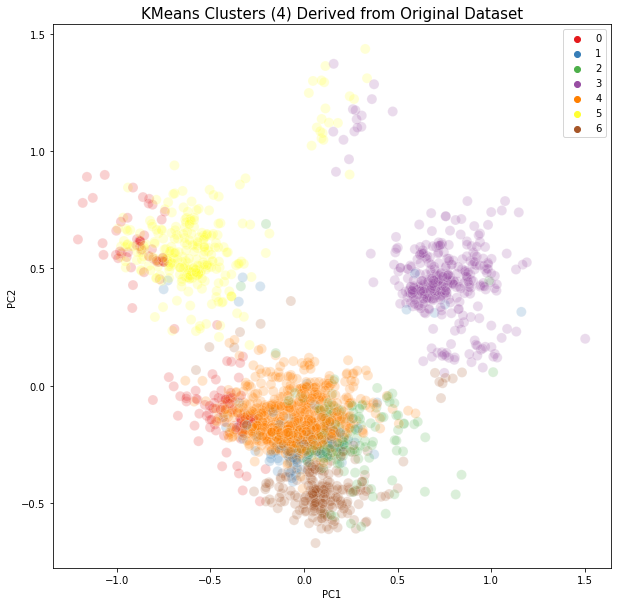

In [18]:
pca(dataset,7)

In [ ]:
# Silhouette analysis can be used to study the separation distance between the resulting clusters
def silhouette(dataset):
    kmeans_scale = KMeans(n_clusters=5, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(dataset)
    print('KMeans Scaled Silhouette Score: {}'
          .format(silhouette_score(dataset, kmeans_scale.labels_, metric='euclidean')))
    labels_scale = kmeans_scale.labels_

In [ ]:
silhouette(dataset)